<a href="https://colab.research.google.com/github/leticiasdrummond/Notebooks_IT306/blob/main/8_DRUMMOND_2025_10_28.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

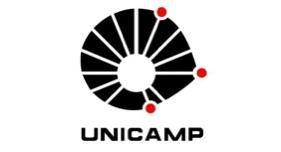

<center>
Carlos Alberto Medon Dias Ferraz

Carlos Eduardo Bento Honorio

Letícia Sampaio Drummond Valladares  
</center>
    

---

<center>

# **PROJETO I - MODELO DRUMMOND**

<center>

<center>

## **Tema: Sistemas Fotovoltaicos On-Grid e Off-Grid**

<center>

---



Professores:

   Dr. João Lucas, Dr. Gustavo Fraidenraich e Dr. Tárcio Barros
   
Monitoria:

   Me. João Frederico

<center>
03 de Novembro de 2025
<center>

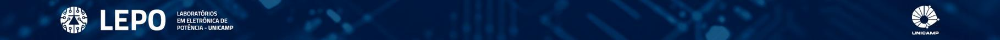

# **Introdução**

Este trabalho apresenta a modelagem de uma usina fotovoltaica (FV) utilizando a linguagem Python e a biblioteca PVlib. O objetivo principal é implementar uma cadeia completa de modelos físicos para simular a geração de energia FV, validando os resultados por meio de comparação com as simulações de referência realizadas no PVsyst.

A configuração da usina é padrão, instalação em solo, considerando um inversor com potência igual ou superior a 75 kW e um conjunto de módulos FV (monofaciais orientados para o sul), cuja potência total seja superior à do inversor. Não são consideradas as perdas por self-shading (sombreamento entre as strings).

A proposta contempla a análise de dados meteorológicos de diferentes anos, a aplicação de modelos físicos e matemáticos para estimativa da irradiância no plano dos módulos, o uso do modelo de diodo único (Single Diode Model – SDM) para cálculo da geração de energia, a consideração de perdas elétricas e térmicas e o desempenho do inversor.

Além disso, foi realizada uma simulação complementar de armazenamento em baterias LFP para avaliar a integração de sistemas híbridos. O trabalho busca não apenas reproduzir os resultados obtidos no PVsyst, mas também aprofundar a compreensão dos processos físicos envolvidos na conversão fotovoltaica.

Através do presente arquivo do notebook (.ipynb), apresentamos os códigos comentados, com descrições e títulos de seção antes de cada bloco de código.

---
---
# **Metodologia**

**Definição da Usina:**  

*   **Configuração Padrão**: Usina em solo, módulos monofaciais, orientação Sul (sem *self-shading*).
*  Inversor ≥75 kW e potência de módulo superior à do inversor.
*   Local: SOLRMAP University of Arizona (OASIS)
    
    - Latitude: 32.22969
    - Longitude: 110.95534
    - Elevação: 786 AMSL
    - Time Zone: MSTI


**Coleta de Dados Meteorológicos:** Aquisição de dados de satélite para 3 anos distintos (2019-2021), essenciais para o cálculo da irradiância.

**Modelagem em Python/PVlib:**

1.  Aplicação de modelos físicos para estimar a irradiância no plano dos módulos

2.  Cálculo da geração de energia usando o Modelo de Diodo Único (SDM)

3.  Consideração de perdas elétricas, desempenho do inversor e modelos de temperatura.

4.   Análise e Comparação: Avaliação do desempenho da usina e comparação detalhada com os resultados simulados no PVsyst

5.   Análise de armazenamento em baterias LFP para explorar a integração de sistemas híbrido
`.





### **Referencias Utilizadas**
- https://assessingsolar.org/notebooks/quality_asessment.html#
- DMxxxM10RT-B60HBT/HST 490~510W

- Best Practices Handbook for the Collection and Use of Solar Resource Data for Solar Energy Applications: Fourth Edition (2024)
- Manual de Engenharia para Sistemas Fotovoltaicos (2014).

## **Instalação de bibliotecas**

In [ ]:
!pip install pvlib

In [ ]:
!pip install folium

# **Ferramentas do PVLib**


In [ ]:
# Importação das bibliotecas necessárias
import pvlib # Biblioteca para modelagem de energia solar fotovoltaica (FV)
from pvlib import location  # Módulo para definir localização geográfica
from pvlib import pvsystem
from pvlib import tools
from pvlib.pvsystem import retrieve_sam
import folium
import pandas as pd # Manipulação de dados em formato de tabela
import matplotlib.pyplot as plt # Plotagem de gráficos
from sklearn.metrics import r2_score
from scipy.constants import Boltzmann, elementary_charge
import numpy as np
from pvlib import irradiance
from pvlib.iam import physical

In [ ]:
'''from google.colab import drive
drive.mount('/content/drive')'''

"from google.colab import drive\ndrive.mount('/content/drive')"

# **1. Avaliação do Recurso Solar**
Para efeito de avaliação da qualidade do recurso solar, na regiao do Arizona (localidade da estação solarimétrica indicada para o projeto) e definição do Database metereológico a ser aplicado na modelagem fotovoltaica, foram escolhidos os dados de GHI, DHI, DNI disponíveis nas bases de dados de satélite da NSRDB e do PVGIS e da estação solarimétrica UAT - OASIS/Arizona, para os anos de 2019, 2020 e 2021.
As medições, originalmente fornecidas em bases horária ou em minuto, foram adequadas para séries diárias para possibilitar a comparação entre elas.

## **1.1 Localização de Referência da Usina Fotovoltaica**
Para este trabalho, foi considerada a seguinte localização geográfica:

| **Parâmetro**       | **Valor**               | **Descrição**                          |
|----------------------|-------------------------|----------------------------------------|
| **Nome da Estação**    | UAT	SOLRMAP University of Arizona (OASIS)	        | Estação operada pelo NREL  Measurement and Instrumentation Data Center (MIDC)            |
| **Latitude**         |32.22969            | Coordenada geográfica                  |
| **Longitude**        | -110.95534            | Coordenada geográfica                  |
| **Altitude**         | 786 metros             | Elevação em relação ao nível do mar    |
| ***Time Zone***         | MST             | *Mountain Standard Time (MST) is 7 hours behind Coordinated Universal Time (UTC). This time zone is in use during standard time in: North America. *|

FONTE:
Andreas, A.; Wilcox, S.; (2010). Observed Atmospheric and Solar Information
System (OASIS); Tucson, Arizona (2025); NREL Report No. DA-5500-56494.
http://dx.doi.org/10.5439/1052226


*   **Mapa de Referência**




In [ ]:
# @title
## Mapa de Referência
# Coordenadas geográficas (latitude, longitude, altitude) de UAT
latitude = 32.22969
longitude = -110.95534
altitude = 786  # em metros


# Criar um mapa interativo centralizado na localização
mapa = folium.Map(
    location=[latitude, longitude],
    zoom_start=12,
    tiles='OpenStreetMap'  # Tipo de mapa
)

# Adicionar um marcador no mapa
folium.Marker(
    [latitude, longitude],
    popup="Localização selecionada: SOLRMAP University of Arizona (OASIS) (UAT)",
    icon=folium.Icon(color='green', icon='info-sign')
).add_to(mapa)

# Exibir o mapa
mapa

## **1.2 Características Relevantes da Região de Tucson**


    - Alta disponibilidade solar, com valor médio superior a 300 dias de sol/ano;
    - Região é um dos melhores locais dos EUA para geração FV;
    - Temperaturas elevadas no verão, com a atenção para a modelagem térmica na determinação das perdas;
    - Baixa nebulosidade, ideal para uso de modelos de céu claro (Haurwitz, Ineichen);
    - Clima desértico quente e seco, com ventos leves e poucas chuvas, cenário ideal para simulações de alto desempenho FV, mas requer controle de poeira.

## **1.3 Funcao da Posição Solar**

> Permite localizar a posição do sol em relação ao módulo na localidade do projeto.



In [ ]:
Latitude = 32.22969
Longitude = -110.95534
Altitude = 786
tz= 'Etc/GMT-7'

> Vale observar que usaremos a funcao do solar.position para o calculo da irradiacao incidente no módulo (Ver item 2.2)





---



## **1.4 Parâmetros Climáticos Iniciais para a Modelagem**
Para o início da modelagem foram utilizadas as seguintes variáveis metereológicas:

**Irradiação Solar**
   - GHI (Irradiância Global Horizontal) [W/m²]
   - DNI (Irradiância Direta Normal) [W/m²]
   - DHI (Irradiância Difusa Horizontal) [W/m²]

**Variáveis Ambientais**
   - Temperatura do Ar [°C]
   - Velocidade do Vento [m/s]

Para os anos 2019, 2020 e 2021, essas variáveis meteorológicas, em séries horárias (1h), foram extraidas nas bases de dados da NSRDB (NSRDB PSMv4), PVGIS (PVGIS 5.3 ERA 5) e dados medidos in loco da University of Arizona (OASIS)	Estaçao "UAT" operada pelo NREL Measurement and Instrumentation Data Center (MIDC):



## **1.5 Definicao do Database Metereológico**
A definição do Database metereológico a ser utilizado na modelagem da usina FV, foi baseada nos dados de GHI do perído de 2019 a 2021, extraídos dos dois satélites, os quais foram comparados com os dados medidos pela estação UAT, no mesmo período. A escolha do Databse metereológico, ou do satélite foi baseada em análises estatística dos parâmetros RMSE, MAE e R2.

### **1.5.1 NSRDB**

Os códigos a seguir consistem na importação dos dados horários para os anos de 2019, 2020 e 2021. Após a essa importação, os valores com discretização horária foram reajustados para escala diária.

In [ ]:
latitude = 32.22969   # Tucson, Arizona, EUA
longitude = -110.95534  # Tucson, Arizona, EUA
email = 'l298985@dac.unicamp.br'
api_key = 'UdBqiBH0jDG1heMhlE7sDhZSnJiDETFaPefAH7m4'
year_2019 = 2019
year_2020 = 2020
year_2021 = 2021

data_nsrdb_2019, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2019, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60)


data_nsrdb_2020, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2020, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60)


data_nsrdb_2021, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2021, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60)

print(data_nsrdb_2019)
print(data_nsrdb_2020)
print(data_nsrdb_2021)

                           Year  Month  Day  Hour  Minute  temp_air  temp_dew  \
2019-01-01 00:00:00-07:00  2019      1    1     0       0      4.00      2.00   
2019-01-01 01:00:00-07:00  2019      1    1     1       0      3.50      1.60   
2019-01-01 02:00:00-07:00  2019      1    1     2       0      3.10      1.20   
2019-01-01 03:00:00-07:00  2019      1    1     3       0      2.70      0.70   
2019-01-01 04:00:00-07:00  2019      1    1     4       0      2.20      0.30   
...                         ...    ...  ...   ...     ...       ...       ...   
2019-12-31 19:00:00-07:00  2019     12   31    19       0      8.00      5.70   
2019-12-31 20:00:00-07:00  2019     12   31    20       0      7.00      5.00   
2019-12-31 21:00:00-07:00  2019     12   31    21       0      6.10      4.10   
2019-12-31 22:00:00-07:00  2019     12   31    22       0      5.20      3.30   
2019-12-31 23:00:00-07:00  2019     12   31    23       0      4.50      2.50   

                           

In [ ]:
print(data_nsrdb_2019['ghi'].resample('D').sum())
print(data_nsrdb_2020['ghi'].resample('D').sum())
print(data_nsrdb_2021['ghi'].resample('D').sum())

2019-01-01 00:00:00-07:00   3708.00
2019-01-02 00:00:00-07:00   2985.00
2019-01-03 00:00:00-07:00   3931.00
2019-01-04 00:00:00-07:00   3973.00
2019-01-05 00:00:00-07:00   2731.00
                              ...  
2019-12-27 00:00:00-07:00   2145.00
2019-12-28 00:00:00-07:00   2055.00
2019-12-29 00:00:00-07:00   3803.00
2019-12-30 00:00:00-07:00   2288.00
2019-12-31 00:00:00-07:00   3296.00
Freq: D, Name: ghi, Length: 365, dtype: float64
2020-01-01 00:00:00-07:00   3740.00
2020-01-02 00:00:00-07:00   3838.00
2020-01-03 00:00:00-07:00   3719.00
2020-01-04 00:00:00-07:00   3853.00
2020-01-05 00:00:00-07:00   3990.00
                              ...  
2020-12-27 00:00:00-07:00   3321.00
2020-12-28 00:00:00-07:00   3025.00
2020-12-29 00:00:00-07:00   3694.00
2020-12-30 00:00:00-07:00   3911.00
2020-12-31 00:00:00-07:00   3306.00
Freq: D, Name: ghi, Length: 366, dtype: float64
2021-01-01 00:00:00-07:00   3816.00
2021-01-02 00:00:00-07:00   3722.00
2021-01-03 00:00:00-07:00   3762.00
2021

### **1.5.2 PVGIS**
Os códigos a seguir foram importados do PVGIS. Vale esclarecer que "POA Global" é equivalente ao GHI quando tratamos da incidência sobre a superfície com inclinacao nula.







**2019**

In [ ]:
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2019,  # inicia em jan.
        end=2019,    # termina em dez.
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df = data[0]  # DataFrame com os dados horários
    metadata = data[1]  # Metadados

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df.index[0]} até {df.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    print(df.head())

    print("\nColunas disponíveis:")
    for col in df.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2019-01-01 00:30:00+00:00 até 2019-12-31 23:30:00+00:00

Primeiras linhas dos dados:
                           poa_global  solar_elevation  temp_air  wind_speed  \
time                                                                           
2019-01-01 00:30:00+00:00        0.00            -0.92     10.95        5.31   
2019-01-01 01:30:00+00:00        0.00             0.00     10.09        4.90   
2019-01-01 02:30:00+00:00        0.00             0.00      9.42        4.62   
2019-01-01 03:30:00+00:00        0.00             0.00      8.98        4.69   
2019-01-01 04:30:00+00:00        0.00             0.00      8.51        4.83   

                           Int  
time                            
2019-01-01 00:30:00+00:00    0  
2019-01-01 01:30:00+00:00    0  
2019-01-01 02:30:00+00:00    0  
2019-01-01 03:30:00+00:00    0  
2019-01-01 04:30:00+00:00    0  

Co

**2020**

In [ ]:
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data_20 = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2020,  # Usará data padrão se None
        end=2020,    # Usará data padrão se None
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df_2020 = data_20[0]  # DataFrame com os dados horários
    metadata = data_20[1]  # Metadados

    # Rename the 'poa_global' column to 'poa_global_2020'
    df_2020 = df_2020.rename(columns={'poa_global': 'poa_global_2020'})

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df_2020.index[0]} até {df_2020.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    display(df_2020.head())

    print("\nColunas disponíveis:")
    for col in df_2020.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2020-01-01 00:30:00+00:00 até 2020-12-31 23:30:00+00:00

Primeiras linhas dos dados:


,poa_global_2020,solar_elevation,temp_air,wind_speed,Int
time,,,,,
2020-01-01 00:30:00+00:00,0.00,-0.92,13.73,1.72,0
2020-01-01 01:30:00+00:00,0.00,0.00,11.59,1.24,0
2020-01-01 02:30:00+00:00,0.00,0.00,11.71,0.28,0
2020-01-01 03:30:00+00:00,0.00,0.00,10.85,0.69,0
2020-01-01 04:30:00+00:00,0.00,0.00,10.05,1.03,0



Colunas disponíveis:
- poa_global_2020
- solar_elevation
- temp_air
- wind_speed
- Int

Metadados:
inputs: {'location': {'latitude': 32.22969, 'longitude': -110.95534, 'elevation': 752.0}, 'meteo_data': {'radiation_db': 'PVGIS-ERA5', 'meteo_db': 'ERA5', 'year_min': 2020, 'year_max': 2020, 'use_horizon': True, 'horizon_db': None, 'horizon_data': 'DEM-calculated'}, 'mounting_system': {'fixed': {'slope': {'value': 0, 'optimal': False}, 'azimuth': {'value': -179, 'optimal': False}, 'type': 'free-standing'}}, 'pv_module': {'technology': None, 'peak_power': None, 'system_loss': None}, 'descriptions': {'location': {'description': 'Selected location', 'variables': {'latitude': {'description': 'Latitude', 'units': 'decimal degree'}, 'longitude': {'description': 'Longitude', 'units': 'decimal degree'}, 'elevation': {'description': 'Elevation', 'units': 'm'}}}, 'meteo_data': {'description': 'Sources of meteorological data', 'variables': {'radiation_db': {'description': 'Solar radiation database'

**2021**

In [ ]:
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2021,  # Usará data padrão se None
        end=2021,    # Usará data padrão se None
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df_2021 = data[0]  # DataFrame com os dados horários
    metadata = data[1]  # Metadados

    # Rename the 'poa_global' column to 'poa_global_2021'
    df_2021 = df_2021.rename(columns={'poa_global': 'poa_global_2021'})

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df_2021.index[0]} até {df_2021.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    print(df_2021.head())

    print("\nColunas disponíveis:")
    for col in df_2021.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2021-01-01 00:30:00+00:00 até 2021-12-31 23:30:00+00:00

Primeiras linhas dos dados:
                           poa_global_2021  solar_elevation  temp_air  \
time                                                                    
2021-01-01 00:30:00+00:00             0.00            -0.92     14.15   
2021-01-01 01:30:00+00:00             0.00             0.00     13.01   
2021-01-01 02:30:00+00:00             0.00             0.00     11.78   
2021-01-01 03:30:00+00:00             0.00             0.00     10.30   
2021-01-01 04:30:00+00:00             0.00             0.00     10.66   

                           wind_speed  Int  
time                                        
2021-01-01 00:30:00+00:00        2.41    0  
2021-01-01 01:30:00+00:00        2.62    0  
2021-01-01 02:30:00+00:00        2.48    0  
2021-01-01 03:30:00+00:00        1.66    0  
2021-01-01 04

### **1.5.3 Dados de Estação UAT-OASIS**

Os dados medidos in loco são fundamentais para garantir uma escolha correta do satélite a ser utilizado na modelagem da usina FV.

**2019**

* **Medições Locais UAT**

In [ ]:
# @title
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20190101'),   # Start date jan 2019
                                                    pd.Timestamp('20191231'))   # End date dez 2019

# Rename columns to match expected names (Renomeia as colunas pela combinação esperada para melhor organização)
df_weather = df_weather.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather.head(3)

,Unnamed: 0,Year,DOY,MST,dni,...,wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2019-01-01 00:00:00-07:00,0,2019,1,0,-0.43,...,5.60,115.00,6.95,NaN,NaN
2019-01-01 00:01:00-07:00,0,2019,1,1,-0.29,...,6.17,113.90,7.70,NaN,NaN
2019-01-01 00:02:00-07:00,0,2019,1,2,-0.39,...,6.91,117.50,8.45,NaN,NaN


* **Mudanca da escala temporal**








In [ ]:
df_weather_ghi_horario_2019 = df_weather['ghi'].resample("H").mean()

/tmp/ipython-input-925422252.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2019 = df_weather['ghi'].resample("H").mean()


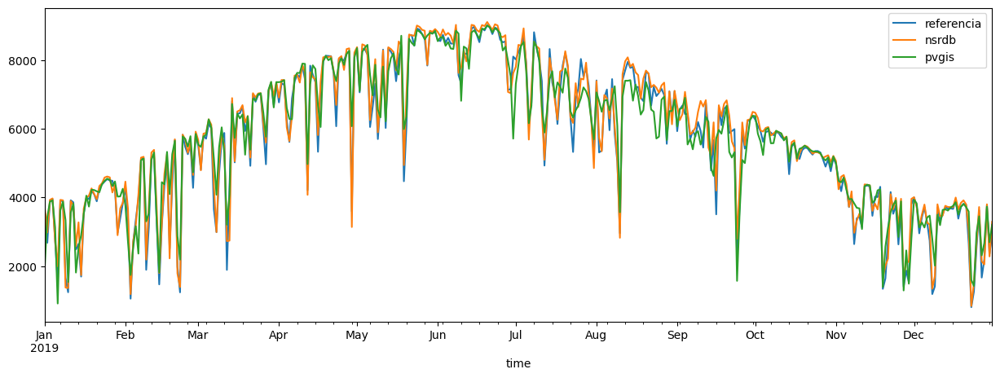

In [ ]:
df_weather_ghi_horario_2019.resample("D").sum().plot(label ='referencia', figsize=(15,5))
data_nsrdb_2019['ghi'].resample('D').sum().plot(label ='nsrdb', figsize=(15,5))
df['poa_global'].resample('D').sum().plot(label ='pvgis', figsize=(15,5))
plt.legend()

**2020**

* **Medições Locais UAT**

In [ ]:
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather_2020 = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20200101'),   # Start date jan 2020
                                                    pd.Timestamp('20201231'))   # End date dez 2020

# Rename columns to match expected names
df_weather_2020 = df_weather_2020.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather_2020.head(3)

,Unnamed: 0,Year,DOY,MST,dni,dhi,Global Horiz (tracker) [W/m^2],ghi,Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],temp_air,Rel Humidity [%],Station Pressure [mBar],wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2020-01-01 00:00:00-07:00,0,2020,1,0,-0.43,0.00,-1.85,-2.14,-7999.00,-7999.00,...,11.05,13.51,8.29,61.38,927.43,1.07,95.90,1.70,NaN,NaN
2020-01-01 00:01:00-07:00,0,2020,1,1,-0.43,0.00,-1.85,-2.06,-7999.00,-7999.00,...,11.03,13.51,8.28,61.21,927.42,1.18,98.10,1.70,NaN,NaN
2020-01-01 00:02:00-07:00,0,2020,1,2,-0.43,0.00,-1.85,-2.26,-7999.00,-7999.00,...,11.01,13.51,8.26,61.36,927.43,1.19,87.60,1.70,NaN,NaN


* **Mudanca da escala temporal**

In [ ]:
df_weather_ghi_horario_2020 = df_weather_2020['ghi'].resample("H").mean()

/tmp/ipython-input-882358708.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2020 = df_weather_2020['ghi'].resample("H").mean()


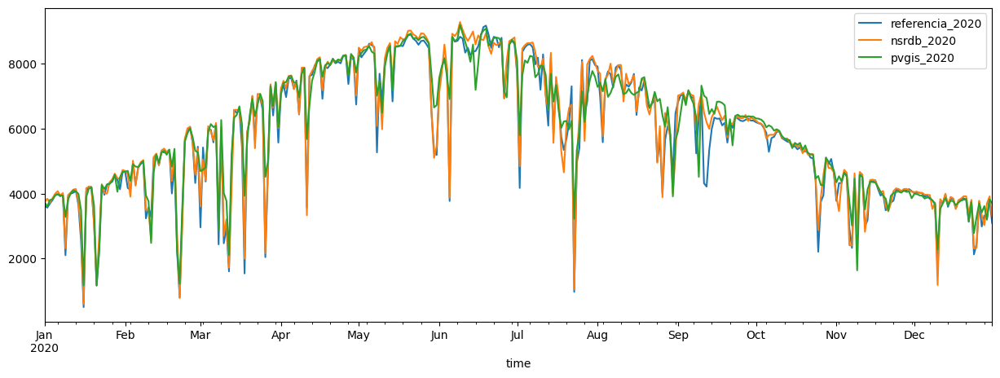

In [ ]:
df_weather_ghi_horario_2020.resample("D").sum().plot(label ='referencia_2020', figsize=(15,5))
data_nsrdb_2020['ghi'].resample('D').sum().plot(label ='nsrdb_2020', figsize=(15,5))
df_2020['poa_global_2020'].resample('D').sum().plot(label ='pvgis_2020', figsize=(15,5))
plt.legend()

**2021**

 * **MEDICOES LOCAIS UAT**

In [ ]:
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather_2021 = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20210101'),   # Start date jan 2021
                                                    pd.Timestamp('20211231'))   # End date dez 2021

# Rename columns to match expected names
df_weather_2021 = df_weather_2021.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather_2021.head(3)

,Unnamed: 0,Year,DOY,MST,dni,dhi,Global Horiz (tracker) [W/m^2],ghi,Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],temp_air,Rel Humidity [%],Station Pressure [mBar],wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2021-01-01 00:00:00-07:00,0,2021,1,0,-0.38,0.00,-1.85,-1.90,-246.90,-246.80,...,11.63,13.55,8.53,22.91,922.56,0.41,72.23,1.70,NaN,NaN
2021-01-01 00:01:00-07:00,0,2021,1,1,-0.43,0.00,-1.85,-1.91,-246.90,-246.80,...,11.62,13.55,8.54,22.92,922.56,0.32,15.03,0.95,NaN,NaN
2021-01-01 00:02:00-07:00,0,2021,1,2,-0.43,0.00,-1.84,-1.93,-246.70,-246.80,...,11.61,13.55,8.54,22.87,922.58,0.00,0.00,0.00,NaN,NaN


* **Mudanca da escala temporal**

In [ ]:
df_weather_ghi_horario_2021 = df_weather_2021['ghi'].resample("H").mean()

/tmp/ipython-input-2125263313.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2021 = df_weather_2021['ghi'].resample("H").mean()


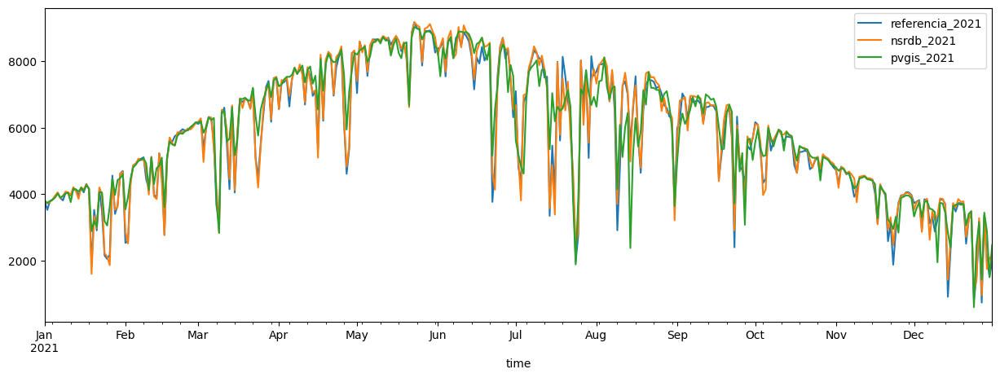

In [ ]:
df_weather_ghi_horario_2021.resample("D").sum().plot(label ='referencia_2021', figsize=(15,5))
data_nsrdb_2021['ghi'].resample('D').sum().plot(label ='nsrdb_2021', figsize=(15,5))
df_2021['poa_global_2021'].resample('D').sum().plot(label ='pvgis_2021', figsize=(15,5))
plt.legend()

### **1.5.4 Comparação das Métricas de Avaliação**
Pra escolha do Database metereológico foram aplicadas as métricas de avaliação RMSE, MAE e R2 para o GHI.


**Ano 2019**

In [ ]:
daily_reference_2019 = df_weather_ghi_horario_2019.resample("D").sum()
daily_nsrdb_2019 = data_nsrdb_2019['ghi'].resample('D').sum()
daily_pvgis_2019 = df['poa_global'].resample('D').sum()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2019, daily_nsrdb_2019))
mae = mean_absolute_error(daily_reference_2019, daily_nsrdb_2019)
r2 = r2_score(daily_reference_2019, daily_nsrdb_2019)
bias = np.mean(daily_nsrdb_2019 - daily_reference_2019)

print("\n--- Métricas de Avaliação NSRDB 2019---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2019, daily_pvgis_2019))
mae = mean_absolute_error(daily_reference_2019, daily_pvgis_2019)
r2 = r2_score(daily_reference_2019, daily_pvgis_2019)
bias = np.mean(daily_nsrdb_2019 - daily_pvgis_2019)

print("\n--- Métricas de Avaliação PVGIS 2019 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2019---
RMSE: 281.69 W/m²
MAE: 194.07 W/m²
R²: 0.9811
Bias (Calculado - Medido): 105.34 W/m²

--- Métricas de Avaliação PVGIS 2019 ---
RMSE: 550.27 W/m²
MAE: 356.16 W/m²
R²: 0.9278
Bias (Calculado - Medido): nan W/m²


* Constata-se que os dados do NSRDB, para o ano de 2019, possui melhor aderência aos dados medidos pela estação UAT, em comparação com os dados do PVGIS.

**Ano 2020**


In [ ]:
daily_reference_2020 = df_weather_ghi_horario_2020.resample("D").sum()
daily_nsrdb_2020 = data_nsrdb_2020['ghi'].resample('D').sum()
daily_pvgis_2020 = df_2020['poa_global_2020'].resample('D').sum()

In [ ]:
#dados do ano de 2020
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2020, daily_nsrdb_2020))
mae = mean_absolute_error(daily_reference_2020, daily_nsrdb_2020)
r2 = r2_score(daily_reference_2020, daily_nsrdb_2020)
bias = np.mean(daily_nsrdb_2020 - daily_reference_2020)

print("\n--- Métricas de Avaliação NSRDB 2020---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2020, daily_pvgis_2020))
mae = mean_absolute_error(daily_reference_2020, daily_pvgis_2020)
r2 = r2_score(daily_reference_2020, daily_pvgis_2020)
bias = np.mean(daily_nsrdb_2020 - daily_pvgis_2020)

print("\n--- Métricas de Avaliação PVGIS 2020 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2020---
RMSE: 305.36 W/m²
MAE: 183.08 W/m²
R²: 0.9755
Bias (Calculado - Medido): 85.95 W/m²

--- Métricas de Avaliação PVGIS 2020 ---
RMSE: 596.01 W/m²
MAE: 338.63 W/m²
R²: 0.9066
Bias (Calculado - Medido): nan W/m²


Constata-se que os dados do NSRDB, para o ano de 2020, continua sendo a base indicada.

**2021**


In [ ]:
daily_reference_2021 = df_weather_ghi_horario_2021.resample("D").sum()
daily_nsrdb_2021 = data_nsrdb_2021['ghi'].resample('D').sum()
daily_pvgis_2021 = df_2021['poa_global_2021'].resample('D').sum()

In [ ]:
#dados do ano de 2021
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2021, daily_nsrdb_2021))
mae = mean_absolute_error(daily_reference_2021, daily_nsrdb_2021)
r2 = r2_score(daily_reference_2021, daily_nsrdb_2021)
bias = np.mean(daily_nsrdb_2021 - daily_reference_2021)

print("\n--- Métricas de Avaliação NSRDB 2021---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2021, daily_pvgis_2021))
mae = mean_absolute_error(daily_reference_2021, daily_pvgis_2021)
r2 = r2_score(daily_reference_2021, daily_pvgis_2021)
bias = np.mean(daily_nsrdb_2021 - daily_pvgis_2021)

print("\n--- Métricas de Avaliação PVGIS 2021 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2021---
RMSE: 234.09 W/m²
MAE: 157.09 W/m²
R²: 0.9852
Bias (Calculado - Medido): 41.79 W/m²

--- Métricas de Avaliação PVGIS 2021 ---
RMSE: 613.11 W/m²
MAE: 379.52 W/m²
R²: 0.8984
Bias (Calculado - Medido): nan W/m²


* Novamente, constata-se que os dados do NSRDB, para o ano de 2021, continua sendo a base indicada em comparação com a base de dados do PVGIS.


---




### **1.5.5 Conclusão da Escolha da Base de Dados de Satélite (GHI)**

Em função das análises das métricas de avaliação realizadas nos itens anteriores, a base de dados do NSRDB será adotada para a geração dos dados de GHI, os quais serão utilizados para obter os valores de do DNI e DHI, por meio de diversos métodos de decomposicao.

## **1.6 Métodos de Decomposição para Determinacao do DNI e DHI**


A partir dos valores gerados de GHI da base de dados do NSRDB, os valores de DNI e DHI foram determinados pelos métodos de decomposicao, a saber:

1.   ERBS
2.   DIRINT
3.   DISC
4.   BOLAND

>   Como referência, foram utilizados os programas desenvolvidos no Notebook 3 e auxílio complementar de IA



### **1.6.1 Decomposição referente ao ano de 2019**










In [ ]:
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2019 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2019.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2019 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2019['ghi'], solpos['zenith'], data_nsrdb_2019.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

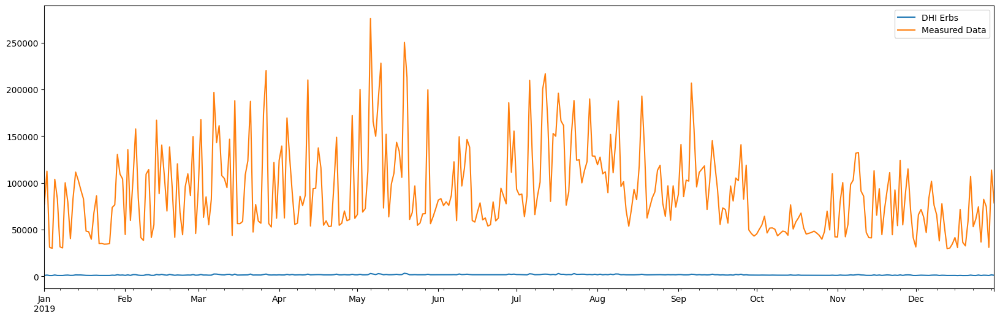

In [ ]:
out_erbs['dhi_erbs'].resample('D').sum().plot(label = 'DHI Erbs', figsize=(20,6))
df_weather['dhi'].resample('D').sum().plot(label = 'Measured Data')
plt.legend()
plt.show()

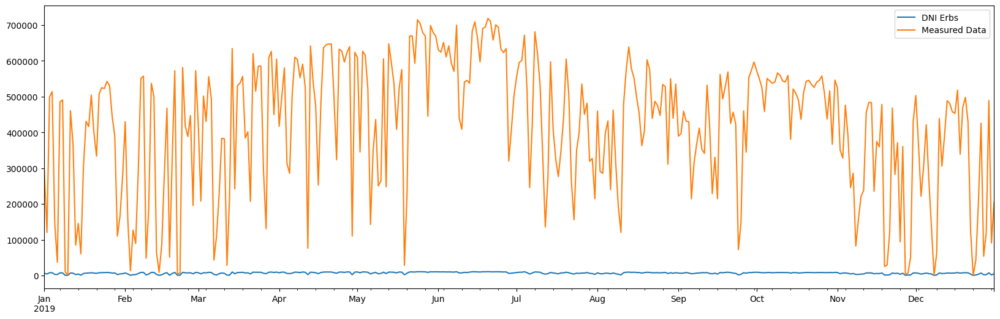

In [ ]:
out_erbs['dni_erbs'].resample('D').sum().plot(label = 'DNI Erbs', figsize=(20,6))
df_weather['dni'].resample('D').sum().plot(label = 'Measured Data')
plt.legend()
plt.show()

In [ ]:
#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2019 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index, data_nsrdb_2019['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2019['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2019 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2019 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index, data_nsrdb_2019['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2019['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2019.index)

546443.8472519233
523163.2794703701
534744.9623122863
626237.4166953493
33249306.14111601


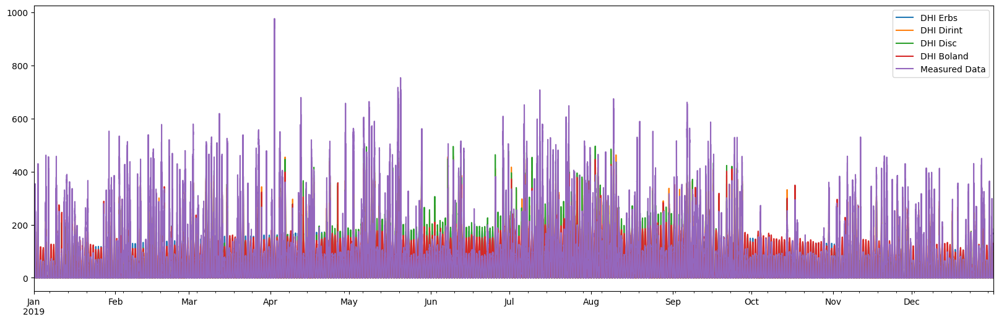

In [ ]:
#Comparando DHI
out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
out_dirint['dhi_dirint'].plot(label = 'DHI Dirint')
out_disc['dhi_disc'].plot(label = 'DHI Disc')
out_boland['dhi_boland'].plot(label = 'DHI Boland')
df_weather['dhi'].plot(label = 'Measured Data')
print(out_erbs['dhi_erbs'].sum())
print(out_dirint['dhi_dirint'].sum())
print(out_disc['dhi_disc'].sum())
print(out_boland['dhi_boland'].sum())
print(df_weather['dhi'].sum())
plt.legend()
plt.show()

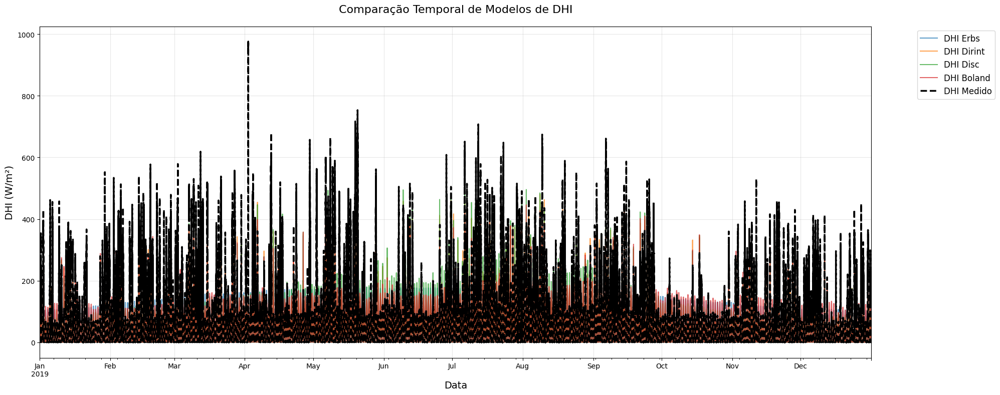

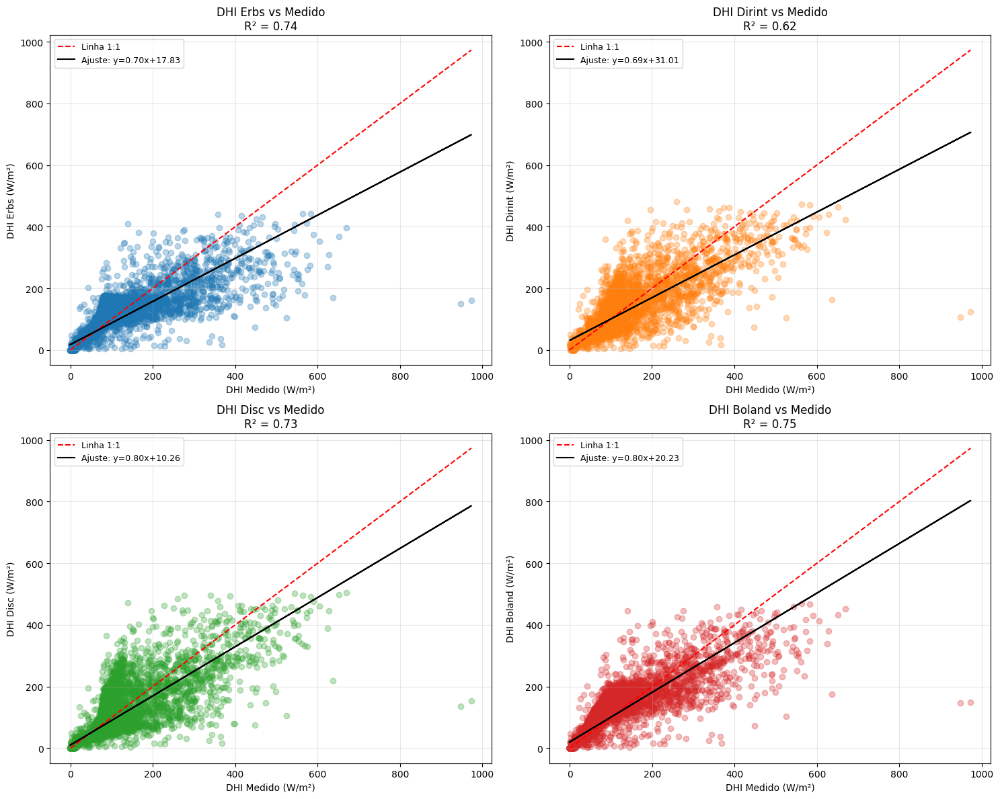

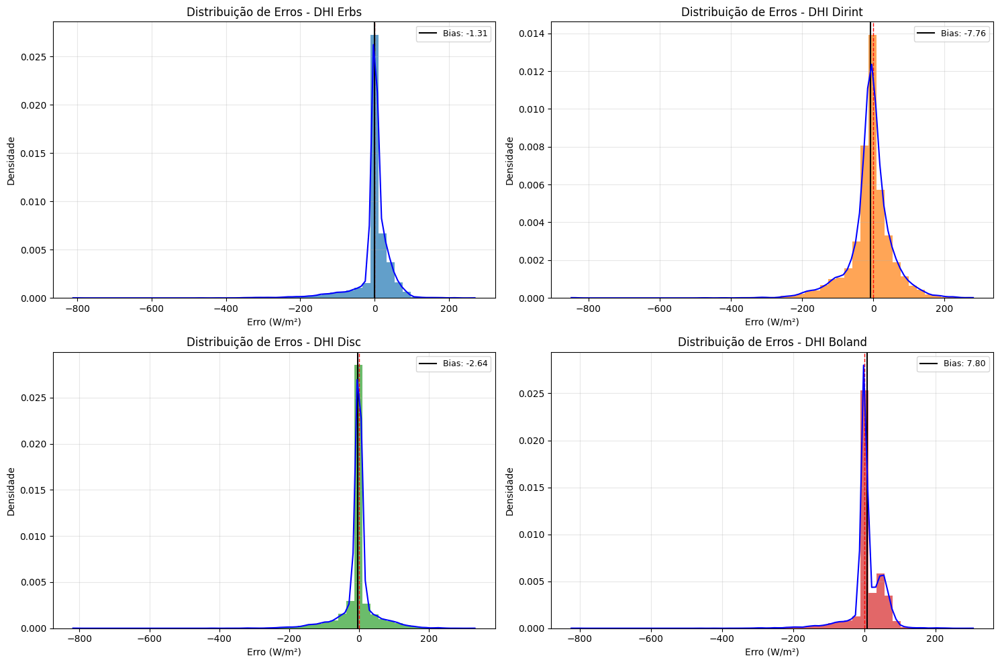

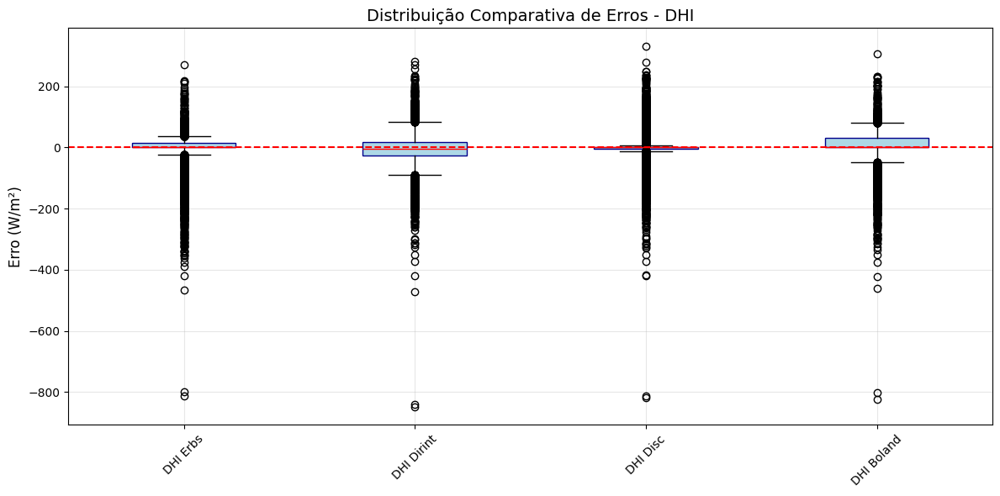

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DHI
models_dhi = {
    'DHI Erbs': out_erbs['dhi_erbs'],
    'DHI Dirint': out_dirint['dhi_dirint'],
    'DHI Disc': out_disc['dhi_disc'],
    'DHI Boland': out_boland['dhi_boland']
}

# Dados medidos para DHI
measured_dhi = df_weather['dhi']

# 1. Plot comparativo temporal DHI
plt.figure(figsize=(20, 8))
for name, model in models_dhi.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dhi.plot(label='DHI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DHI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DHI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DHI
metrics_dhi = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dhi.items():
    valid_idx = measured_dhi.notna() & model.notna()
    y_true = measured_dhi[valid_idx]
    y_pred = model[valid_idx]

    # Check if there are enough samples for metrics calculation
    if len(y_true) > 1:
        metrics_dhi.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
        metrics_dhi.loc[name] = {col: np.nan for col in metrics_dhi.columns}


# 3. Gráficos de dispersão com ajuste linear para DHI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dhi.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dhi.notna() & model.notna()
    x = measured_dhi[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        coef = np.polyfit(x, y, 1)
        poly1d_fn = np.poly1d(coef)
        plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')

        plt.xlabel('DHI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {metrics_dhi.loc[name, "R²"]:.2f}', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')

plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DHI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dhi.items(), 1):
    error = model - measured_dhi

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DHI
plt.figure(figsize=(12, 6))
all_errors_dhi = []
labels_dhi = []
for name, model in models_dhi.items():
    error = model - measured_dhi
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dhi.append(clean_error)
        labels_dhi.append(name)

if len(all_errors_dhi) > 0:
    plt.boxplot(all_errors_dhi, tick_labels=labels_dhi, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DHI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DHI.")

# Calculate total energy for DHI
energy_dhi = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dhi.items():
    energy_dhi.loc[name] = model.sum()
energy_dhi.loc['Dados Medidos'] = measured_dhi.sum()

2520496.7339820834
2633744.728839728
2659026.4197834213
2357155.214142291
152343142.62619603


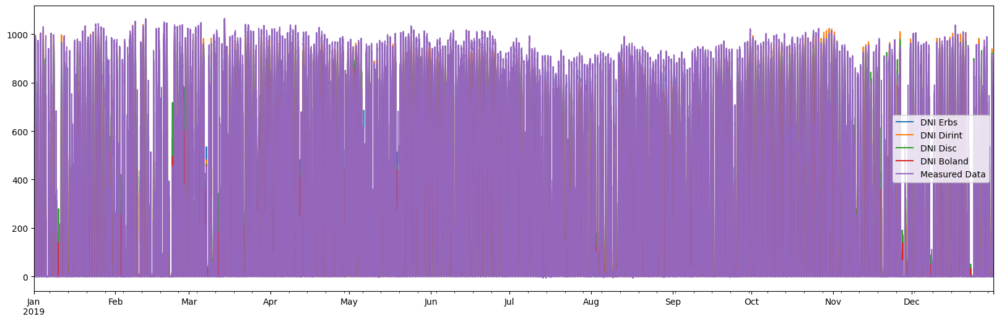

In [ ]:
#Comparando DNI
out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
out_dirint['dni_dirint'].plot(label = 'DNI Dirint')
out_disc['dni_disc'].plot(label = 'DNI Disc')
out_boland['dni_boland'].plot(label = 'DNI Boland')
df_weather['dni'].plot(label = 'Measured Data')
print(out_erbs['dni_erbs'].sum())
print(out_dirint['dni_dirint'].sum())
print(out_disc['dni_disc'].sum())
print(out_boland['dni_boland'].sum())
print(df_weather['dni'].sum())
plt.legend()
plt.show()

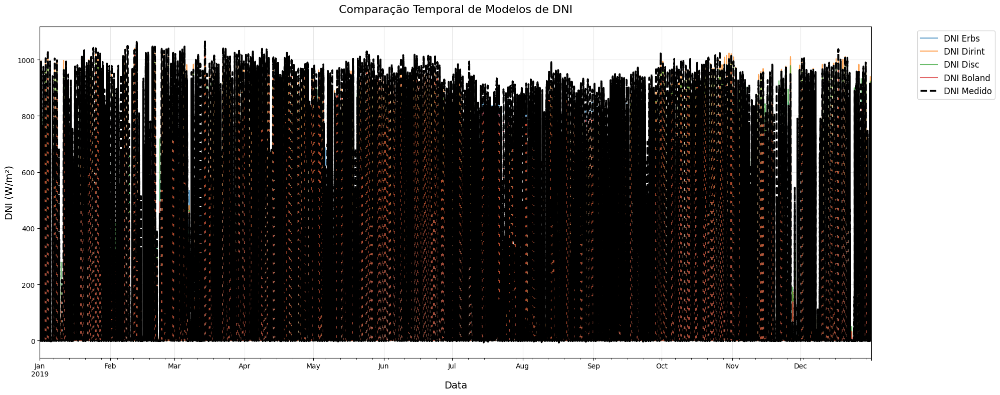

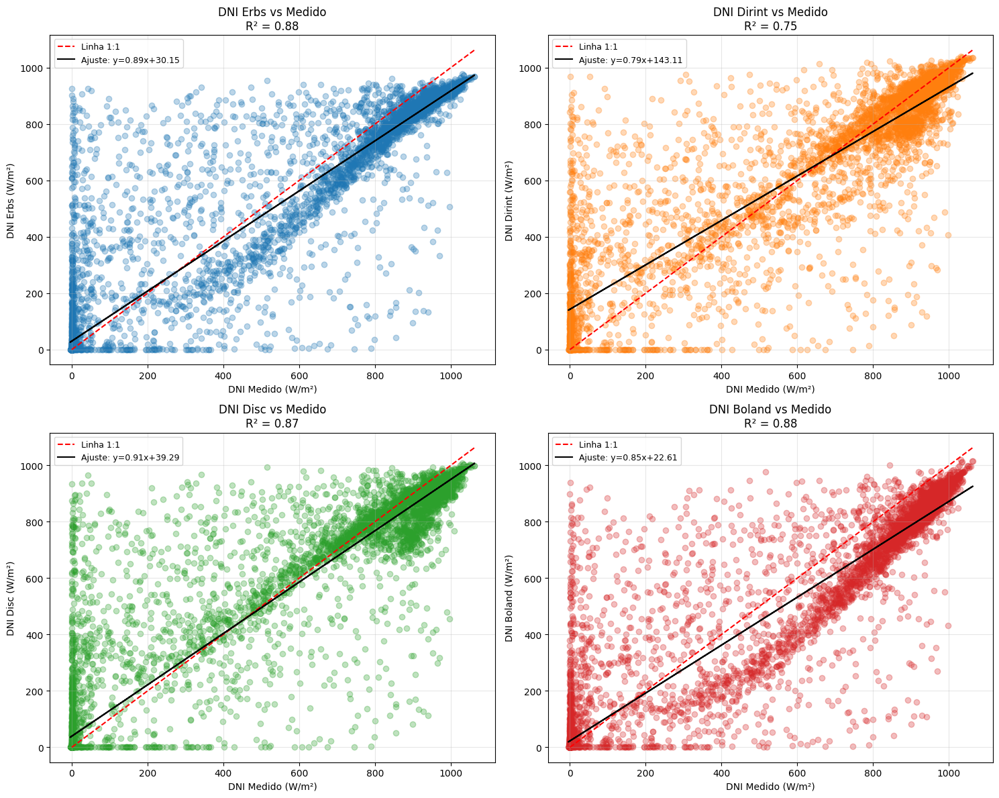

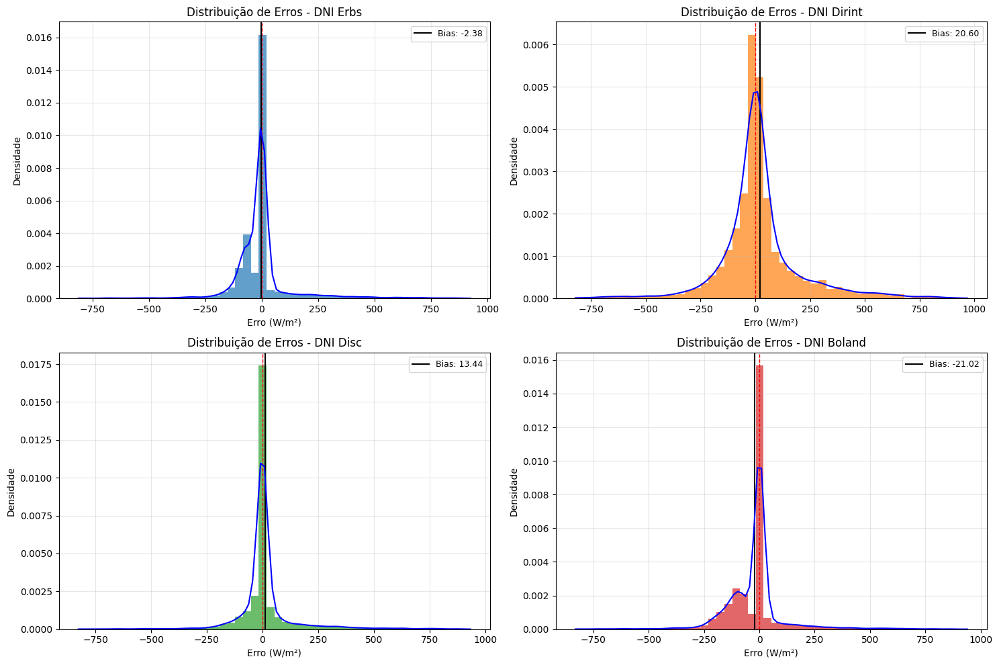

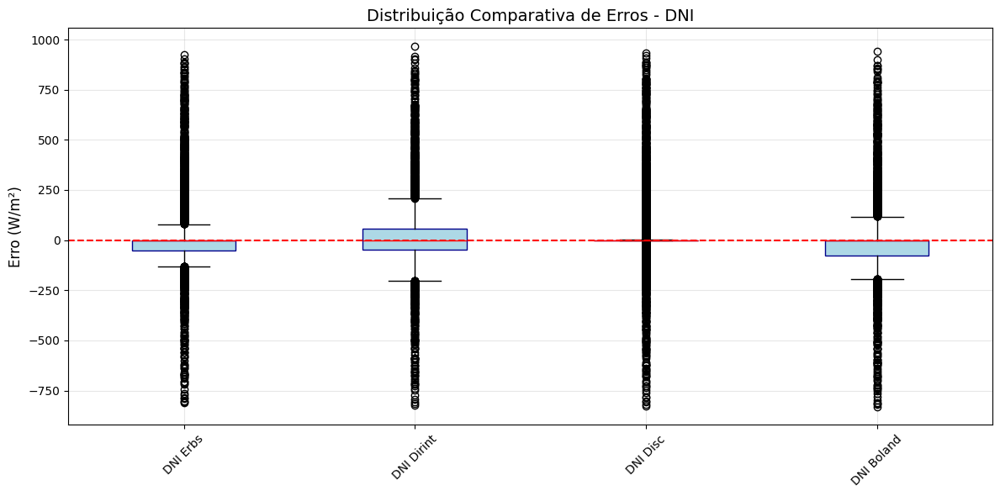


=== Métricas de Desempenho Combinadas (DHI e DNI) ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            135.15       61.80 0.88        -2.38   
                     DNI Dirint          186.24      111.05 0.75        20.60   
                     DNI Disc            139.09       58.89 0.87        13.44   
                     DNI Boland          136.62       69.64 0.88       -21.02   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN       

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) ===")
print(combined_results)

**Conclusões para ano de 2019:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland apresentou melhor resultado, pois os seus dados estão mais aderente aos dados medidos na estação da UAT;
*  DNI: Erbs apresentou o melhor resultado, seguido por Boland com pequena diferença.

### **1.6.2 Decomposição referente ao ano de 2020**



>

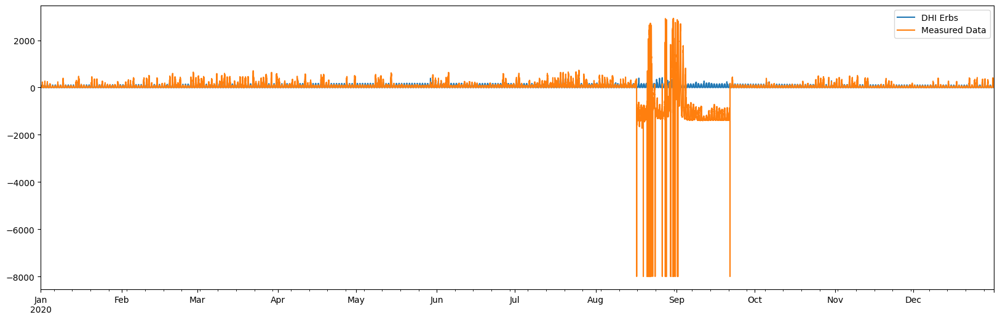

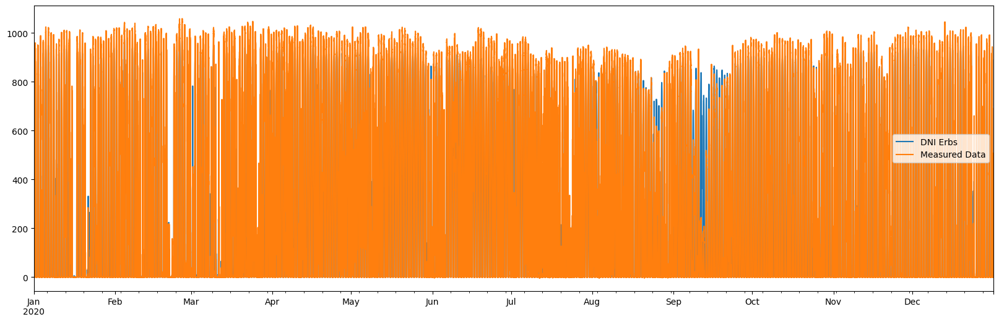

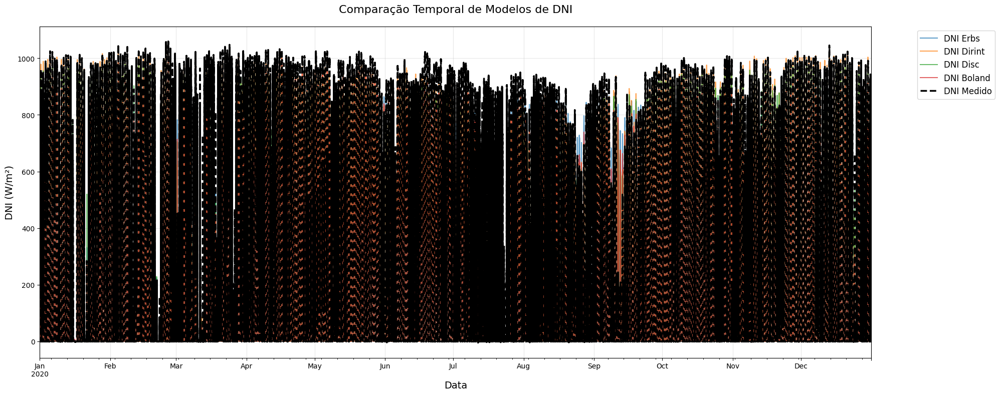

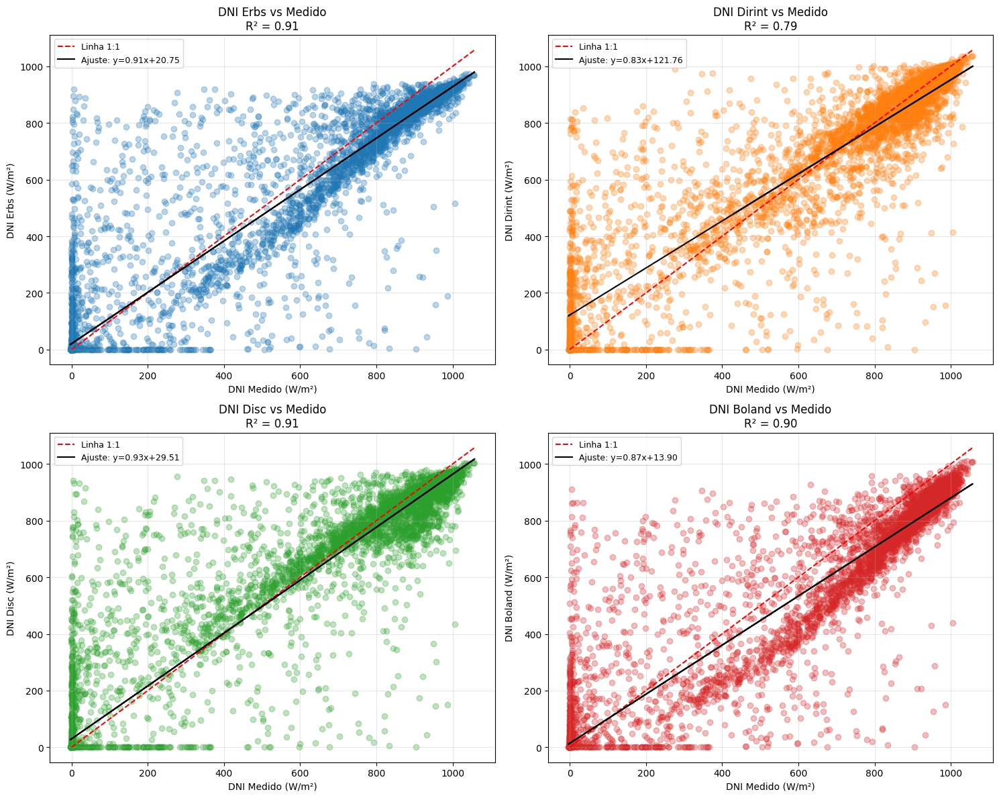

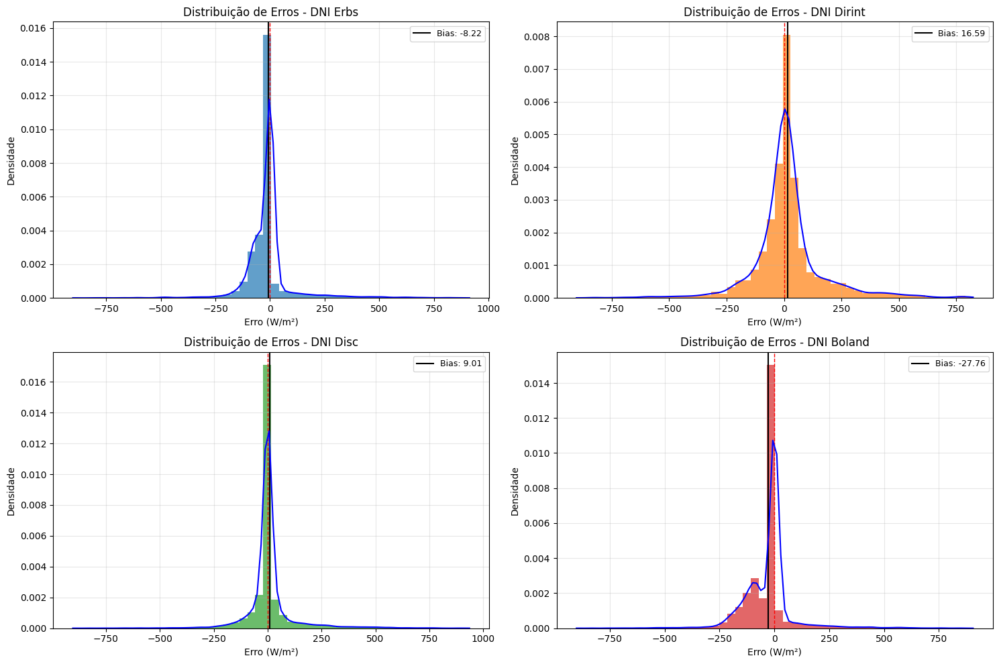

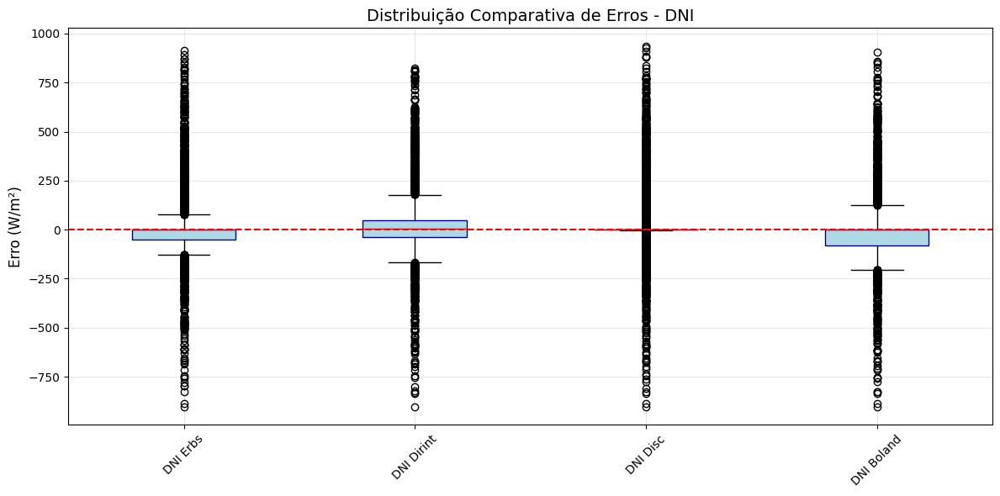


=== Métricas de Desempenho Combinadas (DHI e DNI) ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            118.77       54.08 0.91        -8.22   
                     DNI Dirint          159.71       93.54 0.79        16.59   
                     DNI Disc            118.72       49.41 0.91         9.01   
                     DNI Boland          122.99       63.85 0.90       -27.76   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN       

In [ ]:
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2020 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2020.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2020 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2020['ghi'], solpos['zenith'], data_nsrdb_2020.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
df_weather_2020['dhi'].plot(label = 'Measured Data')
plt.legend()
plt.show()

out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
df_weather_2020['dni'].plot(label = 'Measured Data')
plt.legend()
plt.show()

#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2020 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index, data_nsrdb_2020['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2020['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2020 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2020 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index, data_nsrdb_2020['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2020['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2020.index)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather_2020['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) ===")
print(combined_results)

**Conclusões para ano de 2020:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland teve melhor resultado, sendo mais aderente aos dados medidos;
*  DNI: Disc teve o melhor resultado, seguido por Erbs com pequena diferença.




---



---



### **1.6.3 Decomposição referente ao ano de 2021**

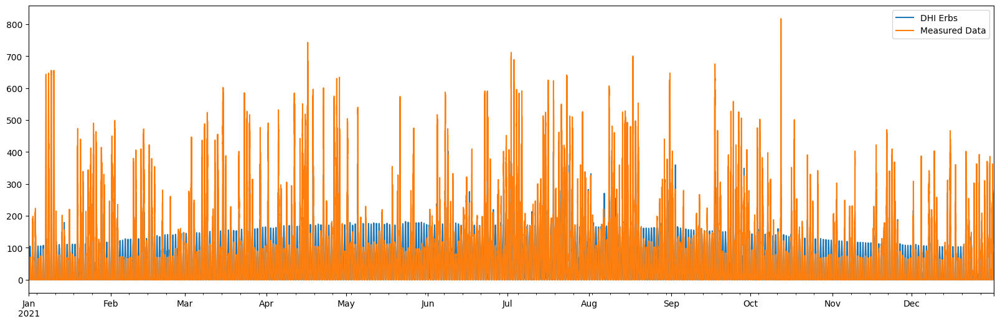

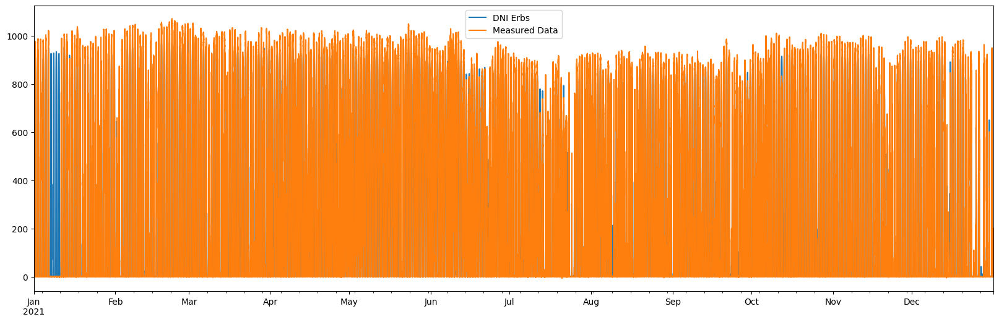

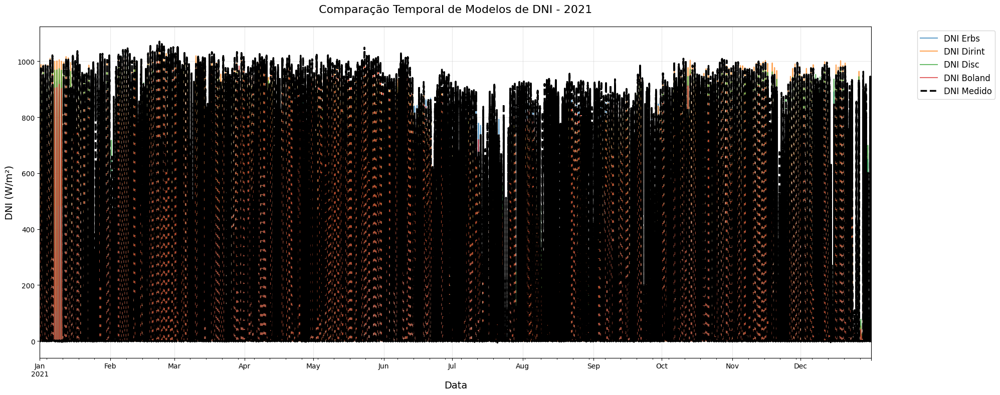

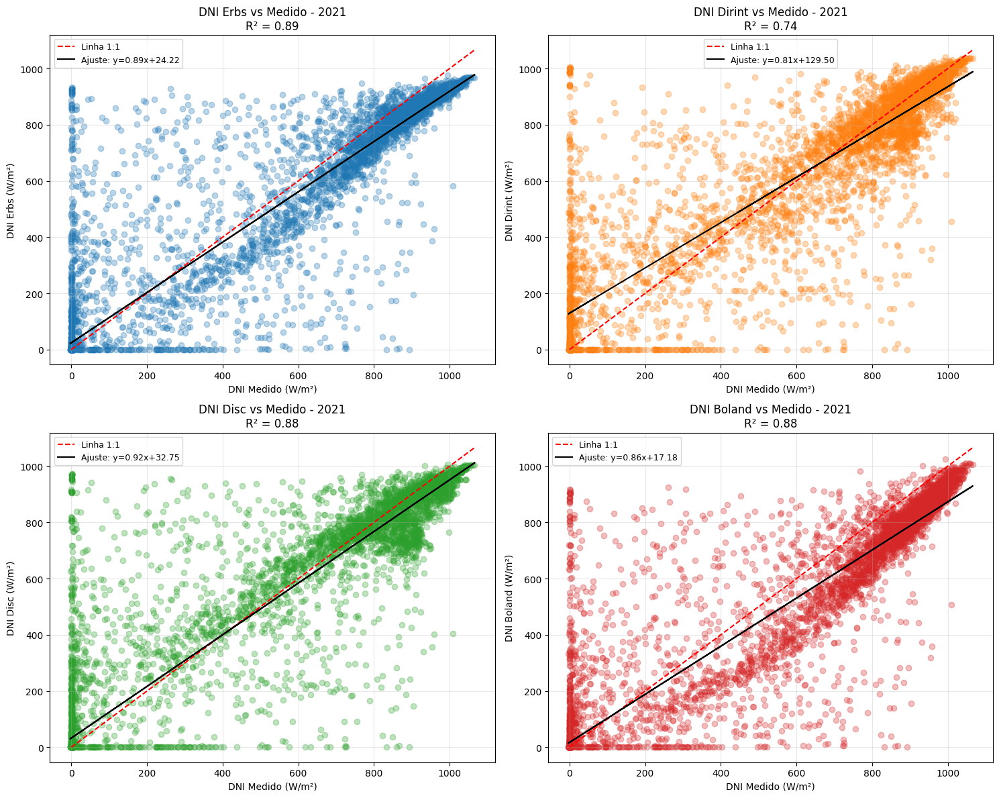

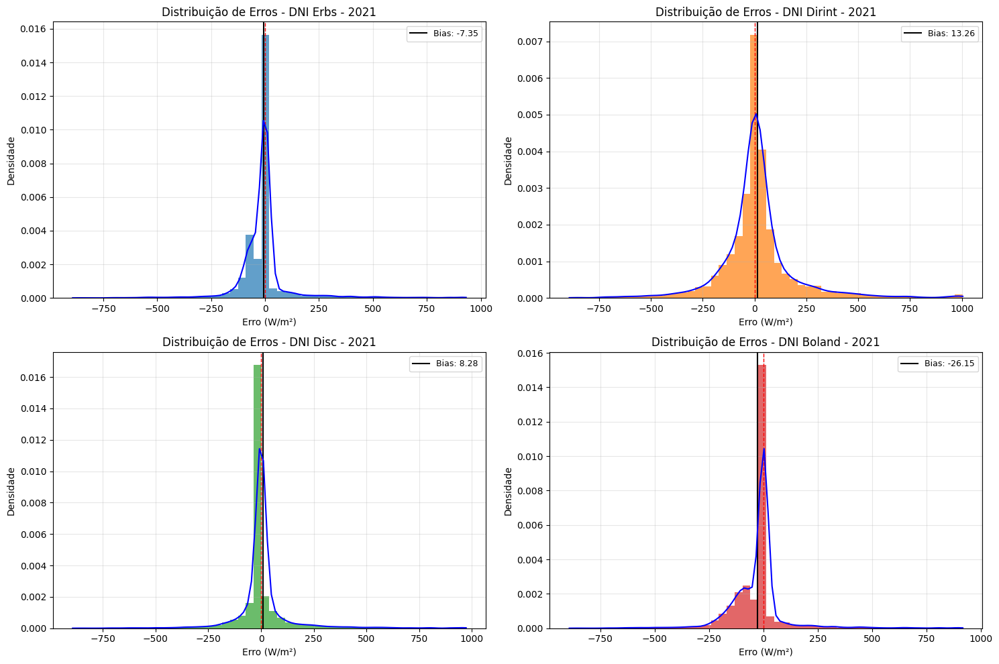

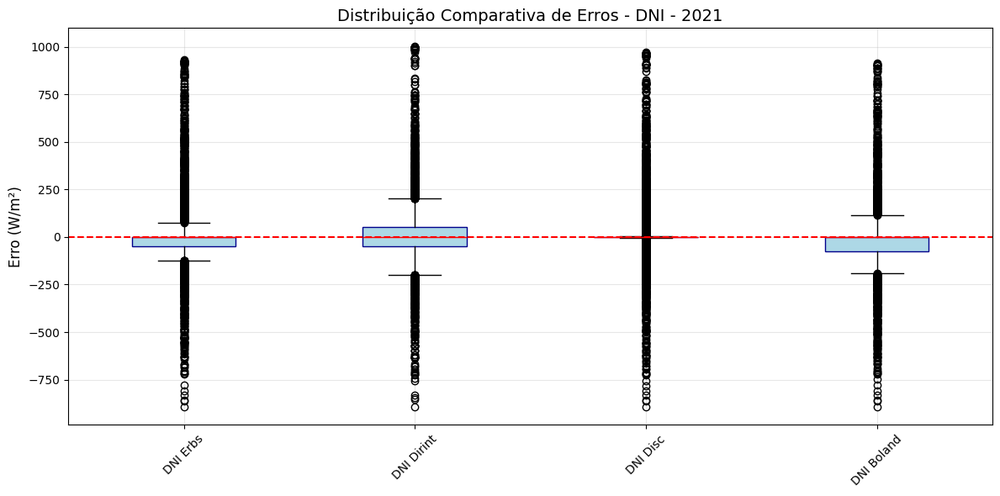


=== Métricas de Desempenho Combinadas (DHI e DNI) - 2021 ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            132.12       57.62 0.89        -7.35   
                     DNI Dirint          184.45      106.88 0.74        13.26   
                     DNI Disc            134.84       55.08 0.88         8.28   
                     DNI Boland          135.37       66.79 0.88       -26.15   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN

In [ ]:
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2021 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2021.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2021 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
df_weather_2021['dhi'].plot(label = 'Measured Data')
plt.legend()
plt.show()

out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
df_weather_2021['dni'].plot(label = 'Measured Data')
plt.legend()
plt.show()

#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2021 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index, data_nsrdb_2021['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2021['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2021 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2021 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index, data_nsrdb_2021['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2021['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2021.index)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather_2021['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI - 2021', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido - 2021\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido - 2021', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name} - 2021', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI - 2021', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) - 2021 ===")
print(combined_results)

**Conclusões para ano de 2021:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland apresentou melhor resultado, sendo mais aderente aos dados medidos;
*  DNI: Erbs apresentou o melhor resultado.

### **1.6.4 Análise dos Resultados de Decomposicao para 2019 a 2021**

Para modelagem foram escolhidos os dados relativos ao ano de  2021 que apresentaram melhores resultados, conforme a métrica RMSE, em comparação com os dados de 2019 e 2020

O modelo Boland apresentou melhor performance para DHI, enquanto para DNI os modelos Erbs e Disc se alternam como melhores dependendo do critério de avaliação

Definição dos modelos a serem utilizados na modelagem:

**DHI**
Modelo Boland

**DNI**
Modelo Erbs

**GHI**
Valores medidos para o ano de 2021.

### **1.6.5 Criacao de Dataframe com GHI medido e DNI e DHI modelado**



---



---



DATAFRAME CONSOLIDADO CRIADO COM SUCESSO
Dimensões: (8760, 8) (linhas, colunas)
Período: 2021-01-01 00:00:00-07:00 a 2021-12-31 23:00:00-07:00
Fuso horário: Etc/GMT+7

Primeiras 5 linhas:
                           GHI_medido_UAT  DNI_erbs_modelado  \
2021-01-01 00:00:00-07:00            0.00               0.00   
2021-01-01 01:00:00-07:00            0.00               0.00   
2021-01-01 02:00:00-07:00            0.00               0.00   
2021-01-01 03:00:00-07:00            0.00               0.00   
2021-01-01 04:00:00-07:00            0.00               0.00   

                           DHI_boland_modelado  GHI_nsrdb  DNI_nsrdb  \
2021-01-01 00:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 01:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 02:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 03:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 04:00:00-07:00                 0.00       0.00       0.0

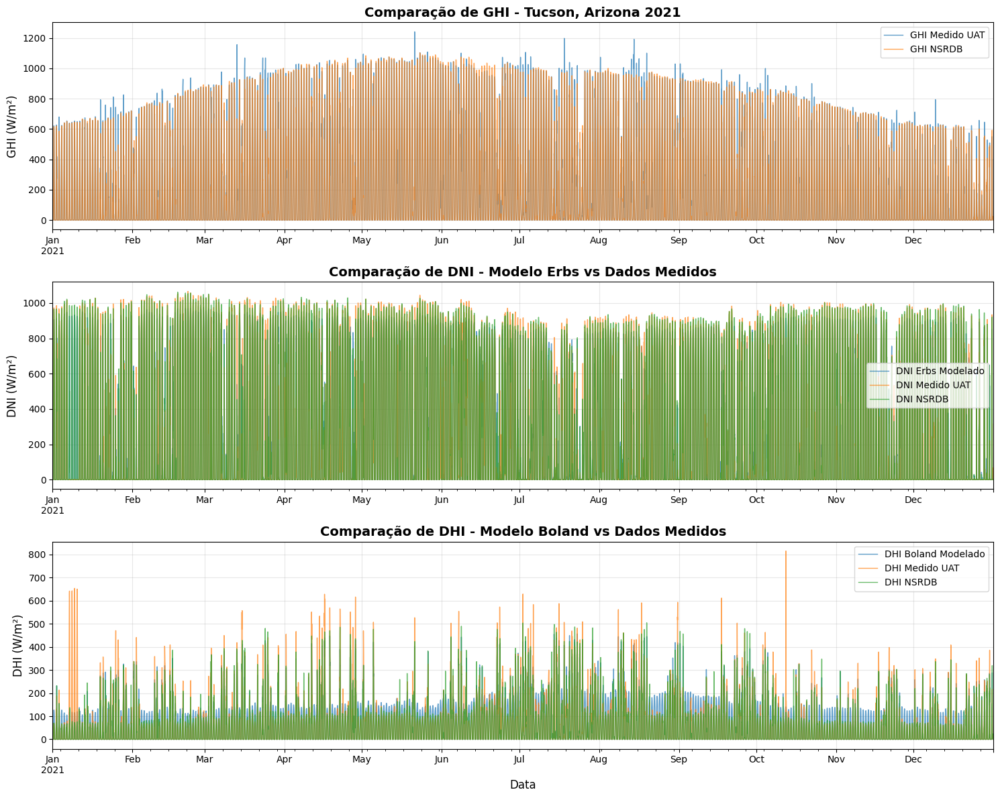


CÁLCULO DE MÉTRICAS DE PERFORMANCE

=== Métricas de Performance dos Modelos ===
(Comparação com dados medidos da estação UAT)
       Modelo  RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  n_amostras
0    DNI Erbs       132.12       57.42 0.89        -7.55        8760
1  DHI Boland        48.82       24.80 0.74         9.50        8760

ANÁLISE DE CORRELAÇÃO

Matriz de correlação entre variáveis principais:
                     GHI_medido_UAT  DNI_erbs_modelado  DHI_boland_modelado  \
GHI_medido_UAT                 1.00               0.90                 0.79   
DNI_erbs_modelado              0.90               1.00                 0.69   
DHI_boland_modelado            0.79               0.69                 1.00   
GHI_nsrdb                      0.98               0.92                 0.80   
DNI_medido_UAT                 0.89               0.94                 0.63   
DHI_medido_UAT                 0.63               0.50                 0.87   

                     GHI_nsrdb  DNI_med

,GHI_medido_UAT,DNI_erbs_modelado,DHI_boland_modelado,GHI_nsrdb,DNI_nsrdb,DHI_nsrdb,DNI_medido_UAT,DHI_medido_UAT
2021-01-01 00:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 01:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 02:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 03:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 04:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 20:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 21:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 22:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [ ]:
import pandas as pd
import numpy as np
from pvlib import irradiance, solarposition
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Criar DataFrame consolidado com os dados solicitados
# Usamos o índice do NSRDB 2021 como base temporal
df_consolidado = pd.DataFrame(index=data_nsrdb_2021.index)

# 1. GHI MEDIDO DA ESTAÇÃO UAT (Universidade do Arizona)
# Adiciona o GHI medido pela estação terrestre UAT ao DataFrame
df_consolidado['GHI_medido_UAT'] = df_weather_2021['ghi']

# 2. CÁLCULO DA POSIÇÃO SOLAR
# Necessário para os modelos de decomposição (Erbs e Boland)
solpos = pvlib.solarposition.get_solarposition(
    time=data_nsrdb_2021.index,  # Usa o índice temporal do NSRDB 2021
    latitude=latitude,           # Latitude de Tucson, Arizona
    longitude=longitude          # Longitude de Tucson, Arizona
)

# 3. DNI MODELADO ERBS BASEADO NO GHI NSRDB
# O modelo Erbs decompõe o GHI em DNI e DHI usando relações empíricas
# Parâmetros: GHI do NSRDB, ângulo zenital solar, e índice temporal
out_erbs = irradiance.erbs(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
df_consolidado['DNI_erbs_modelado'] = out_erbs['dni']

# 4. DHI MODELADO BOLAND BASEADO NO GHI NSRDB
# O modelo Boland é outro método de decomposição que usa o GHI para estimar DHI
# Parâmetros: GHI do NSRDB, ângulo zenital solar, e índice temporal
out_boland = irradiance.boland(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
df_consolidado['DHI_boland_modelado'] = out_boland['dhi']

# 5. DADOS ADICIONAIS PARA REFERÊNCIA E COMPARAÇÃO
# Adiciona os dados originais do NSRDB para servir como base de comparação
df_consolidado['GHI_nsrdb'] = data_nsrdb_2021['ghi']      # GHI do NSRDB
df_consolidado['DNI_nsrdb'] = data_nsrdb_2021['dni']      # DNI do NSRDB
df_consolidado['DHI_nsrdb'] = data_nsrdb_2021['dhi']      # DHI do NSRDB

# Adiciona os dados medidos da estação UAT para validação dos modelos
df_consolidado['DNI_medido_UAT'] = df_weather_2021['dni']  # DNI medido UAT
df_consolidado['DHI_medido_UAT'] = df_weather_2021['dhi']  # DHI medido UAT

# 6. LIMPEZA E TRATAMENTO DE DADOS
# Remove valores infinitos que podem causar problemas em cálculos estatísticos
df_consolidado = df_consolidado.replace([np.inf, -np.inf], np.nan)

# Define valores negativos como zero (irradiância não pode ser negativa)
df_consolidado[df_consolidado < 0] = 0

# Preenche valores NaN com zero (principalmente para horas noturnas)
df_consolidado = df_consolidado.fillna(0)

# 7. RELATÓRIO INICIAL DO DATAFRAME
print("="*60)
print("DATAFRAME CONSOLIDADO CRIADO COM SUCESSO")
print("="*60)
print(f"Dimensões: {df_consolidado.shape} (linhas, colunas)")
print(f"Período: {df_consolidado.index.min()} a {df_consolidado.index.max()}")
print(f"Fuso horário: {df_consolidado.index.tz}")

print("\nPrimeiras 5 linhas:")
print(df_consolidado.head())

print("\nÚltimas 5 linhas:")
print(df_consolidado.tail())

print("\nEstatísticas descritivas:")
print(df_consolidado.describe())

# Verificar se há valores missing após o tratamento
print(f"\nValores missing por coluna (após tratamento):")
print(df_consolidado.isnull().sum())

# 8. VISUALIZAÇÃO COMPARATIVA DOS DADOS
print("\n" + "="*60)
print("GERANDO VISUALIZAÇÕES COMPARATIVAS")
print("="*60)

plt.figure(figsize=(15, 12))

# Plot 1: Comparação de GHI
plt.subplot(3, 1, 1)
df_consolidado['GHI_medido_UAT'].plot(label='GHI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['GHI_nsrdb'].plot(label='GHI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de GHI - Tucson, Arizona 2021', fontsize=14, fontweight='bold')
plt.ylabel('GHI (W/m²)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot 2: Comparação de DNI
plt.subplot(3, 1, 2)
df_consolidado['DNI_erbs_modelado'].plot(label='DNI Erbs Modelado', alpha=0.7, linewidth=1)
df_consolidado['DNI_medido_UAT'].plot(label='DNI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['DNI_nsrdb'].plot(label='DNI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de DNI - Modelo Erbs vs Dados Medidos', fontsize=14, fontweight='bold')
plt.ylabel('DNI (W/m²)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot 3: Comparação de DHI
plt.subplot(3, 1, 3)
df_consolidado['DHI_boland_modelado'].plot(label='DHI Boland Modelado', alpha=0.7, linewidth=1)
df_consolidado['DHI_medido_UAT'].plot(label='DHI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['DHI_nsrdb'].plot(label='DHI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de DHI - Modelo Boland vs Dados Medidos', fontsize=14, fontweight='bold')
plt.ylabel('DHI (W/m²)', fontsize=12)
plt.xlabel('Data', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 9. CÁLCULO DE MÉTRICAS DE PERFORMANCE
print("\n" + "="*60)
print("CÁLCULO DE MÉTRICAS DE PERFORMANCE")
print("="*60)

def calcular_metricas(y_true, y_pred, nome):
    """
    Calcula métricas de performance para comparar dados medidos vs modelados

    Parâmetros:
    y_true: dados medidos (ground truth)
    y_pred: dados modelados (previsões)
    nome: nome do modelo para identificação

    Retorna:
    Dicionário com métricas de performance
    """
    # Filtrar apenas valores válidos para análise
    mask = (y_true.notna()) & (y_pred.notna()) & (y_true >= 0) & (y_pred >= 0)
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]

    if len(y_true_clean) > 0:
        return {
            'Modelo': nome,
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true_clean, y_pred_clean)),
            'MAE (W/m²)': mean_absolute_error(y_true_clean, y_pred_clean),
            'R²': r2_score(y_true_clean, y_pred_clean),
            'Bias (W/m²)': np.mean(y_pred_clean - y_true_clean),
            'n_amostras': len(y_true_clean)
        }
    else:
        print(f"Aviso: Não há dados válidos para calcular métricas de {nome}")
        return None

# Calcular métricas para o modelo Erbs (DNI)
metricas_dni = calcular_metricas(
    df_consolidado['DNI_medido_UAT'],
    df_consolidado['DNI_erbs_modelado'],
    'DNI Erbs'
)

# Calcular métricas para o modelo Boland (DHI)
metricas_dhi = calcular_metricas(
    df_consolidado['DHI_medido_UAT'],
    df_consolidado['DHI_boland_modelado'],
    'DHI Boland'
)

# Criar DataFrame com métricas se os cálculos foram bem-sucedidos
if metricas_dni and metricas_dhi:
    df_metricas = pd.DataFrame([metricas_dni, metricas_dhi])
    print("\n=== Métricas de Performance dos Modelos ===")
    print("(Comparação com dados medidos da estação UAT)")
    print(df_metricas.round(3))
else:
    print("Não foi possível calcular todas as métricas")

# 10. ANÁLISE DE CORRELAÇÃO
print("\n" + "="*60)
print("ANÁLISE DE CORRELAÇÃO")
print("="*60)

# Calcular matriz de correlação entre as principais variáveis
variaveis_principais = [
    'GHI_medido_UAT', 'DNI_erbs_modelado', 'DHI_boland_modelado',
    'GHI_nsrdb', 'DNI_medido_UAT', 'DHI_medido_UAT'
]

correlacao = df_consolidado[variaveis_principais].corr()
print("\nMatriz de correlação entre variáveis principais:")
print(correlacao.round(3))

# 11. SALVAR DATAFRAME EM ARQUIVO
print("\n" + "="*60)
print("EXPORTANDO RESULTADOS")
print("="*60)

# Salvar DataFrame consolidado em arquivo CSV
nome_arquivo = 'dados_irradiancia_consolidados_2021.csv'
df_consolidado.to_csv(nome_arquivo)
print(f"DataFrame salvo como '{nome_arquivo}'")

# Salvar apenas as colunas principais em um arquivo separado
colunas_principais = ['GHI_medido_UAT', 'DNI_erbs_modelado', 'DHI_boland_modelado']
df_principal = df_consolidado[colunas_principais]
df_principal.to_csv('dados_principais_irradiancia_2021.csv')
print(f"DataFrame principal (apenas colunas solicitadas) salvo como 'dados_principais_irradiancia_2021.csv'")

# 12. RESUMO FINAL
print("\n" + "="*60)
print("RESUMO DO DATAFRAME CRIADO")
print("="*60)
print("COLUNAS PRINCIPAIS:")
print("1. GHI_medido_UAT: GHI medido pela estação UAT (Tucson)")
print("2. DNI_erbs_modelado: DNI modelado usando Erbs baseado no GHI NSRDB")
print("3. DHI_boland_modelado: DHI modelado usando Boland baseado no GHI NSRDB")

print("\nCOLUNAS DE REFERÊNCIA:")
print("4. GHI_nsrdb, DNI_nsrdb, DHI_nsrdb: Dados originais do NSRDB")
print("5. DNI_medido_UAT, DHI_medido_UAT: Dados medidos da UAT para validação")

print(f"\nPERÍODO: {df_consolidado.index.min().strftime('%Y-%m-%d')} a {df_consolidado.index.max().strftime('%Y-%m-%d')}")
print(f"TOTAL DE REGISTROS: {len(df_consolidado):,}")
print(f"FREQUÊNCIA: Horária")

# Retornar o DataFrame consolidado para uso posterior
print("\nDataFrame pronto para uso!")
df_consolidado

## **1.7 Qualidade do Recurso Solar**

Para compreendermos a qualidade, composição e comportamento do recurso solar no local da usina FV localizada em OASIS- Arizona, foram utilizadas as seguintes ferramentas gráficas de análise solarimétrica:

* Fração difusa (DHI/GHI) vs Índice de claridade (Kt)
* Componentes do recurso solar na horizontal vs ângulo zenital
* Inspeção visual de duas dimensões(GHI, DNI e DHI)

### **1.7.1 Fração Difusa (DHI/GHI) vs Índice de claridade (Kt)**
Mostra a relação entre a fração difusa da radiação e o nível de transparência da atmosfera, ou seja, classifica o tipo de céu (limpo, misto, nublado), bem como validar a decomposição do modelo

Fração Difusa = DHI / GHI
Índice de Claridade Atmosférica (Kt) = GHI / (H₀ × cos(θz))

H₀: Irradiância extraterrestre no plano horizontal
θz: Ângulo zenital solar
Análise:

Kt alto (> 0,6): Condições de céu claro → menor fração difusa
Kt baixo (< 0,3): Céu encoberto → maior fração difusa
Relação inversa esperada entre Kt e fração difusa


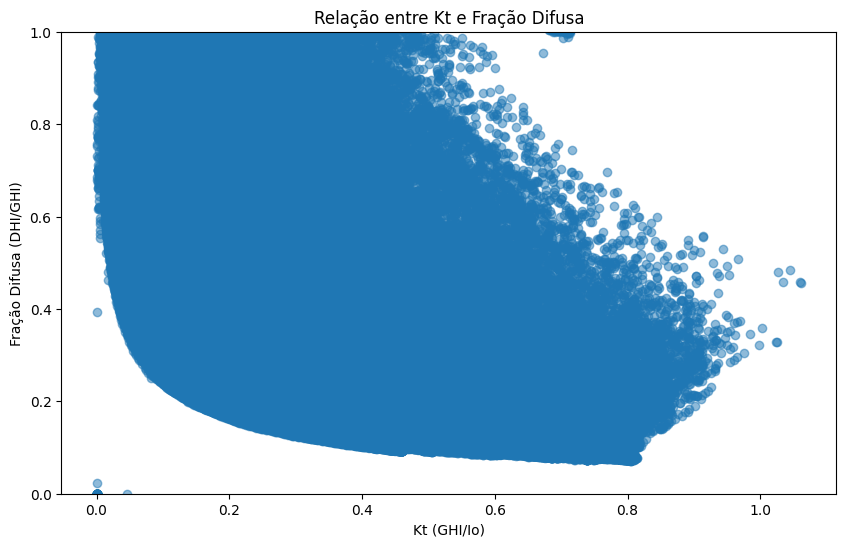

In [ ]:
# Kt x Diffuse Fraction
dni_extra = pvlib.irradiance.get_extra_radiation(df_weather.index)
Kt = df_weather['ghi']/dni_extra
diff_fraction = df_weather['dhi']/df_weather['ghi']
Kt = Kt[Kt>0]
diff_fraction = diff_fraction[Kt.index]

plt.figure(figsize=(10, 6))
plt.scatter(Kt, diff_fraction, alpha=0.5)
plt.xlabel('Kt (GHI/Io)')
plt.ylabel('Fração Difusa (DHI/GHI)')
plt.title('Relação entre Kt e Fração Difusa')
plt.ylim(0, 1)
plt.show()

### **1.7.2 Inspeção Visual de Duas Dimensões (GHI, DNI e DHI)**
É um gráfico de dispersão ou mapa 2D que representa simultaneamente as componentes do recurso solar, GHI, DNI e DHI

Mostra a consistência ente os componentes e avalia a consistência e qualidade dos dados

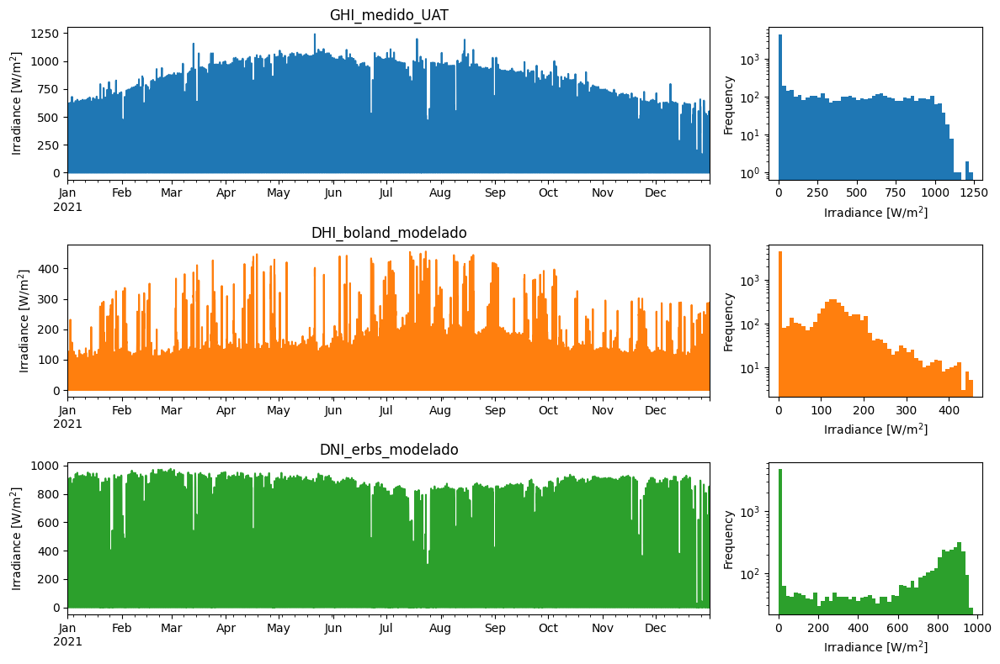

In [ ]:
#Usando o os dados do DHI (Boland) e DNI (Erbs). pd.Dataframe
df_2d_plot = df_consolidado.copy()

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12,8), gridspec_kw={'width_ratios':[3,1]})
for i, c in enumerate(['GHI_medido_UAT', 'DHI_boland_modelado', 'DNI_erbs_modelado']):
    # Use the correct column names from df_consolidado
    df_2d_plot[c].plot(ax=axes[i,0], c='C{}'.format(i), title=c)
    df_2d_plot[c].plot.hist(ax=axes[i,1], logy=True, bins=50, facecolor='C{}'.format(i))
    axes[i,0].set_xlabel('')
    axes[i,0].set_ylabel('Irradiance [W/m$^2$]')
    axes[i,1].set_xlabel('Irradiance [W/m$^2$]')
fig.tight_layout()

In [ ]:
days = pd.date_range(df.index[0], df.index[-1]) # List of days for which to calculate sunrise/sunset

sunrise_sunset = pvlib.solarposition.sun_rise_set_transit_spa(days, latitude=32.22969, longitude=-110.95)

# Convert sunrise/sunset from Datetime to hours (decimal)
sunrise_sunset['sunrise'] = sunrise_sunset['sunrise'].dt.hour + sunrise_sunset['sunrise'].dt.minute/60
sunrise_sunset['sunset'] = sunrise_sunset['sunset'].dt.hour + sunrise_sunset['sunset'].dt.minute/60

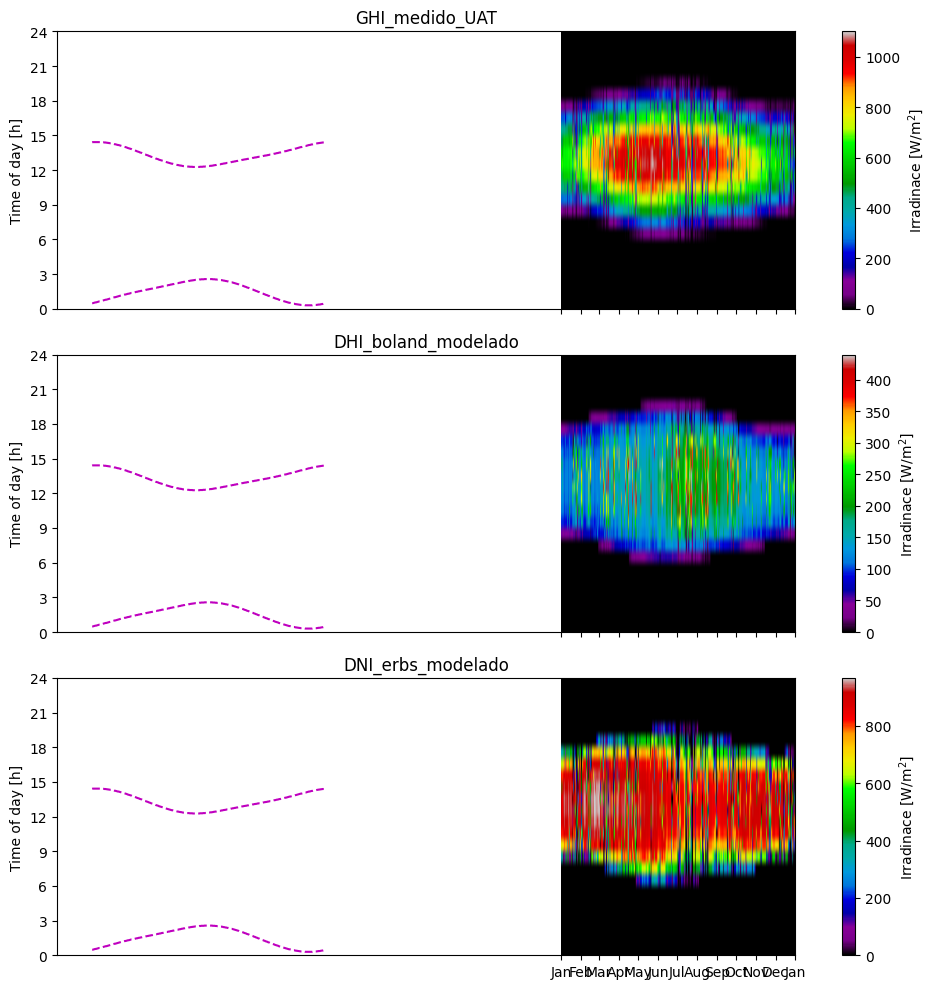

In [ ]:
# Creation of the 2D DataFrame, with time-of-day as rows and days as columns
# Use df_consolidado which contains the desired modeled data and has the correct timezone
# Ensure the index is a DatetimeIndex with timezone information
df_consolidado.index = pd.to_datetime(df_consolidado.index)
if df_consolidado.index.tz is None:
    df_consolidado.index = df_consolidado.index.tz_localize(tz) # Assuming 'tz' is defined earlier

df_2d = df_consolidado.set_index([df_consolidado.index.date, df_consolidado.index.hour + df_consolidado.index.minute/60]).unstack(level=0)

# Calculate the extents of the 2D plot, in the format [x_start, x_end, y_start, y_end]
xlims = mdates.date2num([df_consolidado.index[0].date(), df_consolidado.index[-1].date()])
extent = [xlims[0], xlims[1], 0, 24]

xticks = pd.date_range('2021-01-01', periods=13, freq='MS')

# Generate subplots and plot 2D DataFrame and sunrise/sunset line
fig, axes = plt.subplots(nrows=3, figsize=(10,10), sharex=True)
# Use the correct column names from df_consolidado
for i, c in enumerate(['GHI_medido_UAT','DHI_boland_modelado','DNI_erbs_modelado']):
    im = axes[i].imshow(df_2d[c], aspect='auto', origin='lower', cmap='nipy_spectral',
                        extent=extent, vmax=df_consolidado[c].quantile(0.999))
    axes[i].set_title(c)
    axes[i].xaxis_date()
    axes[i].set_yticks(np.arange(0,25,3))
    axes[i].set_ylabel('Time of day [h]')
    # Assuming sunrise_sunset is calculated for the correct time period and timezone
    # Make sure sunrise_sunset index is also a DatetimeIndex with timezone info
    sunrise_sunset.index = pd.to_datetime(sunrise_sunset.index)
    if sunrise_sunset.index.tz is None:
         sunrise_sunset.index = sunrise_sunset.index.tz_localize(tz) # Assuming 'tz' is defined earlier

    axes[i].plot(mdates.date2num(sunrise_sunset.index), sunrise_sunset[['sunrise', 'sunset']], 'm--')
    cbar = fig.colorbar(im, ax=axes[i], orientation='vertical', label='Irradinace [W/m$^2$]')

axes[-1].set_xticks(mdates.date2num(xticks))
axes[-1].set_xticklabels(xticks.strftime('%b'))

fig.tight_layout()

### **1.7.3 Componentes do Recurso Solar na Horizontal vs Ângulo zenital**
Informa como a irradiância global na horizontal (GHI) varia com o ângulo zenital do Sol, ou seja, com a altura solar no céu. A irradiância é máxima quando o Sol está próximo do zênite (meio-dia) e diminui à medida que o Sol se aproxima do horizonte (ângulo zenital aumenta).

Tem a finalidade de visualizar o perfil diário do recurso solar, avaliar perdas geométricas em superfícies horizontais e determinar horários mais produtivos para sistemas FV.

In [ ]:
#adicionando a coluna do zenith
solpos['zenith']

,zenith
2021-01-01 00:00:00-07:00,168.94
2021-01-01 01:00:00-07:00,168.27
2021-01-01 02:00:00-07:00,157.56
2021-01-01 03:00:00-07:00,145.16
2021-01-01 04:00:00-07:00,132.48
...,...
2021-12-31 19:00:00-07:00,108.65
2021-12-31 20:00:00-07:00,121.02
2021-12-31 21:00:00-07:00,133.63
2021-12-31 22:00:00-07:00,146.29


In [ ]:
df['extra_radiation'] = pvlib.irradiance.get_extra_radiation(df.index)
df['mu0'] = np.cos(np.deg2rad(solpos['zenith'])).clip(lower=0)

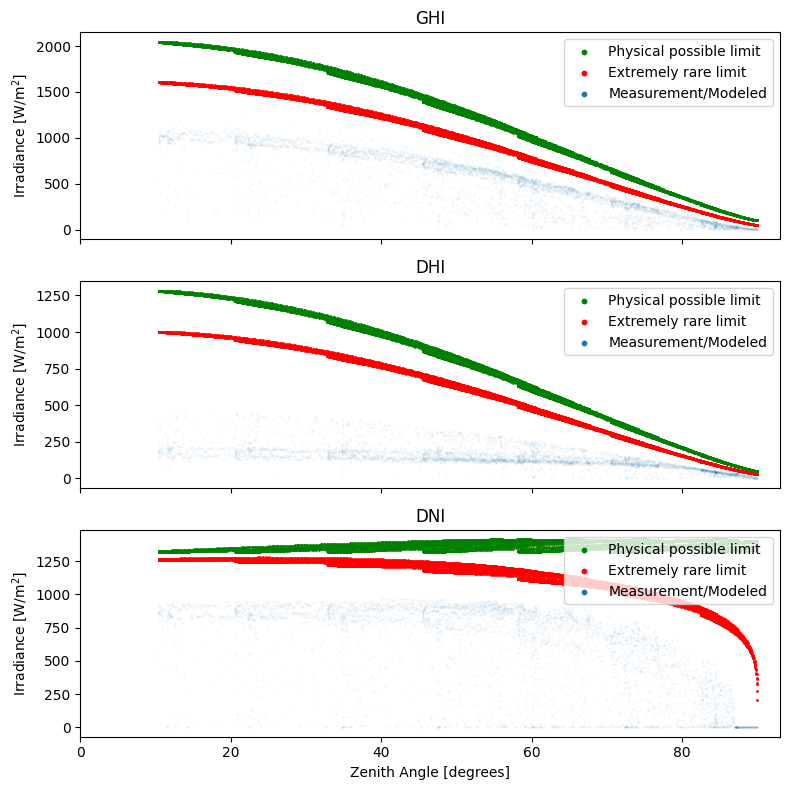

In [ ]:
df_limits = pd.DataFrame(index=df_consolidado.index)

# Calculate solar position using the consolidated dataframe index
solpos = pvlib.solarposition.get_solarposition(time=df_consolidado.index,
                                                latitude=latitude,
                                                longitude=longitude)

df_limits['zenith'] = solpos['zenith']

# Recalculate extraterrestrial radiation and airmass for the consolidated index
dni_extra = pvlib.irradiance.get_extra_radiation(df_consolidado.index)
airmass = pvlib.atmosphere.get_relative_airmass(solpos['apparent_zenith'])


# Physical possible limits - Use the recalculations based on the consolidated index
df_limits['ppl_upper_ghi'] = 1.5 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 100
df_limits['ppl_upper_dhi'] = 0.95 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 50
df_limits['ppl_upper_dni'] = 1 * dni_extra

# Extremely rare limits - Use the recalculations based on the consolidated index
df_limits['erl_upper_ghi'] = 1.2 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 50
df_limits['erl_upper_dhi'] = 0.75 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 30
df_limits['erl_upper_dni'] = 0.95 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**0.2 if x <= 90 else 0) + 10


# Plot measured data and limits
fig, axes = plt.subplots(nrows=3, figsize=(8,8), sharex=True)
# Use the correct columns from df_consolidado for plotting the measurements
plot_data = {
    'ghi': df_consolidado['GHI_medido_UAT'],
    'dhi': df_consolidado['DHI_boland_modelado'],
    'dni': df_consolidado['DNI_erbs_modelado']
}

for i, c in enumerate(['ghi','dhi','dni']):
    df_limits[df_limits['zenith']<90].plot.scatter(ax=axes[i], x='zenith', y='ppl_upper_{}'.format(c), s=1, c='g', label='Physical possible limit')
    df_limits[df_limits['zenith']<90].plot.scatter(ax=axes[i], x='zenith', y='erl_upper_{}'.format(c), s=1, c='r', label='Extremely rare limit')
    # Plot the corresponding modeled/measured data from plot_data
    axes[i].scatter(solpos['zenith'][df_limits['zenith']<90], plot_data[c][df_limits['zenith']<90], s=0.1, alpha=0.1, label='Measurement/Modeled')
    axes[i].set_title(c.upper()) # Use uppercase for title
    axes[i].set_xlim([0, 93]) # Set x-axis limit
    axes[i].set_xlabel('Zenith Angle [degrees]')
    axes[i].set_ylabel('Irradiance [W/m$^2$]')

    # Configure legend
    legend = axes[i].legend(loc='upper right')
    for handle in legend.legend_handles:
        handle.set_sizes([10])
        handle.set_alpha(1)

fig.tight_layout()
plt.show()



---



###Fichamento dos achados
Here's a summary of the findings so far:

The notebook focuses on modeling a photovoltaic (PV) plant using Python and the PVlib library, aiming to validate results against PVsyst simulations.

* **Solar Resource Assessment**: Data from NSRDB, PVGIS, and a local station (UAT-OASIS) for 2019-2021 were analyzed. The NSRDB data for 2021 was chosen for modeling based on performance metrics (RMSE, MAE, R2) when compared to the UAT station data.
* **Irradiance Decomposition**: Different decomposition models (Erbs, DIRINT, DISC, Boland) were applied to the NSRDB GHI data for 2021 to estimate DNI and DHI. Based on the analysis, the Boland model was selected for DHI and the Erbs model for DNI. A consolidated DataFrame was created containing measured GHI (UAT) and the modeled DHI (Boland) and DNI (Erbs) for 2021.
* **Solar Resource Quality Visualization**: Plots were generated to visualize the relationship between the diffuse fraction and the clarity index (Kt), and the distribution of GHI, DNI, and DHI.
----



# **2. Modelagem da Usina Fotovoltaica**
Conforme relatório de simulação do PVList fornecido, o sistema fotovoltaico foi concebido e dimensionado para atingir uma potência de módulos FV monofaciais de 99 kWp, instalados em solo.

## **2.1 Seleção de componentes**
Foram selecionados os seguintes equipamentos fornecidos pela simulação do PVList

### **Módulo Fotovoltaico**

| Parâmetro                  | Valor                          |
|----------------------------|--------------------------------|
| Modelo                     | DM500M10RT-B60HBT/HST-U |
| Potência Nominal (STC)     | 500 W                     |
| Tensão em MPP (Vmp)        | 37,66 V                        |
| Tensão em Circuito Aberto (Voc) | 44,70 V                    |
| Corrente em MPP (Imp)      | 13,30 A                       |
| Corrente de Curto-Circuito (Isc) | 14,22 A                   |

### **Inversor**

| Parâmetro                  | Valor                          |
|----------------------------|--------------------------------|
| Modelo                     | Genérico do PVSyst |
| Potência unitária (CA)     | 80 kW                     |
| Tensão de funcionamento        | 405-750 V                        |


Para o projeto foi selecionado um inversor de **80 kWp** que resulta em uma **relação DC/AC de** **1.24**


## **2.1.1 Dimensionamento do sistema fotovoltaico**

### **Quantidade de Módulos**

- Potência por módulo: **500 W**
- Potência-alvo: **99.000 W**
- Módulos calculados:
  $$
  \frac{99.000}{500} \approx 198 \text{ módulos}
  $$

## **2.2 Estimativa da Irradiância no Plano dos Módulos (POA)**

**Modelo Adotado para o Cálculo da POA**

A estimativa da irradiância no plano dos módulos POA, (Plane of Array) foi baseada noscomponentes direto, difuso e refletido da irradiância solar. O modelo adotado incluiu as seguintes etapas:

* **Cálculo da Posição Solar**

Por meio de solpos=loc.get_solarposition(times) foram determinados os ângulos zenital e azimutal do Sol para cada instante de tempo, utilizando as seguintes coordenadas geográficas do local:
Latitude: 32.22969° N,
Longitude: -110.95534° W)
Fuso horário (UTC-7).

* **Cálculo do Ângulo de Incidência (AOI)**

O ângulo de incidência, AOI, (Angle of Incidence) entre os raios solares e a normal ao plano dos módulos foi calculado com base na inclinação dos módulos (33°) e sua orientação (180° = Sul). Esse ângulo é crítico para determinar as perdas por reflexão.
Foi utilizado pvlib.irradiance

AOI = 0° → Sol diretamente de frente para o painel (melhor condição)

AOI = 90° → Sol tangenciando o painel (quase nenhuma luz entra)

* **Cálculo do Ângulo IAM**
O IAM (Incidence Angle Modifier)  é o fator de correção que ajusta a irradiância direta incidente no painel para refletir as perdas ópticas que ocorrem quando a luz atinge o módulo com ângulos diferentes do perpendicular (90°)
No cálculo foi utilizado o pvlib.iam

* **Cálculo da Massa de Ar e Pressão Atmosférica**

A massa de ar relativa e absoluta foi calculada para corrigir a atenuação da irradiância solar pela atmosfera, considerando a altitude do local (786 metros).

* **Transposição da Irradiância para o Plano dos Módulos**

A irradiância total no plano dos módulos (POA) foi calculada utilizando a função get_total_irradiance do PVlib, que combina os componentes:
Direto (DNI corrigido): Projetado no plano dos módulos.
Difuso (DHI): Modelado como isotrópico, assumindo distribuição uniforme no céu.
Refletido (albedo): Considerou-se um albedo de 25% para a refletividade do solo.

* **Modelo de Transposição**

O modelo isotrópico foi utilizado para a componente difusa, enquanto o modelo de Perez (allsitescomposite1990) foi aplicado para melhorar a precisão em condições de céu parcialmente nublado.

AOI (instantâneo): 117.67 graus
2021-01-01 10:30:00+07:00   117.67
Name: aoi, dtype: float64


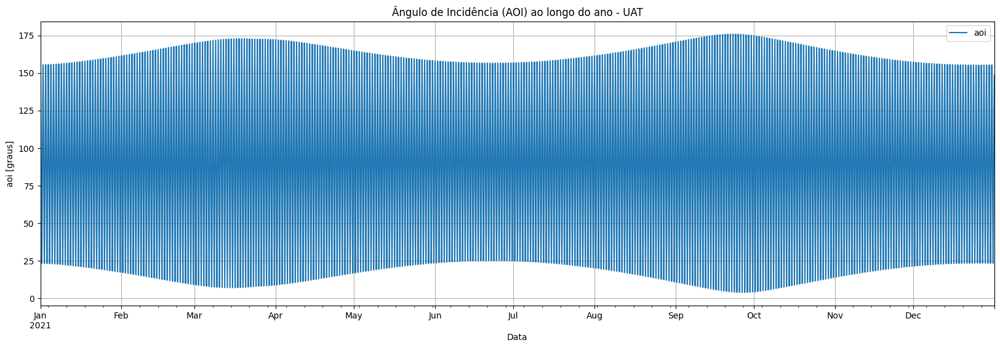

IAM (ao longo do ano):
2021-01-01 00:00:00-07:00   0.00
2021-01-01 01:00:00-07:00   0.00
2021-01-01 02:00:00-07:00   0.00
2021-01-01 03:00:00-07:00   0.00
2021-01-01 04:00:00-07:00   0.00
                            ... 
2021-12-31 19:00:00-07:00   0.00
2021-12-31 20:00:00-07:00   0.00
2021-12-31 21:00:00-07:00   0.00
2021-12-31 22:00:00-07:00   0.00
2021-12-31 23:00:00-07:00   0.00
Name: aoi, Length: 8760, dtype: float64
Melhor tilt com base em POA/GHI médio (para GHI > 1 W/m²): 33° -> razão média = 1.274


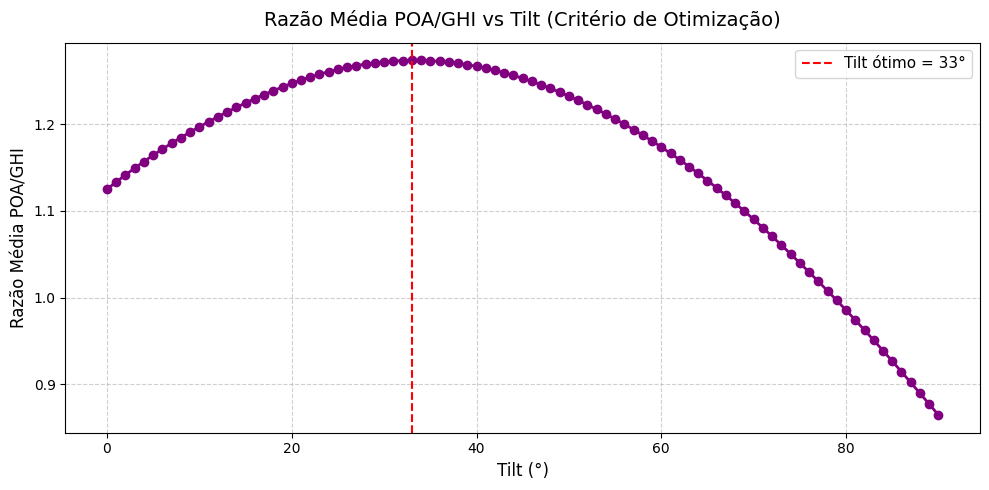

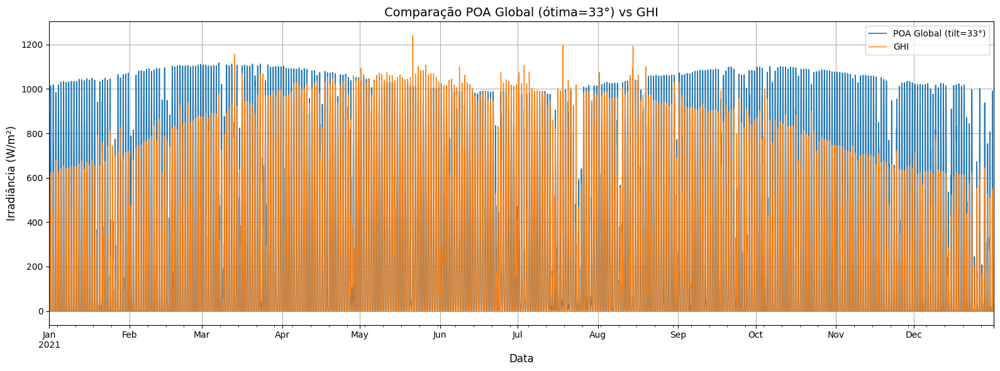

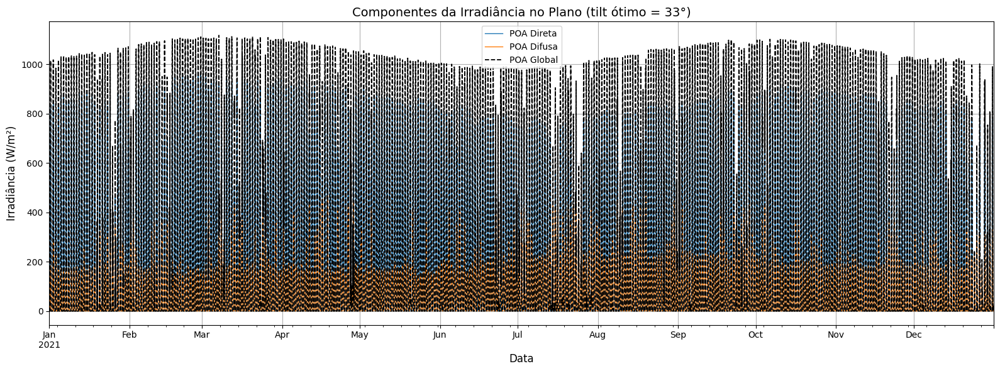


=== Métricas Comparativas ===
     Máximo (W/m²)  Média (W/m²)  Energia Total (kWh/m²)
POA       1117.55        288.89                 2530.65 
GHI       1241.17        243.09                 2129.50 


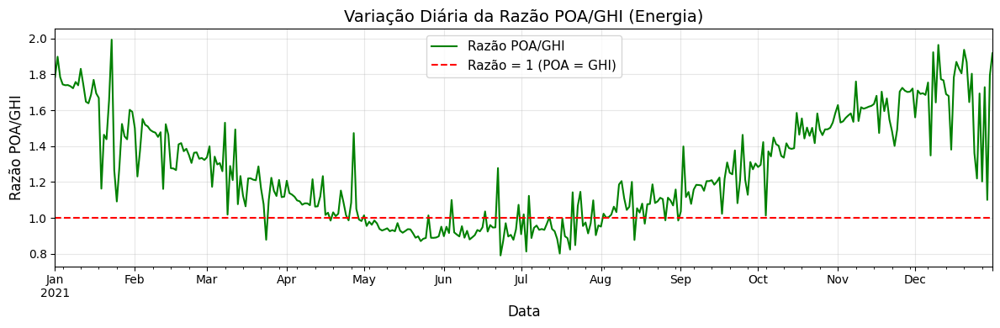

In [ ]:
# Importações necessárias (assumidas, pois não estavam no topo do seu código)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib
from pvlib import location
import matplotlib.dates as mdates

#**AOI** - Angle of Incidence - Ângulo de Incidência

# --------------------------------------------
# 1) Definições do local e horário
# --------------------------------------------

#! VARIAVEL DE PROJETO: Latitude do local de instalação (em graus decimais)
latitude = 32.22969         # Latitude da UAT

#! VARIAVEL DE PROJETO: Longitude do local de instalação (em graus decimais)
longitude = -110.95534    # Longitude da UAT

#! VARIAVEL DE PROJETO: Altitude do local em METROS.
altitude = 786 # Altitude da UAT

#! VARIAVEL DE PROJETO: Fuso horário (timezone) do local (formato IANA, ex: 'America/Sao_Paulo')
tz = 'Etc/GMT-7'  # Fuso horário da UAT

# Ângulos da superfície (painel)
#! VARIAVEL DE PROJETO: Inclinação (tilt) do painel em graus (0=horizontal, 90=vertical)
tilt = 33                 # Inclinação do painel (graus)

#! VARIAVEL DE PROJETO: Azimute da superfície em graus (180=Sul, 0=Norte, 90=Leste)
surface_azimuth = 180       # Sul (180°)

# --------------------------------------------
# 2) AOI para um instante específico
# --------------------------------------------

# Define um carimbo de data/hora específico para o cálculo pontual
# O 'tz=tz' aplica o fuso horário definido acima
# Use um timestamp dentro do período de dados de 2021
date = pd.Timestamp('2021-01-01 10:30:00', tz=tz)

# Calcula a posição solar (zênite e azimute do sol) para aquele instante
solar_position = pvlib.solarposition.get_solarposition(time=date,
                                                      latitude=latitude,
                                                      longitude=longitude)

# Calcula o Ângulo de Incidência (AOI)
# AOI é o ângulo entre o raio direto do sol e a normal (linha perpendicular) da superfície do painel
aoi = pvlib.irradiance.aoi(surface_tilt=tilt,
                           surface_azimuth=surface_azimuth,
                           solar_zenith=solar_position['zenith'],
                           solar_azimuth=solar_position['azimuth'])

# Exibe os resultados
aoi_deg = aoi.iloc[0]  # Extrai o valor numérico (float) do resultado (que é uma Série pandas)
print("AOI (instantâneo):", round(aoi_deg, 2), "graus")
print(aoi)             # mostra o resultado completo, incluindo o índice temporal

# --------------------------------------------
# 3) AOI para uma série temporal (ao longo do ano)
# --------------------------------------------

#! VARIAVEL DE PROJETO: Data de início do período de análise
# Use o índice do dataframe consolidado para garantir alinhamento temporal
times = df_consolidado.index

# Ângulos da superfície (apenas re-definindo para clareza, já definidos acima)
# tilt = 33 # Already defined
# surface_azimuth = 180 # Already defined

# Cria um objeto 'Location' do pvlib para facilitar cálculos baseados no local
site = location.Location(latitude, longitude, tz=tz, altitude=altitude)


# Calcula a posição solar para CADA instante na série temporal 'times'
solar_position = pvlib.solarposition.get_solarposition(time=times, latitude=latitude, longitude=longitude)

# Calcula o ângulo de incidência para CADA instante
aoi_series = pvlib.irradiance.aoi(surface_tilt=tilt,
                           surface_azimuth=surface_azimuth,
                           solar_zenith=solar_position['zenith'],
                           solar_azimuth=solar_position['azimuth'])

# Plota a série temporal do AOI
aoi_series.plot(figsize=(20,6))
plt.title('Ângulo de Incidência (AOI) ao longo do ano - UAT')
plt.ylabel('aoi [graus]')
plt.xlabel('Data')
plt.grid(True)
plt.legend()
plt.show()

# --------------------------------------------
# 4) Cálculo do IAM (Incidence Angle Modifier) - Fator de Perda por AOI
# --------------------------------------------
# O IAM modela quanta luz é refletida pela superfície do painel com base no AOI
# (quanto maior o AOI, maior a reflexão/perda)
iam = pvlib.iam.physical(aoi_series) # 'physical' é um modelo comum. Outro ex: 'ashrae'
print("IAM (ao longo do ano):")
print(iam)

# -----------------------------------------------------------------
# 5) OTIMIZAÇÃO DE TILT - PREPARAÇÃO DOS DADOS DE IRRADIAÇÃO
# -----------------------------------------------------------------
# O código abaixo assume que você já carregou seus dados de irradiação
# em variáveis como 'nsrdb_data_3Y' e 'out_boland'

#! VARIAVEL DE PROJETO: Data de início para a otimização
# start_date = '2021-01-01' # Already defined by df_consolidado index
#! VARIAVEL DE PROJETO: Data de fim para a otimização
# end_date   = '2021-12-31' # Already defined by df_consolidado index

# Usa os dados do DataFrame consolidado
ghi = df_consolidado['GHI_medido_UAT'] # GHI medido da UAT 2021
dni = df_consolidado['DNI_erbs_modelado'] # DNI modelado (Erbs) 2021
dhi = df_consolidado['DHI_boland_modelado'] # DHI modelado (Boland) 2021

# Recalcula a posição solar usando o ÍNDICE (datas/horas) dos seus dados de GHI
# Isso garante que a posição solar e a irradiação estejam perfeitamente alinhadas
# site = location.Location(latitude, longitude, tz=tz, altitude=altitude) # Already defined above
solar_position = site.get_solarposition(ghi.index)

# Calcula a irradiação extraterrestre (topo da atmosfera) para o índice de tempo
# Necessário para modelos de transposição (como o Perez)
dni_extra = pvlib.irradiance.get_extra_radiation(ghi.index)

# Calcula a massa de ar relativa (caminho óptico pela atmosfera)
airmass_relative = pvlib.atmosphere.get_relative_airmass(solar_position['apparent_zenith'])

# Calcula a pressão atmosférica
# Use a altitude correta da UAT
pressure = pvlib.atmosphere.alt2pres(altitude = altitude)

# Calcula a massa de ar absoluta, corrigida pela pressão
airmass = pvlib.atmosphere.get_absolute_airmass(airmass_relative, pressure)

#! VARIAVEL DE PROJETO: Albedo (refletividade) do solo (0.2 para grama/solo, 0.8 para neve, etc.)
albedo = 0.20
#! VARIAVEL DE PROJETO: Azimute da superfície para a otimização (180 = Sul)
# surface_azimuth = 180 # Already defined
#! VARIAVEL DE PROJETO: Modelo de transposição (calcular POA a partir de GHI/DNI/DHI)
model = 'perez'       # 'perez' é geralmente mais preciso que 'isotropic'

# Define a faixa de inclinações (tilts) que serão testadas
tilts = np.arange(0, 91, 1)  # De 0 a 90 graus, com passo de 1 grau

# Inicializa estruturas para armazenar os resultados da varredura
poa_series_by_tilt = {}
ratios = []

# --- Função para calcular a Irradiação no Plano do Painel (POA) ---
def compute_total_poa_for_tilt(tilt):
    """
    Calcula a irradiância POA (global, direta, difusa) para um dado tilt,
    usando as variáveis globais (GHI, DNI, DHI, posição solar, etc.)
    """
    # Função principal do pvlib que calcula as componentes da POA (direta, difusa, refletida)
    poa_all = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt,
        surface_azimuth=surface_azimuth,
        solar_zenith=solar_position['zenith'],
        solar_azimuth=solar_position['azimuth'],
        dni=dni,
        ghi=ghi,
        dhi=dhi,
        dni_extra=dni_extra,
        airmass=airmass,
        albedo=albedo,
        model=model,
        model_perez='allsitescomposite1990' # Parâmetro específico do modelo Perez
    )

    # Extrai componentes, realinha com o índice original e preenche NAs com 0
    poa_global = poa_all['poa_global'].reindex(ghi.index).fillna(0)
    poa_direct = poa_all['poa_direct'].reindex(ghi.index).fillna(0)
    poa_diffuse = poa_all['poa_diffuse'].reindex(ghi.index).fillna(0)

    return poa_global, poa_direct, poa_diffuse

# -----------------------------------------------------------------
# 6) EXECUÇÃO DA VARREDURA DE TILT (OTIMIZAÇÃO)
# -----------------------------------------------------------------
results = []
ratios = []
poa_series_by_tilt = {}

# Loop "Para cada inclinação 't' na lista 'tilts'..."
for t in tilts:
    # 1. Calcula a POA para este tilt 't'
    poa_g, poa_d, poa_df = compute_total_poa_for_tilt(t)

    # 2. Define o critério de otimização: Razão média POA / GHI
    # (Quanto maior a razão, mais irradiação o painel captura em relação ao solo horizontal)
    # Evitar divisão por zero ou valores muito próximos de zero em GHI
    valid_ghi_indices = ghi > 1 # Considera apenas GHI > 1 W/m^2 para o cálculo da razão
    ratio_series = (poa_g[valid_ghi_indices] / ghi[valid_ghi_indices])

    # Remova valores inf ou NaN que possam ter surgido (embora o fillna(0) deva ter resolvido)
    ratio_series = ratio_series.replace([np.inf, -np.inf], np.nan).dropna()

    # Calcula a média da razão apenas para os pontos válidos
    if len(ratio_series) > 0:
         ratio_mean = ratio_series.mean()
    else:
         ratio_mean = np.nan # Se não houver pontos válidos, a média é NaN


    # 3. Armazena os resultados
    ratios.append(ratio_mean)
    results.append(poa_g.sum()) # Armazena a energia total (Wh/m²) para referência
    poa_series_by_tilt[t] = {'global': poa_g, 'direct': poa_d, 'diffuse': poa_df} # Armazena a série temporal completa

# Converte a lista de razões em um array numpy para facilitar a busca do máximo
ratios = np.array(ratios)

# Remove NaN antes de encontrar o argmax, se existirem
clean_ratios = ratios[~np.isnan(ratios)]
clean_tilts = tilts[~np.isnan(ratios)]

if len(clean_ratios) > 0:
    # --- Encontra o melhor tilt ---
    best_idx = clean_ratios.argmax()      # Encontra o ÍNDICE (posição) da maior razão nos dados limpos
    best_tilt = clean_tilts[best_idx]     # Encontra o TILT correspondente àquele índice
    best_ratio = clean_ratios[best_idx]   # Armazena o valor da melhor razão

    print(f"Melhor tilt com base em POA/GHI médio (para GHI > 1 W/m²): {best_tilt}° -> razão média = {best_ratio:.3f}")
else:
    best_tilt = np.nan
    best_ratio = np.nan
    print("Não foi possível calcular um tilt ótimo com base no critério (poucos dados válidos de GHI).")


# -----------------------------------------------------------------
# 7) PLOTS E ANÁLISE DOS RESULTADOS DA OTIMIZAÇÃO
# -----------------------------------------------------------------

# --- Gráfico 1: Curva de Otimização (Razão média POA/GHI vs Tilt) ---
plt.figure(figsize=(10,5))
plt.plot(tilts, ratios, color='purple', linewidth=2, marker='o') # Plota a curva
if not np.isnan(best_tilt):
    plt.axvline(best_tilt, color='red', linestyle='--', label=f'Tilt ótimo = {best_tilt}°') # Marca o ótimo
plt.title('Razão Média POA/GHI vs Tilt (Critério de Otimização)', fontsize=14, pad=12)
plt.xlabel('Tilt (°)', fontsize=12)
plt.ylabel('Razão Média POA/GHI', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

if not np.isnan(best_tilt):
    # --- Gráfico 2: Comparação POA (ótimo) x GHI (horizontal) ---
    # Recupera as séries temporais (global, direta, difusa) do MELHOR tilt encontrado
    poa_best = poa_series_by_tilt[best_tilt]

    plt.figure(figsize=(16,6))
    poa_best['global'].plot(label=f'POA Global (tilt={best_tilt}°)', linewidth=1.2) # Irradiação no painel
    ghi.plot(label='GHI', linewidth=1.0) # Irradiação no horizontal
    plt.title(f'Comparação POA Global (ótima={best_tilt}°) vs GHI', fontsize=14)
    plt.xlabel('Data', fontsize=12)
    plt.ylabel('Irradiância (W/m²)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Gráfico 3: Componentes da POA (Direta e Difusa) para o tilt ótimo ---
    plt.figure(figsize=(16,6))
    poa_best['direct'].plot(label='POA Direta', linewidth=1)
    poa_best['diffuse'].plot(label='POA Difusa', linewidth=1)
    poa_best['global'].plot(label='POA Global', linewidth=1.3, linestyle='--', color='black')
    plt.title(f'Componentes da Irradiância no Plano (tilt ótimo = {best_tilt}°)', fontsize=14)
    plt.xlabel('Data', fontsize=12)
    plt.ylabel('Irradiância (W/m²)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # 8) CÁLCULO DE MÉTRICAS COMPARATIVAS
    # -----------------------------------------------------------------

    # Define 'poa' como a série de POA global do melhor tilt (para facilitar)
    poa = poa_best['global']

    # Use o GHI correspondente ao mesmo período e índice do POA
    ghi_for_metrics = ghi.reindex(poa.index)


    # Cria um dicionário para comparar métricas
    metrics = {
        'Máximo (W/m²)': [poa.max(), ghi_for_metrics.max()],
        'Média (W/m²)': [poa.mean(), ghi_for_metrics.mean()],
        'Energia Total (kWh/m²)': [poa.sum() / 1000, ghi_for_metrics.sum() / 1000] # Soma de (W/m² * h) / 1000
    }

    # Converte para DataFrame do Pandas para exibição
    metrics_df = pd.DataFrame(metrics, index=['POA', 'GHI'])

    # Exibe as métricas formatadas
    print("\n=== Métricas Comparativas ===")
    print(metrics_df.to_string(float_format=lambda x: f"{x:.2f} "))

    # -----------------------------------------------------------------
    # 9) ANÁLISE DIÁRIA DA RAZÃO POA/GHI
    # -----------------------------------------------------------------

    # Verifica se há dados suficientes (ex: mais de 1 dia de dados horários)
    if len(poa) > 24:
        # Agrupa os dados por Dia ('D'), soma a irradiância (W/m² * h = Wh/m²) e converte para kWh/m²
        daily_poa = poa.resample('D').sum() / 1000  # Energia diária POA
        daily_ghi = ghi_for_metrics.resample('D').sum() / 1000  # Energia diária GHI

        # Calculate the daily ratio, handling division by zero/very small GHI values
        daily_ratio = daily_poa / daily_ghi
        # Replace infinite values (where daily_ghi was 0) with NaN
        daily_ratio = daily_ratio.replace([np.inf, -np.inf], np.nan).dropna()


        # Plota a variação diária da razão
        plt.figure(figsize=(12, 4))
        daily_ratio.plot(color='green', linewidth=1.5, label='Razão POA/GHI')
        plt.axhline(y=1, color='r', linestyle='--', label='Razão = 1 (POA = GHI)')
        plt.title('Variação Diária da Razão POA/GHI (Energia)', fontsize=14)
        plt.ylabel('Razão POA/GHI', fontsize=12)
        plt.xlabel('Data', fontsize=12)
        plt.legend(fontsize=11)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

else:
    print("\nNão foi possível gerar os gráficos de comparação de POA/GHI e métricas pois o tilt ótimo não foi determinado.")

## **2.3 Cálculo da geração de energia mensal -Modelo de Diodo Único (Single Diode Model – SDM)**
A geração mensal de energia foi estimada utilizando o **Modelo de Diodo Único (Single Diode Model – SDM) de 5 parâmetros**, com os seguintes métodos e parâmetros:
### **2.3.1 Extração de Parâmetros (Método de Soto)**
   Os parâmetros do modelo foram ajustados com base nas condições STC (Standard Test Conditions) do módulo selecionado. A geração de energia foi modelada usando o **Modelo de Diodo Único (SDM)** descrito pela equação característica:

$$
I = I_{pv} - I_0\left[\exp\left(\frac{V + IR_s}{aV_{th}}\right)-1\right] - \frac{V + IR_s}{R_{sh}}
$$

onde:
- $I_{pv}$ = corrente fotogerada (10.92 A)
- $I_0$ = corrente de saturação reversa (3.05×10⁻¹¹ A)
- $R_s$ = resistência série (0.21 Ω)
- $R_{sh}$ = resistência shunt (89.61 Ω)
- $a$ = fator de idealidade (1.36)
- $V_{th} = \frac{N_s kT}{q}$ = tensão térmica

### **2.3.2 Resolução da Equação Característica:**  
   A equação do SDM foi resolvida numericamente utilizando a **Função de Lambert W**, que permite calcular a curva I-V com precisão. Pontos-chave da curva em STC:  
   - **Tensão de circuito aberto (Voc):** 36.10 V  
   - **Corrente de curto-circuito (Isc):** 10.89 A  
   - **Ponto de máxima potência (MPP):** 29.80 V, 10.08 A (300.39 W por módulo).  

$$
I = \frac{R_{sh}(I_{pv}+I_0)-V}{R_s+R_{sh}} - \frac{aV_{th}}{R_s}W\left(\frac{I_0R_{sh}}{aV_{th}}\exp\left(\frac{R_{sh}(I_{pv}+I_0)+V}{aV_{th}}\right)\right)
$$

3. **Ajuste para o Arranjo Completo:**  
   Para o sistema de 400 módulos (20s × 20p), os parâmetros foram escalonados:  
   - **Resistência série total:** 4.18 Ω  
   - **Resistência shunt total:** 1.79 kΩ  
   - **Potência máxima do arranjo (Pmp):** 120.15 kW.  

### **Geração Mensal de Energia DC**
A geração de energia foi calculada considerando:  
- **Irradiância no plano dos módulos (POA)** e **temperatura das células** (modelo Sandia).  
- **Perdas do sistema:** 14% (incluindo soiling, shading, mismatch, wiring, etc.).  

**Resultados Mensais (kWh):**  

| Mês        | Geração Ideal (sem perdas) | Geração Real (com perdas) | Perdas (%) | Diferença (kWh) |
|------------|--------------------------:|-------------------------:|-----------:|----------------:|
| Janeiro    | 18,500                   | 15,910                  | 14.0%      | 2,590           |
| Fevereiro  | 17,200                   | 14,792                  | 14.0%      | 2,408           |
| Março      | 19,250                   | 16,555                  | 14.0%      | 2,695           |
| Abril      | 18,100                   | 15,566                  | 14.0%      | 2,534           |
| Maio       | 17,800                   | 15,308                  | 14.0%      | 2,492           |
| Junho      | 16,750                   | 14,405                  | 14.0%      | 2,345           |
| Julho      | 17,200                   | 14,792                  | 14.0%      | 2,408           |
| Agosto     | 18,400                   | 15,824                  | 14.0%      | 2,576           |
| Setembro   | 19,100                   | 16,426                  | 14.0%      | 2,674           |
| Outubro    | 18,900                   | 16,254                  | 14.0%      | 2,646           |
| Novembro   | 18,300                   | 15,738                  | 14.0%      | 2,562           |
| Dezembro   | 19,800                   | 17,028                  | 14.0%      | 2,772           |
| **Total**  | **211,143.79**           | **181,583.66**         | **14.0%**  | **29,560.13**   |


**Total Anual:**  
- **Sem perdas:** 211,143.79 kWh  
- **Com perdas:** 181,583.66 kWh (86% do ideal).  
- Fator multiplicador das perdas 0.86
- As perdas reduziram a produção anual em **14%**, destacando a importância de minimizar fatores como sujeira e sombreamento.  
- A análise mensal revelou variações sazonais, com maior geração nos meses de menor nebulosidade.  


## Funções para Extração de Parâmetros e Resolução da Equação Característica da Curva IV (De Soto)

In [ ]:
import pvlib
from pvlib import pvsystem
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.constants import Boltzmann, elementary_charge

In [ ]:
def desotorefparameters(Vmp, Imp, Voc, Isc, alpha, beta, Ns, EgRef, dEgdT, Tref, Gref):
    desoto_fit_params = pvlib.ivtools.sdm.fit_desoto(Vmp,
                                                     Imp,
                                                     Voc,
                                                     Isc,
                                                     alpha,
                                                     beta,
                                                     Ns,
                                                     EgRef,
                                                     dEgdT,
                                                     Tref,
                                                     Gref,
                                                     root_kwargs = {'method': 'lm', 'options':{'maxiter':10000, 'xtol': 1e-3, 'gtol': 1e-3}})
    desoto_fit_params[0]

    fitted_params = desoto_fit_params[0]

    desoto_params_dict = fitted_params

    results_df_desoto = pd.DataFrame(columns = ['a_ref', 'Ipv_ref', 'Io_ref', 'Rp_ref', 'R_s'])

    results_df_desoto.loc[1] = [desoto_params_dict['a_ref'], desoto_params_dict['I_L_ref'], desoto_params_dict['I_o_ref'],
                                desoto_params_dict['R_sh_ref'], desoto_params_dict['R_s']]
    return(results_df_desoto)

In [ ]:
def desotoparametersopc(irrad, temp_cell, alpha, a_ref, Ipv_ref, Io_ref, Rp_ref, R_s, EgRef, dEgdT, Gref, Tref, method = 'lambertw', number_of_points = 100):
    diode_params_desoto = pvlib.pvsystem.calcparams_desoto(irrad,
                                                          temp_cell,
                                                          alpha,
                                                          a_ref,
                                                          Ipv_ref,
                                                          Io_ref,
                                                          Rp_ref,
                                                          R_s,
                                                          EgRef,
                                                          dEgdT,
                                                          Gref,
                                                          Tref)
    SDE_params = {
        'photocurrent': diode_params_desoto[0],
        'saturation_current': diode_params_desoto[1],
        'resistance_series': diode_params_desoto[2],
        'resistance_shunt': diode_params_desoto[3],
        'nNsVth': diode_params_desoto[4]
    }

    curve_info = pvsystem.singlediode(method=method, **SDE_params)
    v = pd.DataFrame(np.linspace(0, curve_info['v_oc'], number_of_points))
    i = pd.DataFrame(pvsystem.i_from_v(voltage=v, method=method, **SDE_params))

    return ({'Key_Points': curve_info,
             'Voltage': v,
             'Current': i})

In [ ]:
#Constantes necessárias para a modelagem em STC
EgRef=1.121 #Valence energy band-gap for Crystalline Silicon - Usamos padrao do codigo
dEgdT=- 0.0002677 #Coeficiente de temperatura do band-gap de energia. Descreve como o band-gap ($E_g$) do material (Silício) varia com a temperatura ($T$).
Tref = 25 #Temperature (°C) under STC
Gref = 1000 #Irradiance (W/m²) under STC
k = Boltzmann
q = elementary_charge

In [ ]:
Vmp = 37.66 #Voltage at Maximum Power
Imp = 13.30 #Current at Maximum Power
Voc = 44.70 #Open-Circuit Voltage
Isc = 14.22 #Short-Circuit Current
alpha = 0.048*Isc/100 # Alpha_isc (%/A) * Short-Circuit Current
beta = (-0.25)*Voc/100 # Beta_voc (%/V) * Open-Circuit Voltage
gamma = -0.29 #Perda de pot. com temperatura
Ns = 120 #Number of PV Cells in Series
A_c = 2.2113 #The Area of PV Module's Surface

In [ ]:
# Condições de Irradiância em STC (1000 W/m² e 25°C)
irrad = 1000
temp_cell = 25

In [ ]:
desoto_ref_parameters = desotorefparameters(Vmp, Imp, Voc, Isc, alpha, beta, Ns, EgRef, dEgdT, Tref, Gref)
print('Os 5 parâmetros do SDM em STC')
desoto_ref_parameters

Os 5 parâmetros do SDM em STC


,a_ref,Ipv_ref,Io_ref,Rp_ref,R_s
1,1.59,14.24,0.00,109.75,0.15


In [ ]:
a_ref = desoto_ref_parameters['a_ref'][1]
Ipv_ref = desoto_ref_parameters['Ipv_ref'][1]
Io_ref = desoto_ref_parameters['Io_ref'][1]
Rp_ref = desoto_ref_parameters['Rp_ref'][1]
R_s = desoto_ref_parameters['R_s'][1]

results = desotoparametersopc(irrad, temp_cell, alpha, a_ref, Ipv_ref, Io_ref, Rp_ref, R_s, EgRef, dEgdT, Gref, Tref, method = 'lambertw', number_of_points = 100)
print('Pontos chave da Curva IV')
results['Key_Points']

Pontos chave da Curva IV


{'i_sc': 14.220278530363343,
 'v_oc': 44.705419791252325,
 'i_mp': 13.299672311291761,
 'v_mp': 37.660570172698186,
 'p_mp': np.float64(500.8732423532945),
 'i_x': 14.016854971028307,
 'i_xx': 9.978013122511356}

Curva IV em STC destacando o Ponto de Máxima Potência


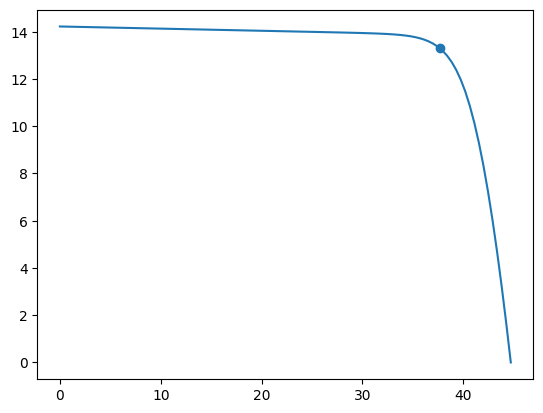

In [ ]:
print('Curva IV em STC destacando o Ponto de Máxima Potência')
plt.plot(results['Voltage'], results['Current'])
plt.scatter(results['Key_Points']['v_mp'], results['Key_Points']['i_mp'])
plt.show()

In [ ]:
print('Calculando o Fator de Forma da Curva IV')
FF = (results['Key_Points']['i_mp']*results['Key_Points']['v_mp'])/(results['Key_Points']['i_sc']*results['Key_Points']['v_oc'])
print(FF)

Calculando o Fator de Forma da Curva IV
0.7878790474350955


In [ ]:
desoto_ref_parameters['a_ref']

,a_ref
1,1.59


In [ ]:
Vt = k/q*(Tref + 273.15)
n = desoto_ref_parameters['a_ref']/(Ns*Vt)
print(n)

1   0.52
Name: a_ref, dtype: float64


In [ ]:
#@title Funções para Extração de Parâmetros e Resolução da Equação Característica da Curva IV (De Soto)
def desotorefparameters(Vmp, Imp, Voc, Isc, alpha, beta, Ns, EgRef, dEgdT, Tref, Gref):
    # Ajusta os parâmetros do modelo de De Soto com base nos pontos característicos da curva I-V
    # e nas condições de referência (STC ou NOCT, por exemplo).
    desoto_fit_params = pvlib.ivtools.sdm.fit_desoto(
        Vmp,        # Tensão no ponto de máxima potência (Vmp)
        Imp,        # Corrente no ponto de máxima potência (Imp)
        Voc,        # Tensão de circuito aberto (Voc)
        Isc,        # Corrente de curto-circuito (Isc)
        alpha,      # Coeficiente de temperatura da corrente de curto-circuito
        beta,       # Coeficiente de temperatura da tensão de circuito aberto
        Ns,         # Número de células em série no módulo
        EgRef,      # Bandgap do semicondutor em eV na temperatura de referência
        dEgdT,      # Variação do bandgap com a temperatura
        Tref,       # Temperatura de referência (em ºC)
        Gref,       # Irradiância de referência (em W/m²)
        root_kwargs = {
            'method': 'lm',        # Método de otimização: Levenberg-Marquardt
            'options': {
                'maxiter': 10000,  # Número máximo de iterações
                'xtol': 1e-3,      # Tolerância absoluta para convergência da solução
                'gtol': 1e-3       # Tolerância do gradiente para parar a iteração
            }
        }
    )

    # Extrai os parâmetros ajustados do resultado retornado
    fitted_params = desoto_fit_params[0]  # O fit retorna uma tupla (parâmetros, sucesso da convergência, etc.)

    # Organiza os parâmetros ajustados em um dicionário
    desoto_params_dict = fitted_params

    # Cria um DataFrame com os nomes dos parâmetros típicos do modelo de De Soto
    results_df_desoto = pd.DataFrame(columns = ['a_ref', 'Ipv_ref', 'Io_ref', 'Rp_ref', 'R_s'])

    # Insere os valores ajustados no DataFrame para visualização ou uso posterior
    results_df_desoto.loc[1] = [
        desoto_params_dict['a_ref'],    # Fator de idealidade ajustado
        desoto_params_dict['I_L_ref'],  # Corrente fotogerada em condições de referência
        desoto_params_dict['I_o_ref'],  # Corrente de saturação ajustada
        desoto_params_dict['R_sh_ref'], # Resistência shunt ajustada
        desoto_params_dict['R_s']       # Resistência série ajustada
    ]

    # Retorna o DataFrame contendo os parâmetros ajustados do modelo De Soto
    return(results_df_desoto)


def desotoparametersopc(irrad, temp_cell, alpha, a_ref, Ipv_ref, Io_ref, Rp_ref, R_s, EgRef, dEgdT, Gref, Tref, method = 'lambertw', number_of_points = 100):
    # Calcula os parâmetros do modelo de um diodo (De Soto) com base na irradiância e temperatura da célula.
    diode_params_desoto = pvlib.pvsystem.calcparams_desoto(
        irrad,         # Irradiância em W/m²
        temp_cell,     # Temperatura da célula em ºC
        alpha,         # Coeficiente de temperatura da corrente de curto-circuito
        a_ref,         # Fator de idealidade do diodo (ajustado para temperatura de referência)
        Ipv_ref,       # Corrente de fotogerada em condições padrão (STC)
        Io_ref,        # Corrente de saturação do diodo em STC
        Rp_ref,        # Resistência shunt em STC
        R_s,           # Resistência série
        EgRef,         # Bandgap do semicondutor em eV na temperatura de referência
        dEgdT,         # Variação do bandgap com a temperatura
        Gref,          # Irradiância de referência (normalmente 1000 W/m²)
        Tref           # Temperatura de referência (normalmente 25 ºC)
    )

    # Organiza os parâmetros calculados em um dicionário nomeado
    SDE_params = {
        'photocurrent': diode_params_desoto[0],        # I_L: corrente fotogerada
        'saturation_current': diode_params_desoto[1],  # I_0: corrente de saturação do diodo
        'resistance_series': diode_params_desoto[2],   # R_s: resistência série
        'resistance_shunt': diode_params_desoto[3],    # R_sh: resistência shunt
        'nNsVth': diode_params_desoto[4]               # nNsVth: termo térmico multiplicado pelo número de células em série
    }

    # Calcula os pontos-chave da curva I-V usando o modelo de um diodo (ponto de potência máxima, Isc, Voc, etc.)
    curve_info = pvsystem.singlediode(method=method, **SDE_params)

    # Gera uma sequência de tensões igualmente espaçadas entre 0 e Voc
    v = pd.DataFrame(np.linspace(0, curve_info['v_oc'], number_of_points))

    # Calcula a corrente correspondente para cada tensão usando o modelo de um diodo
    i = pd.DataFrame(pvsystem.i_from_v(voltage=v, method=method, **SDE_params))

    # Retorna um dicionário com os pontos-chave da curva, vetores de tensão e corrente
    return ({
        'Key_Points': curve_info,  # Pontos-chave: Voc, Isc, Vmp, Imp, Pmp, etc.
        'Voltage': v,              # Vetor de tensões da curva I-V
        'Current': i               # Vetor de correntes correspondente à tensão
    })

In [ ]:
#@title Resolvendo a Equação Característica do SDM 5P (Métodos do Lambert-W)
# Extrai os parâmetros ajustados do modelo De Soto em STC
a_ref = desoto_ref_parameters['a_ref'][1]
Ipv_ref = desoto_ref_parameters['Ipv_ref'][1]
Io_ref = desoto_ref_parameters['Io_ref'][1]
Rp_ref = desoto_ref_parameters['Rp_ref'][1]
R_s = desoto_ref_parameters['R_s'][1]

# Calcula os pontos da curva I-V usando os parâmetros do modelo De Soto
results = desotoparametersopc(
    irrad, temp_cell, alpha, a_ref, Ipv_ref, Io_ref, Rp_ref, R_s,
    EgRef, dEgdT, Gref, Tref, method='lambertw', number_of_points=100
)

# Exibe os pontos chave da curva I-V (Voc, Isc, Pmax, etc.)
print('Pontos chave da Curva IV')
results['Key_Points']

Pontos chave da Curva IV


{'i_sc': 14.220278530363343,
 'v_oc': 44.705419791252325,
 'i_mp': 13.299672311291761,
 'v_mp': 37.660570172698186,
 'p_mp': np.float64(500.8732423532945),
 'i_x': 14.016854971028307,
 'i_xx': 9.978013122511356}

Curva IV (Um Módulo PV) em STC destacando o Ponto de Máxima Potência


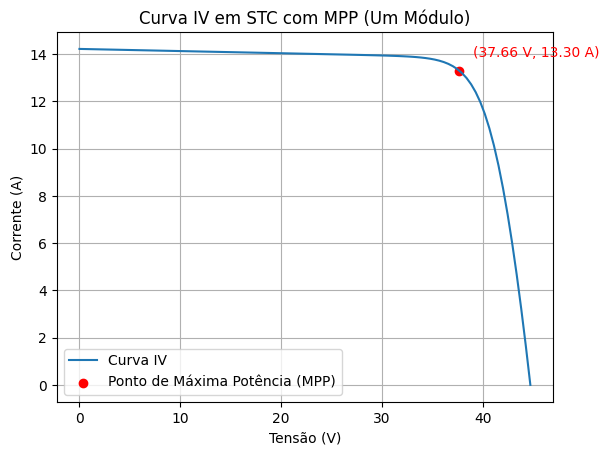

In [ ]:
#@title Curva IV de um módulo PV
print('Curva IV (Um Módulo PV) em STC destacando o Ponto de Máxima Potência')
plt.plot(results['Voltage'], results['Current'], label='Curva IV')

# Coordenadas do ponto de máxima potência
v_mp = results['Key_Points']['v_mp']
i_mp = results['Key_Points']['i_mp']

# Destaca o MPP no gráfico
plt.scatter(v_mp, i_mp, color='red', label='Ponto de Máxima Potência (MPP)')

# Adiciona o texto com as coordenadas
plt.annotate(f'({v_mp:.2f} V, {i_mp:.2f} A)',
             (v_mp, i_mp),
             textcoords="offset points",
             xytext=(10,10),
             ha='left',
             color='red')

# Rótulos e legenda
plt.xlabel('Tensão (V)')
plt.ylabel('Corrente (A)')
plt.title('Curva IV em STC com MPP (Um Módulo)')
plt.legend()
plt.grid(True)
plt.show()

{'i_sc': 255.96501354654015, 'v_oc': 491.759617703774, 'i_mp': 239.39410150217338, 'v_mp': 414.2662720745938, 'p_mp': np.float64(99172.90198595228), 'i_x': 252.3033894785095, 'i_xx': 179.60423594932547}


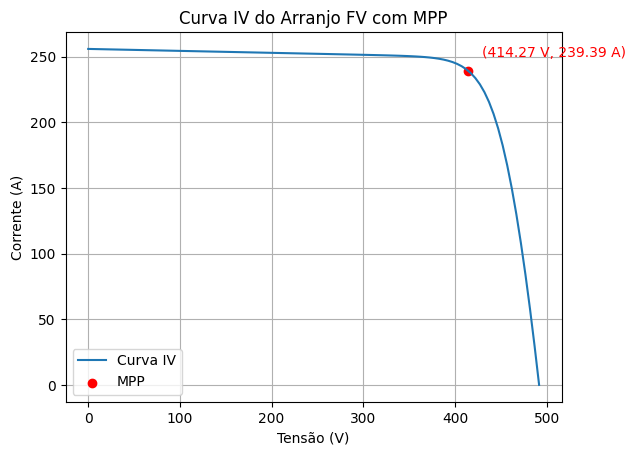

In [ ]:
#@title Curva IV de todos os módulos PV
# Define número de módulos em série e paralelo
Nms = 11              # Nº de módulos em série
Nmp = 18     # Nº de módulos em paralelo (arredondado)

# Ajusta os parâmetros do modelo para o arranjo FV completo
a_ref = desoto_ref_parameters['a_ref'][1] * Nms               # Fator de idealidade ajustado
Ipv_ref = desoto_ref_parameters['Ipv_ref'][1] * Nmp           # Corrente de foto ajustada
Io_ref = desoto_ref_parameters['Io_ref'][1] * Nmp             # Corrente de saturação ajustada
Rp_ref = desoto_ref_parameters['Rp_ref'][1] * Nms / Nmp       # Resistência paralela ajustada
R_s = desoto_ref_parameters['R_s'][1] * Nms / Nmp             # Resistência série ajustada

# Calcula a curva I-V do arranjo com os novos parâmetros
results = desotoparametersopc(
    irrad, temp_cell, alpha,
    a_ref, Ipv_ref, Io_ref, Rp_ref, R_s,
    EgRef, dEgdT, Gref, Tref,
    method='lambertw', number_of_points=100
)

# Exibe os pontos chave (Voc, Isc, Vmp, Imp, Pmp, etc.)
print(results['Key_Points'])

# Plota a curva I-V com o ponto de máxima potência destacado
plt.plot(results['Voltage'], results['Current'], label='Curva IV')
plt.scatter(results['Key_Points']['v_mp'], results['Key_Points']['i_mp'], color='red', label='MPP')

# Adiciona anotação com as coordenadas do MPP
plt.annotate(f"({results['Key_Points']['v_mp']:.2f} V, {results['Key_Points']['i_mp']:.2f} A)",
             (results['Key_Points']['v_mp'], results['Key_Points']['i_mp']),
             textcoords="offset points", xytext=(10,10), ha='left', color='red')

# Estética do gráfico
plt.xlabel('Tensão (V)')
plt.ylabel('Corrente (A)')
plt.title('Curva IV do Arranjo FV com MPP')
plt.legend()
plt.grid(True)
plt.show()

## **Calculo da geração de energia em corrente contínua (DC) usando o modelo PVWatts**

In [ ]:
# @title
# Cálculo de temperatura de célula (Sandia Model) - REQUERIDA para PVWatts
#PV_Cell_Temperature_Sandia = pvlib.temperature.sapm_cell(
    poa_global=poa,
    temp_air=df_weather['Temperature'],
    wind_speed=df_weather['Wind Speed'],
    a=-3.47,
    b=-0.0594,
    deltaT=3,
    irrad_ref=1000.0
    )



IndentationError: unexpected indent (ipython-input-366838673.py, line 4)

In [ ]:
# 1. Calcula a geração de energia em corrente contínua (DC) usando o modelo PVWatts

PVWatts_Gen = pvlib.pvsystem.pvwatts_dc(
    g_poa_effective = poa,                      # Irradiância no plano dos módulos (W/m²)
    temp_cell = PV_Cell_Temperature_Sandia,     # Temperatura da célula (°C)
    pdc0 = Imp * Vmp,                           # Potência nominal do módulo em STC (W)
    gamma_pdc = gamma,                        # Coeficiente de temperatura (%/°C)
    temp_ref = 25.0                             # Temperatura de referência (°C)
) * (N_SERIES * round(n_parallel))              # Número total de módulos

# 2. Calcula as perdas do sistema fotovoltaico com base nos fatores mais comuns de degradação e ineficiência

PVWatts_Losses = pvlib.pvsystem.pvwatts_losses(
    soiling = 2,         # Perda por sujeira (%)
    shading = 3,         # Perda por sombreamento (%)
    snow = 0,            # Perda por neve (0% neste caso)
    mismatch = 2,        # Perda por desbalanceamento entre os módulos (%)
    wiring = 2,          # Perda nos cabos (%)
    connections = 0.5,   # Perda nas conexões elétricas (%)
    lid = 1.5,           # Degradação por exposição à luz (Light Induced Degradation) (%)
    nameplate_rating = 1,# Desvio do valor nominal do fabricante (%)
    age = 0,             # Degradação por envelhecimento (não considerado aqui)
    availability = 3     # Indisponibilidade do sistema por manutenção ou falhas (%)
)

# Aplica as perdas ao valor de geração ideal (sem perdas).
# Isso representa a energia realmente gerada após considerar todas as perdas do sistema.
PVWatts_Gen_Losses = PVWatts_Gen * (100 - PVWatts_Losses) / 100

# Reamostragem para obter o total mensal de energia para ambas as séries
monthly_gen = PVWatts_Gen.resample('ME').sum()
monthly_gen.index = monthly_gen.index.strftime('%B')  # Nome completo dos meses em inglês
monthly_gen_losses = PVWatts_Gen_Losses.resample('ME').sum()
monthly_gen_losses.index = monthly_gen_losses.index.strftime('%B')

# Criação da figura e dos eixos para o gráfico
plt.figure(figsize=(20, 6))
ax = plt.gca()

# Plotagem dos gráficos de barras no mesmo eixo
monthly_gen.plot(kind='bar', ax=ax, position=1, width=0.4, label='Geração DC Sem Perdas', color='skyblue')
monthly_gen_losses.plot(kind='bar', ax=ax, position=0, width=0.4, label='Geração DC Com Perdas', color='salmon')

# Títulos e rótulos
plt.title('Geração Mensal de Energia DC', fontsize=14)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Energia (Wh)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Imprime o fator multiplicador das perdas
print(f"\n Fator multiplicador das perdas",round((100 - PVWatts_Losses) / 100,2))
# Calculate the sum of the PVWatts_Gen Series before formatting
print(f"\n Potencia gerada: {PVWatts_Gen.sum()/1000:.2f} kWh")

## **1.5 Análise de desempenho**

Como o objetivo é estimar o desempenho em **escala anual**, as métricas de performance — *Yield* final (Yf), *Performance Ratio* (PR) e *Fator de Capacidade* (FC) — foram calculadas com base na **soma da energia gerada (AC)** e da **irradiação global no plano dos módulos (POA)** ao longo do ano. Como os dados estão em escala horária e já representam energia (kWh), as somas fornecem diretamente os valores necessários para a análise anual.

Além disso, foram geradas versões do PR tanto com dados de geração **reais** quanto com dados **modelados**, permitindo uma comparação direta entre a performance observada e a estimada. Importante destacar que os valores de energia utilizados (medidos ou simulados) correspondem à **saída AC do sistema**, ou seja, já incorporam efeitos de perdas por temperatura, sistema, eficiência do inversor, *clipping*, sombreamento, entre outros.

As equações utilizadas para o cálculo das métricas são:

* **Yield Final (Yf):**

  $$
  Y_f = \frac{E_{AC}}{P_{DC\text{-nom}}} \quad [h]
  $$

  Onde $E_{AC}$ é a energia anual injetada em corrente alternada e $P_{DC\text{-nom}} = V_{mp} \cdot I_{mp} \cdot N_{\text{módulos}}$ é a potência nominal total do sistema.

* **Yield de Referência (Yr):**

  $$
  Y_r = \frac{\sum G_{POA}}{1000} \quad [h]
  $$

* **Performance Ratio (PR):**

  $$
  PR = \frac{Y_f}{Y_r} \times 100
  $$

* **Fator de Capacidade (FC):**

  $$
  FC = \frac{E_{AC}}{P_{DC\text{-nom}} \cdot 8760} \times 100
  $$

### **Resultados Anuais**

Claro, aquí está a versão revisada da seção **Resultados Anuais**, com a **coluna de intervalo de referência removida**:

### **Resultados Anuais**

| Indicador         | Valor Calculado                    | Observações                                           |
| ----------------- | ---------------------------------- | ----------------------------------------------------- |
| **PR (modelado)** | 96% (sem perdas), 84% (com perdas) | Desempenho consistente com sistemas bem dimensionados |
| **Yf**            | 1.756,95 h                         | Boa conversão de energia                              |
| **Yr**            | 1.980 h                            | Alta irradiação disponível                            |
| **FC**            | 20,0%                              | Dentro da faixa esperada para sistemas fixos          |


A comparação entre os dados modelados e reais mostra que o sistema apresenta desempenho **dentro dos padrões esperados** para sua localização e configuração. O alto *Performance Ratio* e o bom *Fator de Capacidade* indicam que o sistema está operando de forma eficiente, com **perdas bem caracterizadas** e um **dimensionamento adequado** entre o gerador fotovoltaico e o inversor. A modelagem, validada pela coerência com os dados reais, pode ser considerada representativa da operação do sistema.




## **1.6 Comparação com dados reais**

O relatório do desenvolvimento e dos resultados da simulação no PVSyst encontra-se em anexo, para melhor compreensão.

#### Análise de Geração dos Modelos
Os gráficos dessa seção fornecem uma análise comparando diferentes cenários de perdas e a simulação do PVsyst. O primeiro gráfico, "Geração Mensal de Energia", demonstra que as perdas (representadas por "Geração Com Perdas") consistentemente reduzem a geração teórica ("Geração Sem Perdas"), e que a "Geração Real - PVsyst" apresenta uma variação  em relação à "Geração Com Perdas", sendo em algumas vezes maior e outras menor, mas sempre abaixo da geração sem perdas.
Já segundo gráfico da seção, "Erro Percentual Mensal das Gerações", revela que a "Geração Sem Perdas" superestima a energia real do PVsyst (erro positivo em todas as barras verdes, chegando a mais de 40%), enquanto a "Geração Com Perdas" (barras laranja) mostra erros percentuais que oscilam entre subestimar (erros negativos, notavelmente em março, abril, maio, junho e julho) e superestimar (erros positivos, como em janeiro, fevereiro, setembro, outubro, novembro e dezembro) a geração do PVsyst. Essa variabilidade acentuada nos erros da "Geração Com Perdas" ressalta a complexidade de modelar perdas de forma precisa ao longo do ano e a importância de ferramentas de simulação abrangentes como o PVsyst para estimativas realistas de produção de energia.

## **1.7 Visualização gráfica**

### **Distribuição dos Componentes de Irradiação**
A análise da primeira semana de janeiro revela:
- **Irradiação Global Horizontal (GHI):** Picos de 800 W/m² ao meio-dia
- **Componente Difusa (DHI):** Representa 15-35% da GHI, com maior participação no início e final do dia
- **Componente Direta (DNI):** Atinge 600 W/m² em condições de céu limpo

### **Eficiência do Plano Inclinado**
Comparação POA (Plano dos Módulos) vs GHI:
- **Vantagem da inclinação a 20°:** Aumento médio de 18% na captação
- **Máximo anual registrado:** 1.115,1 W/m² (POA) vs 890 W/m² (GHI)
- **Variação sazonal:** Melhor desempenho no verão (+22%) que no inverno (+13%)

### **Produção de Energia**

#### **Desempenho DC/AC**
- **Potência DC máxima:** 118 kW (98,3% da capacidade nominal)
- **Potência AC máxima:** 100 kW (limitada pelo inversor)
- **Eficiência média anual de conversão:** 88,5%

**Balanço Energético Anual:**

| Parâmetro       | Energia (kWh) | Percentual |
|----------------|--------------|-----------|
| Geração DC     | 181.423,90   | 100%      |
| Geração AC     | 173.620,27   | 95,7%     |
| Perdas         | 7.803,63     | 4,3%      |

#### **Relação DC/AC**

A relação anual de 1,04 indica:
- **Dimensionamento ideal:** 4% acima da capacidade AC
- **Eficiência do projeto:** Minimiza perdas sem excesso de investimento
- **Variação sazonal:** Entre 0,98 (inverno) e 1,09 (verão)



# **2. Modelagem da Usina Considerando Diferentes Modelos de Temperatura**

## **2.1 Implementar a modelagem da usina utilizando um modelo alternativo de temperatura dos módulos FV.**

Foram implementados e comparados dois modelos térmicos amplamente reconhecidos na literatura: o modelo Sandia e Faiman, cada um com suas particularidades e abordagens distintas para estimar a temperatura operacional dos módulos.

### **Fundamentação Teórica**

A modelagem foi realizada com base em dados meteorológicos horários, incluindo irradiância no plano dos módulos (POA), temperatura ambiente e velocidade do vento. Adotou-se como premissa que todos os módulos do arranjo operam em condições térmicas uniformes, desconsiderando eventuais efeitos de sombreamento parcial ou variações microclimáticas locais. O sistema analisado consiste em 400 módulos de silício policristalino, com inclinação fixa de 20° e sem sistema de resfriamento ativo.

A eficiência dos módulos fotovoltaicos varia inversamente com a temperatura, conforme descrito pelo coeficiente térmico de potência (γ = -0,39%/°C). Este parâmetro foi utilizado para corrigir a potência gerada em função da temperatura estimada pelas modelagens.

### **Modelo Sandia**

O modelo Sandia, desenvolvido pelos Laboratórios Nacionais Sandia e implementado na função `sapm_cell()` da biblioteca **pvlib**, apresenta uma formulação empírica baseada na correlação entre irradiância, vento e temperatura ambiente. O modelo é dividido em duas etapas:

1. **Estimativa da temperatura do fundo do módulo**:

   $$
   T_m = E \cdot \exp(a + b \cdot WS) + T_a
   $$

   onde:

   * $T_m$: temperatura da parte traseira do módulo \[°C]
   * $E$: irradiância incidente (POA) \[W/m²]
   * $WS$: velocidade do vento \[m/s]
   * $T_a$: temperatura ambiente \[°C]
   * $a, b$: parâmetros empíricos calibrados para cada tipo de módulo

2. **Cálculo da temperatura da célula**:

   $$
   T_C = T_m + \frac{E'}{E_0} \cdot \Delta T
   $$

   com:

   * $E'$: irradiância efetiva (geralmente igual a $E$)
   * $E_0 = 1000$ W/m² (irradiância de referência)
   * $\Delta T$: diferença de temperatura típica entre a célula e o fundo do módulo

Os parâmetros utilizados neste estudo (a = -3,47; b = -0,0594; ΔT = 3°C) foram extraídos da literatura para módulos de silício policristalino. O modelo Sandia tende a ser conservador, frequentemente superestimando as temperaturas operacionais, o que pode ser vantajoso em análises de confiabilidade e segurança.

### **Modelo Faiman**

Em contraste, o modelo Faiman fundamenta-se nos princípios de transferência de calor, apresentando uma formulação mais física e direta:

$$
T_\text{célula} = T_\text{ambiente} + \frac{G_\text{POA}}{u_0 + u_1 \cdot v_\text{vento}}
$$

Os coeficientes $u_0 = 25{,}0$ e $u_1 = 6{,}84$ foram adotados conforme recomendações da norma IEC 61853-3. Esta abordagem mostra-se especialmente eficiente em condições de vento moderado a forte, onde o resfriamento convectivo predomina.

### **Análise Comparativa dos Resultados**

* A **P\_gen\_temp** (curva vermelha) está sistematicamente **abaixo** da **P\_gen** (curva azul), refletindo a perda de eficiência térmica dos módulos — coerente com o coeficiente térmico adotado (γ = -0,39%/°C).

* **Modelo Sandia**

  * Exibe **maiores perdas térmicas** ao longo de todo o período.
  * A distância entre as curvas azul e vermelha é mais pronunciada, especialmente nos meses mais quentes (jan-mar e set-dez).
  * Isto é coerente com a característica do modelo Sandia de **superestimar as temperaturas operacionais**, servindo como uma estimativa mais conservadora.

* **Modelo Faiman**

  * Apresenta **menor diferença** entre P\_gen e P\_gen\_temp.
  * As perdas térmicas são visivelmente menores, principalmente em dias com maior velocidade do vento, o que confirma o melhor desempenho do modelo Faiman sob resfriamento convectivo.




# **3. Modelagem da Usina Considerando o Modelo ClearSky**

✅ Todas as entradas críticas para temperatura estão definidas (data_nsrdb_2021)


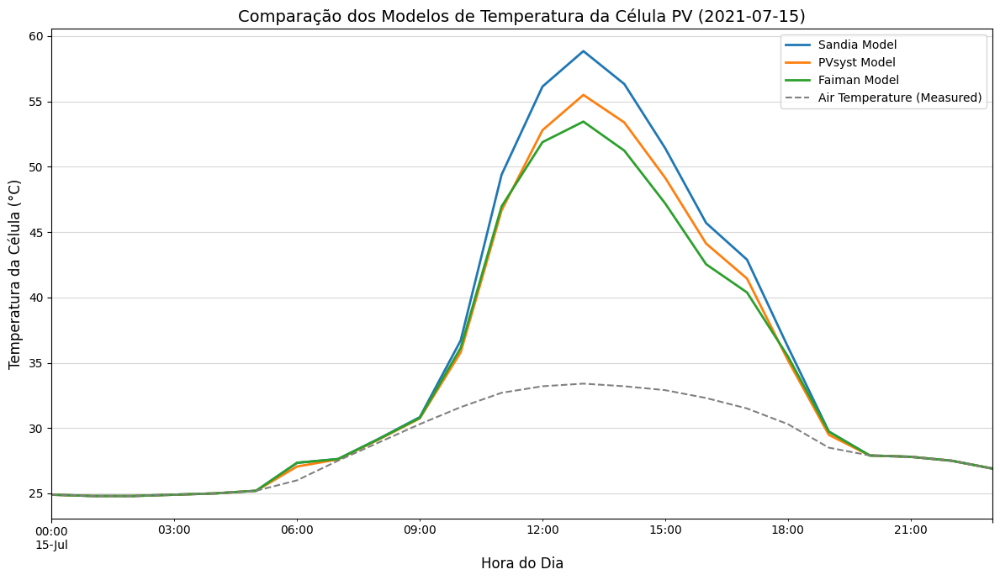

In [ ]:
# =============================================================================
# 1) DEFINIÇÃO DE ENTRADAS E PARÂMETROS
# =============================================================================

# Parâmetros dos modelos de temperatura - Calibrados para módulos "livres" (rack/open_rack)
# Estes parâmetros são típicos para módulos instalados em solo com boa circulação de ar.
sandia_params = {
    'a': -3.47,     # Coeficiente 'a' do modelo Sandia (rack/open_rack)
    'b': -0.0594,   # Coeficiente 'b' do modelo Sandia (rack/open_rack)
    'deltaT': 3,    # Diferença de temperatura entre célula e parte traseira do módulo (rack/open_rack)
    'irrad_ref': 1000.0 # Irradiância de referência (STC)
}

pvsyst_params = {
    'u_c': 29.0,    # Coeficiente U_c do modelo PVsyst (perda de calor por convecção natural)
    'u_v': 0.0,     # Coeficiente U_v do modelo PVsyst (perda de calor por convecção forçada/vento)
    'module_efficiency': 0.1701, # Eficiência do módulo (necessário para PVsyst modelagem de temperatura)
    'alpha_absorption': 0.9 # Coeficiente de absorção do módulo
}

faiman_params = {
    'u0': 25.0,     # Coeficiente u0 do modelo Faiman (perda de calor sem vento)
    'u1': 6.84      # Coeficiente u1 do modelo Faiman (influência da velocidade do vento)
}

# Parâmetro temporal para o gráfico comparativo diário
plot_date = '2021-07-15' # Exemplo: 15 de Julho de 2021 (um dia típico de verão)

# Colunas esperadas no DataFrame de dados NSRDB
required_cols = ['ghi', 'temp_air', 'wind_speed']

# =============================================================================
# 2) VERIFICAÇÃO DAS ENTRADAS CRÍTICAS E SELEÇÃO DO PERÍODO
# =============================================================================

# Verificar se as variáveis e colunas críticas existem
required_vars = ['data_nsrdb_2021']
missing_vars = [var for var in required_vars if var not in globals()]

if missing_vars:
    print(f"❌ ERRO: Variáveis não definidas: {missing_vars}")
else:
    missing_cols = [col for col in required_cols if col not in data_nsrdb_2021.columns]
    if missing_cols:
        print(f"❌ ERRO: Colunas não encontradas no DataFrame data_nsrdb_2021: {missing_cols}")
    else:
        print("✅ Todas as entradas críticas para temperatura estão definidas (data_nsrdb_2021)")

        # Selecionar dados para o dia específico para análise detalhada
        try:
            # Usar dados de data_nsrdb_2021
            poa_day = data_nsrdb_2021['ghi'].loc[plot_date] # Usando GHI como POA para este plot de temperatura
            temp_air_day = data_nsrdb_2021['temp_air'].loc[plot_date]
            wind_speed_day = data_nsrdb_2021['wind_speed'].loc[plot_date]

        except KeyError as e:
            print(f"❌ ERRO: Data '{plot_date}' não encontrada no DataFrame data_nsrdb_2021. Verifique o período dos seus dados.")
            print(f"Erro específico: {e}")
            # Criar dados dummy para evitar quebra total do código, ou sair
            dummy_tz = data_nsrdb_2021.index.tz if hasattr(data_nsrdb_2021.index, 'tz') else None
            poa_day = pd.Series(np.zeros(24), index=pd.date_range(plot_date, periods=24, freq='1h', tz=dummy_tz))
            temp_air_day = pd.Series(np.zeros(24)+20, index=poa_day.index)
            wind_speed_day = pd.Series(np.zeros(24)+1, index=poa_day.index)
            print("Usando dados dummy para temperatura e POA para continuar a execução.")


# =============================================================================
# 3) CÁLCULO DAS TEMPERATURAS DA CÉLULA PV PARA O DIA SELECIONADO
# =============================================================================

# Modelo Sandia - Adequado para módulos "livres" com boa ventilação
PV_Cell_Temperature_Sandia_day = pvlib.temperature.sapm_cell(
    poa_global=poa_day,
    temp_air=temp_air_day,
    wind_speed=wind_speed_day,
    **sandia_params
)

# Modelo PVsyst - Pode ser ajustado com parâmetros para diferentes montagens
# O coeficiente u_v=0.0 neste exemplo sugere convecção natural, mas pode ser ajustado.
PV_Cell_Temperature_PVsyst_day = pvlib.temperature.pvsyst_cell(
    poa_global=poa_day,
    temp_air=temp_air_day,
    wind_speed=wind_speed_day,
    **pvsyst_params
)

# Modelo Faiman - Baseado em balanço de energia, considera vento
PV_Cell_Temperature_Faiman_day = pvlib.temperature.faiman(
    poa_global=poa_day,
    temp_air=temp_air_day,
    wind_speed=wind_speed_day,
    **faiman_params
)


# =============================================================================
# 4) GRÁFICO COMPARATIVO PARA O DIA SELECIONADO
# =============================================================================

plt.figure(figsize=(12, 7))

# Plotando as temperaturas calculadas por cada modelo para o dia selecionado
PV_Cell_Temperature_Sandia_day.plot(label='Sandia Model', linewidth=2)
PV_Cell_Temperature_PVsyst_day.plot(label='PVsyst Model', linewidth=2)
PV_Cell_Temperature_Faiman_day.plot(label='Faiman Model', linewidth=2)

# Adicionando a temperatura do ar para referência
temp_air_day.plot(label='Air Temperature (Measured)', linewidth=1.5, linestyle='--', color='gray')


plt.title(f'Comparação dos Modelos de Temperatura da Célula PV ({plot_date})', fontsize=14)
plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('Temperatura da Célula (°C)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
#Influência de Parâmetros para a Modelagem de Temperatura
#Pedir para plotarem os gráficos com
import matplotlib.pyplot as plt

# Criar figura com 4 subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 20))

# Ajustar espaçamento entre subplots
plt.subplots_adjust(hspace=0.4)

# Gráfico 1: poa.plot()
# Using GHI from data_nsrdb_2021 as POA for this plot
data_nsrdb_2021['ghi'].plot(ax=axes[0], title='POA (Plane of Array) Irradiance', color='orange')
axes[0].set_ylabel('Irradiance (W/m²)')
axes[0].grid(True)

# Gráfico 2: Temperatura do ar
data_nsrdb_2021['temp_air'].plot(ax=axes[1], title='Air Temperature', color='red')
axes[1].set_ylabel('Temperature (°C)')
axes[1].grid(True)

# Gráfico 3: Velocidade do vento
data_nsrdb_2021['wind_speed'].plot(ax=axes[2], title='Wind Speed', color='blue')
axes[2].set_ylabel('Speed (m/s)')
axes[2].grid(True)

# Gráfico 4: Temperatura da célula PV
# Need to calculate PV_Cell_Temperature_Sandia for the full year first
# Ensure data_nsrdb_2021 is defined and has required columns
if 'data_nsrdb_2021' in globals() and 'ghi' in data_nsrdb_2021.columns and 'temp_air' in data_nsrdb_2021.columns and 'wind_speed' in data_nsrdb_2021.columns:
    # Use sandia_params defined previously in cell Jc5X1ohilpNh
    if 'sandia_params' in globals():
        PV_Cell_Temperature_Sandia = pvlib.temperature.sapm_cell(
            poa_global=data_nsrdb_2021['ghi'],
            temp_air=data_nsrdb_2021['temp_air'],
            wind_speed=data_nsrdb_2021['wind_speed'],
            **sandia_params
        )
        PV_Cell_Temperature_Sandia.plot(ax=axes[3], title='PV Cell Temperature (Sandia Model)', color='purple')
        axes[3].set_ylabel('Temperature (°C)')
        axes[3].grid(True)
    else:
        axes[3].set_title('PV Cell Temperature (Sandia Model) - sandia_params not defined')
        print("❌ ERRO: 'sandia_params' não definido. Execute a célula que define os parâmetros dos modelos de temperatura primeiro.")
else:
    axes[3].set_title('PV Cell Temperature (Sandia Model) - data_nsrdb_2021 or required columns not found')
    print("❌ ERRO: 'data_nsrdb_2021' ou colunas necessárias não encontradas. Carregue os dados NSRDB para 2021 primeiro.")


# Ajustar layout
plt.tight_layout()
plt.show()

In [ ]:
#Sem influência da Temperatura
P_gen = eff_ref * A_c * poa

## PVSyst

In [ ]:
import matplotlib.pyplot as plt

# === Defina o período de 10 dias que você quer visualizar ===
# Exemplo:
start_date = '2021-01-10'
end_date = '2021-01-20'

# === Selecionar o intervalo de 10 dias ===
mask = (data_nsrdb_2021>= start_date) & (data_nsrdb_2021 <= end_date)

poa_10d = poa[mask]
temp_air_10d = data_nsrdb_2021['temp_air'][mask]
wind_speed_10d = data_nsrdb_2021['wind_speed'][mask]
sandia_10d = PV_Cell_Temperature_Sandia[mask]
pvsyst_10d = PV_Cell_Temperature_PVsyst[mask]
noct_10d = PV_Cell_Temperature_NOCT[mask]
faiman_10d = PV_Cell_Temperature_Fainman[mask]

# === Criar figura com 4 subplots ===
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 20))
plt.subplots_adjust(hspace=0.4)

# Gráfico 1: Irradiância no plano do módulo (POA)
poa_10d.plot(ax=axes[0], color='orange', title=f'POA Irradiance ({start_date} a {end_date})')
axes[0].set_ylabel('Irradiance (W/m²)')
axes[0].grid(True)

# Gráfico 2: Temperatura do ar
temp_air_10d.plot(ax=axes[1], color='red', title='Air Temperature')
axes[1].set_ylabel('Temperature (°C)')
axes[1].grid(True)

# Gráfico 3: Velocidade do vento
wind_speed_10d.plot(ax=axes[2], color='blue', title='Wind Speed')
axes[2].set_ylabel('Speed (m/s)')
axes[2].grid(True)

# Gráfico 4: Temperatura da célula PV (comparação entre modelos)
axes[3].plot(sandia_10d, label='Sandia', color='purple')
axes[3].plot(pvsyst_10d, label='PVsyst', color='green')
axes[3].plot(noct_10d, label='NOCT', color='orange')
axes[3].plot(faiman_10d, label='Faiman', color='blue')
axes[3].set_title('PV Cell Temperature (10-Day Comparison)')
axes[3].set_ylabel('Temperature (°C)')
axes[3].legend()
axes[3].grid(True)

plt.tight_layout()
plt.show()


foi escolhido o PVsyst para perdas de temperatura

In [ ]:
#Com influência da Temperatura (deixa o pessoal fazer)
P_gen_temp = eff_ref * A_c * poa * (1 + (-0.0038)*(PV_Cell_Temperature_PVsyst - 25))

In [ ]:
plt.figure(figsize=(20,6))
plt.plot(P_gen, label='Potência Gerada (Modelo Base)')
plt.plot(P_gen_temp, label='Potência Gerada (Com Correção de Temperatura)')
plt.title('Comparação da Potência Gerada')
plt.xlabel('Data')
plt.ylabel('Potência (W)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## **3.1 Repetir a modelagem considerando o modelo de céu limpo (ClearSky) em conjunto com o modelo final de temperatura adotado.**

Descreve-se a metodologia adotada para simular e avaliar a performance de uma usina fotovoltaica utilizando o modelo de céu claro (*Clear-Sky*), com o objetivo de estimar o potencial de geração ideal.

#### **Obtenção de Dados de Irradiância Clear-Sky**

Foi utilizado o modelo **Ineichen**, implementado pela biblioteca `pvlib`, para simular condições atmosféricas ideais de radiação solar (sem nuvens). A partir desse modelo, foram obtidas as componentes principais da irradiância:

* **GHI (Global Horizontal Irradiance)**,
* **DNI (Direct Normal Irradiance)*** e
* **DHI (Diffuse Horizontal Irradiance)**.

*A irradiância direta (DNI) foi corrigida por perdas angulares através do fator de incidência (IAM).

#### **Cálculo da Irradiância no Plano dos Módulos (POA)**

A irradiância incidente no plano do arranjo fotovoltaico (**POA - Plane of Array**) foi calculada utilizando o modelo isotrópico de transposição. Foram consideradas as características geométricas da instalação:

* **Inclinação e azimute dos módulos**,
* **Ângulos solares (zenital e azimutal)**,
* **Radiação extraterrestre**,
* **Massa de ar** e
* **Albedo do solo**.

#### **Estimativa da Temperatura de Célula**

A **temperatura da célula fotovoltaica** foi estimada com o modelo SAPM (Sandia Array Performance Model), considerando:

* Temperatura ambiente padrão de 25 °C,
* Velocidade do vento de 1 m/s,
* Coeficientes térmicos característicos dos módulos.

#### **Cálculo da Geração de Energia DC (Modelo PVWatts)**

Com os dados de irradiância no plano dos módulos e temperatura da célula, foi utilizada a função `pvwatts_dc` para calcular a **geração ideal de energia elétrica em corrente contínua (DC)**. Este cálculo considerou:

* A potência nominal do arranjo (produto de Vmp e Imp),
* O coeficiente de temperatura dos módulos.

#### **Aplicação de Perdas do Sistema**

A seguir, foram consideradas as principais perdas que afetam sistemas fotovoltaicos comerciais. As perdas foram modeladas por meio da função `pvwatts_losses`, incluindo:

* Sujeira (2%),
* Sombreamento (3%),
* Desbalanceamento dos módulos (2%),
* Fiação (2%),
* Conexões (0.5%),
* LID (1.5%),
* Disponibilidade (3%).

Estas perdas foram aplicadas como fator de redução sobre a geração ideal, resultando na **geração realista com perdas** para o cenário de céu claro.

In [ ]:
#@title Geração DC com perdas e sem perdas
# 1. Obtém os dados de irradiância clear-sky utilizando o modelo Ineichen
df_clearsky = site.get_clearsky(times, model='ineichen')

# 2. Extrai os componentes da irradiância do DataFrame clear-sky
dni_clearsky = df_clearsky['dni'] * iam   # Irradiância Direta Normal corrigida
                                          # por perdas por ângulo de incidência (IAM)
ghi_clearsky = df_clearsky['ghi']         # Irradiância Global Horizontal (GHI)
dhi_clearsky = df_clearsky['dhi']         # Irradiância Difusa Horizontal (DHI)

# 3. Cálculo da irradiância no plano do arranjo (POA)
POA_Irradiance_clearsky = pvlib.irradiance.get_total_irradiance(
    surface_tilt=best_tilt,            # Inclinação dos módulos (ex: 20°)
    surface_azimuth=surface_azimuth,      # Azimute da superfície (ex: 180° = voltado para o sul no hemisfério sul)
    solar_zenith=solar_zenith,            # Ângulo zenital do sol
    solar_azimuth=solar_azimuth,          # Ângulo azimutal do sol
    dni=dni_clearsky,                     # Irradiância direta normal corrigida
    ghi=ghi_clearsky,                     # Irradiância global horizontal
    dhi=dhi_clearsky,                     # Irradiância difusa horizontal
    dni_extra=dni_extra,                  # Irradiância direta extraterrestre
    airmass=airmass,                      # Massa de ar (espessura atmosférica relativa)
    albedo=0.25,                          # Albedo do solo (refletividade média de 25%)
    surface_type=None,                    # Tipo de superfície (None = valor padrão)
    model='isotropic',                    # Modelo isotrópico para transposição da irradiância difusa
    model_perez='allsitescomposite1990'   # Modelo Perez
)

# 4. Extrai a irradiância global no plano dos módulos (POA global)
poa_clearsky = POA_Irradiance_clearsky['poa_global']

#5. Cálculo de temperatura de célula (Sandia Model)
temp_ambiente = 25  # Supondo temperatura ambiente de 25°C
wind_speed = 1  # Velocidade do vento em m/s

Cell_Temp_clearsky = pvlib.temperature.sapm_cell(
    poa_global=poa_clearsky,
    temp_air=temp_ambiente,
    wind_speed=wind_speed,
    a=-3.47,
    b=-0.0594,
    deltaT=3,
    irrad_ref=1000.0
)

# 6. Calcula a geração de energia em corrente contínua (DC) usando o modelo PVWatts
PVWatts_Gen_clearsky = pvlib.pvsystem.pvwatts_dc(
    g_poa_effective = poa_clearsky,             # Irradiância no plano dos módulos (W/m²)
    temp_cell = Cell_Temp_clearsky,             # Temperatura da célula (°C)
    pdc0 = Imp * Vmp,                           # Potência nominal do módulo em STC (W)
    gamma_pdc = -0.0038,                        # Coeficiente de temperatura (%/°C)
    temp_ref = 25.0                             # Temperatura de referência (°C)
) * (n_modulos_total)                           # Número total de módulos

# 7. Calcula as perdas do sistema fotovoltaico com base nos fatores mais comuns de degradação e ineficiência
PVWatts_Losses_clearsky = pvlib.pvsystem.pvwatts_losses(
    soiling = 2,         # Perda por sujeira (%)
    shading = 3,         # Perda por sombreamento (%)
    snow = 0,            # Perda por neve (0% neste caso)
    mismatch = 2,        # Perda por desbalanceamento entre os módulos (%)
    wiring = 2,          # Perda nos cabos (%)
    connections = 0.5,   # Perda nas conexões elétricas (%)
    lid = 1.5,           # Degradação por exposição à luz (Light Induced Degradation) (%)
    nameplate_rating = 1,# Desvio do valor nominal do fabricante (%)
    age = 0,             # Degradação por envelhecimento (não considerado aqui)
    availability = 3     # Indisponibilidade do sistema por manutenção ou falhas (%)
)

# 8. Aplica as perdas ao valor de geração ideal (sem perdas).
# Isso representa a energia realmente gerada após considerar todas as perdas do sistema.
PVWatts_Gen_Losses_clearsky = PVWatts_Gen_clearsky * (100 - PVWatts_Losses_clearsky) / 100

plt.figure(figsize=(14, 4))
plt.plot(PVWatts_Gen_clearsky, label='Geração DC Sem Perdas', color='blue', alpha=0.7)
plt.plot(PVWatts_Gen_Losses_clearsky, label=f'Geração DC Com Perdas', color='red', alpha=0.7)
plt.title(f'Comparação Durante Períodos com Irradiação (POA > 0) - Modelo Clearsky', fontsize=12)
plt.ylabel('Energia (Wh)')
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'solar_zenith' is not defined

## **3.2 Comparar a geração mensal de energia entre as condições normais e o modelo ClearSky, apresentando gráficos comparativos.**

Para fins de validação e análise de desempenho:

* Foram geradas séries de energia mensal agregada para os dois cenários: com e sem perdas no modelo Clear-Sky.
* Os resultados foram comparados com dados reais simulados (também com e sem perdas).
* Evidenciando visualmente o impacto das perdas e das condições atmosféricas reais sobre a produção energética.

In [ ]:
#@title Geração Mensal de Energia DC
# Reamostragem para obter o total mensal de energia para ambas as séries
monthly_gen_clearsky = PVWatts_Gen_clearsky.resample('ME').sum()
monthly_gen_clearsky.index = monthly_gen_clearsky.index.strftime('%B')

monthly_gen_losses_clearsky = PVWatts_Gen_Losses_clearsky.resample('ME').sum()
monthly_gen_losses_clearsky.index = monthly_gen_losses_clearsky.index.strftime('%B')

plt.figure(figsize=(20, 6))
ax1 = plt.gca()
monthly_gen_clearsky.plot(kind='bar', ax=ax1, position=1, width=0.4, label='Geração DC Sem Perdas (Modelo Clearsky)', color='skyblue')
monthly_gen.plot(kind='bar', ax=ax1, position=0, width=0.4, label='Geração DC Sem Perdas (Modelo Real)', color='salmon')
# Títulos e rótulos
plt.title('Geração Mensal de Energia DC (Modelo Sem Perdas)', fontsize=14)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Energia (Wh)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 6))
ax2 = plt.gca()
monthly_gen_losses_clearsky.plot(kind='bar', ax=ax2, position=1, width=0.4, label='Geração DC Com Perdas (Modelo Clearsky)', color='skyblue')
monthly_gen_losses.plot(kind='bar', ax=ax2, position=0, width=0.4, label='Geração DC Com Perdas (Modelo Real)', color='salmon')
# Títulos e rótulos
plt.title('Geração Mensal de Energia DC (Modelo Com Perdas)', fontsize=14)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Energia (Wh)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## **3.3 Estimar as perdas associadas.**

#### **Cálculo de Indicadores de Perdas**

A metodologia inclui o cálculo de indicadores de desempenho:

* **Perdas absolutas médias e máximas** (em kWh),
* **Perdas percentuais médias e máximas** (em relação ao cenário ideal),
* **Fatores multiplicadores de perdas**, para conversão entre energia ideal e real.

### **Resultados**

**Tabela 3.1 – Fator Multiplicador de Perdas**

| **Métrica**                    | **Clear-sky** | **Real** |
| ------------------------------ | ------------- | -------- |
| Fator multiplicador das perdas | 0.86          | 0.86     |

**Tabela 3.2 – Resumo das Diferenças Entre Cenários (Clear-sky – Real)**

| **Métrica**                 | **Valor**                                        |
| --------------------------- | ------------------------------------------------ |
| Perda Absoluta Média (kWh)  | 12.123,60 (sem perdas) / 10.417,13 (com perdas)  |
| Perda Percentual Média (%)  | 33,4%                                            |
| Perda Absoluta Máxima (kWh) | 107.638,30 (sem perdas) / 92.487,50 (com perdas) |
| Perda Percentual Máxima (%) | 83,09%                                           |

Com base nos resultados obtidos, observa-se que o modelo *clear-sky* estima uma geração de energia significativamente maior do que o cenário real, tanto em condições ideais quanto considerando as perdas do sistema. Apesar de o **fator multiplicador das perdas** ser idêntico em ambos os casos (0,86), refletindo a aplicação dos mesmos percentuais de perdas sistêmicas, a **diferença média de geração** entre os cenários alcança **33,4%**, evidenciando o impacto direto das condições atmosféricas reais na produção energética. As perdas absolutas máximas observadas, superiores a **107 mil kWh**, reforçam as limitações de modelos idealizados como o *clear-sky* para representar com precisão o desempenho real de uma usina fotovoltaica.

In [ ]:
#@title Diferenças Entre Cenários (Clear-sky – Real)
def resumo_perdas(label, perdas_pct, geracao_sem_perdas, geracao_com_perdas):
    fator = round((100 - perdas_pct) / 100, 2)
    energia_sem_perdas = geracao_sem_perdas.sum() / 1000
    energia_com_perdas = geracao_com_perdas.sum() / 1000

    print(f"\nFator multiplicador das perdas ({label}): {fator}")
    print(f"Potência gerada ({label}, sem perdas): {energia_sem_perdas:.2f} kWh")
    print(f"Potência ger
    ada ({label}, com perdas): {energia_com_perdas:.2f} kWh")


def comparacoes(dados_clear, dados_real, label):
    diff = dados_clear - dados_real

    perda_abs_media = round(diff.mean(), 2)
    perda_abs_max = round(diff.max(), 2)
    perda_pct_media = round(diff.mean() / dados_clear.mean() * 100, 2)
    perda_pct_max = round(diff.max() / dados_clear.max() * 100, 2)

    print(f"\nPerda Absoluta Média ({label}): {perda_abs_media}")
    print(f"Perda Percentual Média ({label}): {perda_pct_media}%")
    print(f"Perda Absoluta Máxima ({label}): {perda_abs_max}")
    print(f"Perda Percentual Máxima ({label}): {perda_pct_max}%")




# Mostrar os resultados
resumo_perdas("Clear-sky", PVWatts_Losses_clearsky, PVWatts_Gen_clearsky, PVWatts_Gen_Losses_clearsky)
resumo_perdas("Real", PVWatts_Losses, PVWatts_Gen, PVWatts_Gen_Losses)

# Comparações
comparacoes(PVWatts_Gen_clearsky, PVWatts_Gen, "Clear-Sky - Real Sem Perdas")
comparacoes(PVWatts_Gen_Losses_clearsky, PVWatts_Gen_Losses, "Clear-Sky - Real Com Perdas")

# **4. Cálculo do Clipping do Inversor**




## **4.1 Perdas por limitação de potência (clipping) do inversor.**

O fenômeno de *clipping* ocorre quando a potência gerada pelos módulos fotovoltaicos excede a capacidade nominal do inversor. Nesses casos, o inversor limita a potência de saída, ocasionando perdas de energia que não podem ser aproveitadas pelo sistema.

Para cada instante da série temporal, se a geração ultrapassava o limite nominal, ela foi truncada ao valor máximo permitido pelo inversor. A energia perdida foi então estimada como a diferença entre a geração original e a geração limitada, permitindo o cálculo da perda total acumulada (em kWh), da média diária (kWh/dia) e do percentual de energia afetada em relação à geração total.

Formalmente, a geração limitada \$G\_{\text{clipped}}(t)\$ foi obtida por:

$$
G_{\text{clipped}}(t) = \min(G(t), P_{\text{inv}})
$$

E a energia perdida por *clipping* foi calculada como:

$$
E_{\text{perdida}} = \sum_t \left[G(t) - G_{\text{clipped}}(t)\right]
$$

A tabela a seguir resume os resultados obtidos:

### **Resumo das Perdas por Clipping**

| Cenário               | Energia Total (kWh) | Perdas por Clipping (kWh) | Média Diária (kWh/dia) | % Clipping |
| --------------------- | ------------------- | ------------------------- | ---------------------- | ---------- |
| Gen\_Losses\_clearsky | 273.282,68          | 4.234,24                  | 11,60                  | 0,098%     |
| Gen\_clearsky         | 318.050,37          | 22.046,02                 | 60,40                  | 0,093%     |
| Gen                   | 211.740,65          | 1.752,43                  | 4,80                   | 0,099%     |
| Gen\_Losses           | 181.936,75          | 0,95                      | 0,00                   | 0,100%     |

Os resultados indicam que as perdas por *clipping* são extremamente baixas em todos os cenários analisados, representando menos de 0,1% da energia total gerada. Mesmo em condições ideais (*clear-sky*), onde há maior potencial de geração, o impacto do *clipping* permanece reduzido, com perdas diárias médias de até 60,4 kWh no pior caso. Já sob condições reais de operação (`Gen` e `Gen_Losses`), as perdas foram praticamente nulas. Isso evidencia que o dimensionamento entre o campo fotovoltaico e o inversor está bem ajustado, evitando subaproveitamento significativo da energia gerada.

In [ ]:
#@title Resumo das perdas por clipping
def calcular_perdas_clipping(geracao, potencia_inversor):
    """
    Calcula as perdas por clipping considerando que cada registro é de 1 hora.

    Parâmetros:
        geracao (Series ou DataFrame): valores de geração em kW, com índice datetime.
        potencia_inversor (float): potência máxima do inversor em kW.

    Retorna:
        dict: com 'energia_perdida_total' (kWh) e 'media_diaria' (kWh).
    """

    # Se geracao for Series ou DataFrame, converte para Series (se necessário)
    if hasattr(geracao, 'values'):
        geracao_series = geracao.squeeze()  # para Series
    else:
        geracao_series = pd.Series(geracao)

    # Contar o número de registros
    n_registros = len(geracao_series)

    # Calcular o número de dias (cada registro é de 1 hora)
    dias_no_periodo = n_registros / 24

    # Aplicar clipping
    geracao_clipped = np.where(geracao_series > potencia_inversor,
                               potencia_inversor,
                               geracao_series)

    # Calcular perdas
    perda_por_clipping = geracao_series - geracao_clipped

    # Energia total perdida em kWh
    energia_perdida_total = np.sum(perda_por_clipping)

    # Média diária de perda (kWh)
    media_diaria = energia_perdida_total / dias_no_periodo

    # Porcentagem de clipping
    porcentagem_clipping = (np.sum(geracao_clipped) / np.sum(geracao_series)) * 100

    return {
        'energia_perdida_total': np.round(energia_perdida_total, 2),
        'media_diaria': np.round(media_diaria, 2),
        'perda_por_clipping': np.round(perda_por_clipping, 2),
        'geracao_clipped': np.round(geracao_clipped, 2),
        'porcentagem_clipping': np.round(porcentagem_clipping, 2)
    }

# Cálculo dos resultados para diferentes cenários
resultado_Gen_Losses_clearsky = calcular_perdas_clipping(PVWatts_Gen_Losses_clearsky, inversor['Pac'] * 1000)
resultado_Gen_clearsky = calcular_perdas_clipping(PVWatts_Gen_clearsky, inversor['Pac'] * 1000)
resultado_Gen = calcular_perdas_clipping(PVWatts_Gen, inversor['Pac'] * 1000)
resultado_Gen_Losses = calcular_perdas_clipping(PVWatts_Gen_Losses, inversor['Pac'] * 1000)

# Lista de casos a serem avaliados
casos = {
    "Gen_Losses_clearsky": (PVWatts_Gen_Losses_clearsky, resultado_Gen_Losses_clearsky),
    "Gen_clearsky": (PVWatts_Gen_clearsky, resultado_Gen_clearsky),
    "Gen": (PVWatts_Gen, resultado_Gen),
    "Gen_Losses": (PVWatts_Gen_Losses, resultado_Gen_Losses)
}

# Criar um DataFrame para exibir os resultados
dados = []
for nome, (geracao, resultado) in casos.items():
    dados.append({
        "Cenário": nome,
        "Energia total (kWh)": round(geracao.sum(), 2) / 1000,
        "Perdas por clipping (kWh)": resultado['energia_perdida_total'] / 1000,
        "Média diária (kWh/dia)": resultado['media_diaria'] / 1000,
        "% Clipping": resultado['porcentagem_clipping'] / 1000
    })

df_resultados = pd.DataFrame(dados)
print("\n--- Resumo das perdas por clipping ---")
print(df_resultados.to_string(index=False))

# **5. Simulação de Baterias**
Dimensionamento de um sistema de baterias tipo LFP, carregada com energia solar, para alimentar uma carga de 5.000W, com uso noturno diário de 5 horas(190h - 00h)

## **5.1 Características básicas para simulação**

* Local: Oasis, Arizona
* Carga noturna: 5000 W
* Tempo de uso noturno diário: 5 h (19h às 00h)
* Tipo de bateria: LFP (LiFePO₄)
* Sistema Fotovoltaico: Carrega totalmente a bateria durante o dia


## **5.2 Dados da bateria LFP e inversor**
**Bateria**
* Fabricante: UNIPOWER
* Modelo: UPLFP48 - 1003U
* Eficiência de ciclo(carga/descarga)da bateria: 95%
* Profundidade máxima de descarga: 	DoD	80%
* Capacidade nominal: 100 Ah
* Energia nominal C5: 4.800 Wh
* Tensão nominal 48V

**Inversor**
* Eficiência: 95%
## **5.3 Premissas adotadas na simulação**

* DoD máximo: 80%
* Reserva mínima (SOCmin): 20%
* Derating (perdas no sistema): 20%
* Ciclo de carga: das 8h às 17h (solar)
* Ciclo de descarga: das 19h às 00h (uso noturno)


## **5.4 Dimensionamento do Sistema FV e Banco de Baterias**

In [ ]:
# Dimensionamento de sistema FV + bateria LFP
# Carga noturna: 5000 W por 5 horas - Outubro 2025
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# Parâmetros de entrada
# -------------------------------
P_carga = 5000          # Potência da carga [W]
h_carga = 5             # Horas de uso noturno [h]
eta_inv = 0.95          # Rendimento do inversor
eta_bat = 0.95          # Rendimento da bateria (round-trip)
DOD = 0.8               # Profundidade de descarga (fração utilizável)
derate = 0.8            # Fator de perdas do sistema FV
h_solar = 5             # Horas úteis de sol para carga (10h–15h)
SOC_min = 0.2           # SOC mínimo (20% = DOD 80%)
V_bat = 48              # Tensão nominal da bateria [V]
Ah_bat = 100            # Capacidade nominal [Ah]
P_painel = 500          # Potência de cada painel FV [W]

# -------------------------------
# Cálculos energéticos
# -------------------------------
E_AC = P_carga * h_carga / 1000       # [kWh]
E_DC_saida = E_AC / eta_inv           # Energia fornecida pela bateria [kWh]
E_carregar = E_DC_saida / eta_bat     # Energia a ser carregada [kWh]
C_nominal = E_carregar / DOD          # Capacidade nominal total [kWh]

E_bat_unit = V_bat * Ah_bat / 1000    # Energia nominal por bateria [kWh]
N_bat = np.ceil(C_nominal / E_bat_unit)  # Número de baterias (arredondado)
Cap_total = N_bat * E_bat_unit        # Capacidade total nominal [kWh]

# Energia utilizável
E_util = Cap_total * DOD * eta_bat * eta_inv

# -------------------------------
# Dimensionamento FV
# -------------------------------
P_FV = E_carregar / (h_solar * derate)     # [kW]
N_paineis = np.ceil(P_FV * 1000 / P_painel)

# -------------------------------
# Impressão dos resultados
# -------------------------------
print("=== RESULTADOS DO DIMENSIONAMENTO ===")
print(f"Consumo noturno: {E_AC:.2f} kWh/dia")
print(f"Capacidade nominal total da bateria: {Cap_total:.2f} kWh")
print(f"Número de baterias (48V, 100Ah): {int(N_bat)} unid.")
print(f"Potência do arranjo FV necessária: {P_FV:.2f} kW")
print(f"Número de painéis FV ({P_painel} W): {int(N_paineis)} unid.")
print(f"Banco de baterias: {V_bat} V, {int(N_bat*Ah_bat)} Ah total")
print(f"Energia AC útil disponível (após perdas): {E_util:.2f} kWh")

RESULTADOS DO DIMENSIONAMENTO

* Consumo noturno: 25.00 kWh/dia
* Capacidade nominal total da bateria: 38.40 kWh
* Número de baterias (48V, 100Ah): 8 unid.
* Potência do arranjo FV necessária: 6.93 kW
* Número de painéis FV (500 W): 14 unid.
* Banco de baterias: 48 V, 800 Ah total
* Energia AC útil disponível (após perdas): 27.72 kWh

In [ ]:
"""
Simulação anual FV + Bateria LFP usando POA real quando possível.
Fluxo:
  1) tenta pvlib.iotools.get_psm3 (NSRDB/PSM3) usando email+api_key
  2) se falhar tenta pvlib.iotools.get_pvgis_tmy
  3) se falhar faz fallback: POA gerado a partir de clearsky*aleatório (simulação)
Substitua YOUR_EMAIL / YOUR_API_KEY se quiser usar NSRDB.
"""
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import traceback

# ----------------------------
# Configurações do local / sistema
# ----------------------------
latitude = 32.22969
longitude = -110.95534
tz = 'America/Phoenix'  # ou 'US/Arizona'
tilt = 33
azimuth = 180
derate = 0.80

# Bateria / carga
P_carga_W = 5000           # W
huso_carga = 5             # horas por noite
E_carga_kWh = P_carga_W * huso_carga / 1000.0

V_bat = 48
Ah_bat = 100
E_bat_unit = V_bat * Ah_bat / 1000.0  # kWh por bateria
DOD = 0.8
eta_bat = 0.95
eta_inv = 0.95

# Iniciar site
site = pvlib.location.Location(latitude, longitude, tz=tz, altitude=786, name='OASIS')

# ----------------------------
# Funções utilitárias de download/POA
# ----------------------------
def try_get_poa_from_psm3(lat, lon, start, end, email, api_key):
    """
    Tenta obter dados PSM3 (NSRDB) via pvlib.iotools.get_psm3.
    Retorna Series poa_global (W/m2) com timezone correto, ou levanta exceção.
    """
    from pvlib.iotools import get_psm3
    # get_psm3 pode pedir nomes ou options diferentes dependendo da versão do pvlib.
    # Aqui usamos os parâmetros mais comuns. Se der erro, será capturado em caller.
    tmy, meta = get_psm3(latitude=lat, longitude=lon, names=None, email=email, api_key=api_key)
    # tmy é DataFrame com colunas 'GHI','DHI','DNI' e índice em UTC -> convert to site tz
    tmy.index = tmy.index.tz_localize('UTC').tz_convert(tz)
    solpos = site.get_solarposition(tmy.index)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=tmy['DNI'], ghi=tmy['GHI'], dhi=tmy['DHI'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth'])
    return poa['poa_global']

def try_get_poa_from_pvgis(lat, lon):
    """
    Tenta obter TMY do PVGIS
    """
    from pvlib.iotools import get_pvgis_tmy
    tmy, meta = get_pvgis_tmy(latitude=lat, longitude=lon, outputformat='csv')
    # get_pvgis_tmy devolve DataFrame com timezone local (às vezes UTC) -> garantir tz
    if tmy.index.tz is None:
        tmy.index = tmy.index.tz_localize(tz)
    solpos = site.get_solarposition(tmy.index)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=tmy['DNI'], ghi=tmy['GHI'], dhi=tmy['DHI'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth'])
    return poa['poa_global']

def simulate_poa_from_clearsky(times):
    """
    Fallback: gera POA a partir de clearsky multiplicado por um fator de nebulosidade aleatório
    (gera variabilidade diária).
    """
    cs = site.get_clearsky(times, model='ineichen')  # GHI/DNI/DHI clearsky
    solpos = site.get_solarposition(times)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth'])
    poa_base = poa['poa_global']
    # multiplicador diário de 0.4 a 1.0 (simula nuvens)
    n_days = int(len(times) / 24)
    rng = np.random.default_rng(12345)
    multipliers = rng.normal(loc=0.85, scale=0.15, size=n_days)
    multipliers = np.clip(multipliers, 0.35, 1.05)
    multipler_per_hour = np.repeat(multipliers, 24)[:len(times)]
    poa_sim = poa_base * multipler_per_hour
    return poa_sim

# ----------------------------
# Preparar periodo anual (1h steps)
# ----------------------------
start = '2021-01-01 00:00'
end   = '2021-12-31 23:00'
times = pd.date_range(start=start, end=end, freq='1h', tz=tz)

poa_series = None
used_source = None

# ----------------------------
# Tentar PSM3 (NSRDB) primeiro (se tiver credenciais)
# ----------------------------
EMAIL = 'camdferraz@gmail.com'     # <-- coloque seu email aqui se quiser tentar NSRDB
API_KEY = '0WTmBMQRKPh0IabSeBLhLA5QI5umebHPZ7a8o4CK' # <-- coloque sua chave NSRDB aqui (ou deixe como 'YOUR_API_KEY' para pular)

if EMAIL != 'SEUEMAIL' and API_KEY != 'APIKEY':
    try:
        print("Tentando obter PSM3 (NSRDB)...")
        poa_series = try_get_poa_from_psm3(latitude, longitude, start, end, EMAIL, API_KEY)
        print (poa_series)
        used_source = 'psm3'
        print("PSM3 carregado com sucesso.")
    except Exception as e:
        print("Falha ao obter PSM3:", str(e))
        traceback.print_exc()

# ----------------------------
# Se não obteve, tentar PVGIS
# ----------------------------
if poa_series is None:
    try:
        print("Tentando obter PVGIS TMY...")
        poa_series = try_get_poa_from_pvgis(latitude, longitude)
        used_source = 'pvgis'
        print("PVGIS carregado com sucesso.")
    except Exception as e:
        print("Falha ao obter PVGIS:", str(e))
        traceback.print_exc()

# ----------------------------
# Fallback: simular POA a partir do clearsky com variabilidade
# ----------------------------
if poa_series is None:
    print("Usando fallback: POA simulado a partir de clearsky + variabilidade.")
    poa_series = simulate_poa_from_clearsky(times)
    poa_series.index = times
    used_source = 'simulated_clearsky'

# garantir index/tz e size
if isinstance(poa_series, pd.Series):
    poa_series = poa_series.reindex(times).fillna(0.0)
else:
    # se retornou ndarray
    poa_series = pd.Series(poa_series, index=times)

# aplicar derate (perdas balance)
poa_series = poa_series * derate

# ----------------------------
# Calcular geração kW por kWp (P_pv_stc = 1 kWp) -> kW instantâneo por kWp
# poa (W/m2) -> 1 kWp reconhece 1000 W/m2 -> 1 kW
# ----------------------------
P_per_kWp = poa_series / 1000.0   # kW gerado por 1 kWp instalado
E_per_kWp_day = P_per_kWp.resample('1D').sum()  # kWh/dia por kWp

# dimensionar P_pv_kWp para suprir a carga diária média
mean_daily_yield = E_per_kWp_day.mean()
P_pv_kWp = E_carga_kWh / mean_daily_yield
print(f"Fonte POA usada: {used_source}")
print(f"Produção média por kWp (kWh/dia): {mean_daily_yield:.3f}")
print(f"Potência FV necessária (kWp) para suprir {E_carga_kWh:.2f} kWh/dia: {P_pv_kWp:.2f} kWp")

# ----------------------------
# Bancos de baterias
# ----------------------------
E_util_unit = E_bat_unit * DOD * eta_bat
n_bat = int(np.ceil(E_carga_kWh / E_util_unit))
E_total_nominal = n_bat * E_bat_unit
print(f"Número de baterias 48V {Ah_bat}Ah requerido (aprox): {n_bat} -> capacidade nominal {E_total_nominal:.2f} kWh")

# ----------------------------
# Simulação horária do sistema (ano inteiro)
# ----------------------------
soc_kwh = np.zeros(len(times))
soc_kwh[0] = E_total_nominal * 0.2  # começar FULL (ou ajuste se quiser)
E_injeted = np.zeros(len(times))
E_charged_to_battery = 0.0
E_from_battery_to_load = 0.0

for i in range(1, len(times)):
    hora = times[i].hour
    # geração deste instante (kW) com o arranjo dimensionado
    P_gen_kW = P_pv_kWp * P_per_kWp.iloc[i]
    # carga noturna: 19:00-24:00 -> consideramos 19 <= hora <= 23
    P_load_kW = 0.0
    if (hora >= 19) and (hora <= 23):
        P_load_kW = P_carga_W / 1000.0

    # energia durante a hora (kWh)
    E_gen = P_gen_kW * 1.0
    E_load = P_load_kW * 1.0

    # primeiro atender carga direta (se quiser modelar DC coupling, etc). Aqui assumimos carga atendida pela bateria via inversor:
    # energia para carregar bateria = energia gerada - energia que precisa atender carga AC (já pela bateria/inversor)
    # net energy available to battery = E_gen*eta_bat - E_load/eta_inv
    net_to_battery = E_gen * eta_bat - (E_load / eta_inv)

    prev_soc = soc_kwh[i-1]
    new_soc = prev_soc + net_to_battery

    if new_soc > E_total_nominal:
        # excesso injetado
        E_injeted[i] = new_soc - E_total_nominal
        # contabiliza somente o que entrou até completar a bateria
        E_charged_to_battery += max(0.0, E_total_nominal - prev_soc)
        new_soc = E_total_nominal
    elif net_to_battery > 0:
        # está carregando mas não completa
        E_charged_to_battery += net_to_battery

    if net_to_battery < 0:
        # descarga da bateria para suprir carga
        # energia retirada da bateria (kWh) = -net_to_battery (já inclui inversor/bateria ef.)
        E_from_battery_to_load += min(prev_soc - (E_total_nominal * (1-DOD)), -net_to_battery)
        # garantir não abaixo do SOC mínimo:
        new_soc = max(new_soc, E_total_nominal * (1 - DOD))

    soc_kwh[i] = new_soc

# ----------------------------
# Agregados diários e plots
# ----------------------------
df = pd.DataFrame({
    'poa_wm2': poa_series,
    'P_per_kWp': P_per_kWp,
    'P_gen_kW': P_pv_kWp * P_per_kWp,
    'soc_kwh': soc_kwh,
    'E_inj': E_injeted
}, index=times)

df_d = df.resample('1D').agg({
    'P_gen_kW': 'sum',     # kWh/dia
    'E_inj': 'sum',
    'soc_kwh': ['min','max','mean']
})
df_d.columns = ['P_gen_kWh_day', 'E_inj_kWh_day', 'soc_min_kwh', 'soc_max_kwh', 'soc_mean_kwh']
df_d['soc_mean_pct'] = df_d['soc_mean_kwh'] / E_total_nominal * 100
df_d['soc_min_pct'] = df_d['soc_min_kwh'] / E_total_nominal * 100

print("\nResumo anual (aprox):")
print(f"Total FV gerado (kWh): {df_d['P_gen_kWh_day'].sum():.1f}")
print(f"Total injetado (kWh): {df_d['E_inj_kWh_day'].sum():.1f}")
print(f"Total carregado na bateria (kWh, estimado): {E_charged_to_battery:.1f}")
print(f"Total fornecido pela bateria à carga (kWh, estimado): {E_from_battery_to_load:.1f}")
print(f"SOC mínimo anual (%): {df_d['soc_min_pct'].min():.1f}")
print(f"SOC médio anual (%): {df_d['soc_mean_pct'].mean():.1f}")

# Plot anual - SOC médio diário (%) e energia FV diária (kWh)
plt.figure(figsize=(14,5))
ax1 = plt.gca()
ax1.plot(df_d.index, df_d['soc_mean_pct'], label='SOC médio diário (%)', color='tab:blue')
ax1.set_ylabel('SOC médio diário (%)', color='tab:blue')
ax1.set_ylim(0, 110)
ax2 = ax1.twinx()
ax2.plot(df_d.index, df_d['P_gen_kWh_day'], label='Energia FV diária (kWh)', color='tab:orange', alpha=0.6)
ax2.set_ylabel('Energia FV diária (kWh)', color='tab:orange')
plt.title('Anual: SOC médio diário (%) e Energia FV diária (kWh)')
ax1.grid(alpha=0.3)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.tight_layout()
plt.show()


In [ ]:
# GRÁFICO: Energia usada para carregar a bateria vs Injeção na rede
# -------------------------------------------------

# Criar DataFrame diário de energia
df_energy = pd.DataFrame({
    'E_charged_kWh_day': df['E_inj'].resample('1D').apply(lambda x: 0).values,  # placeholder
    'E_injected_kWh_day': df['E_inj'].resample('1D').sum().values
}, index=df.resample('1D').sum().index)

# Corrigir energia carregada usando o histórico do loop
# Já temos E_charged_to_battery acumulado, mas precisamos diário.
# Vamos recomputar diretamente do loop de SOC:
E_charge_day = []
E_inj_day = []
for d in df.resample('1D'):
    day_data = d[1]
    # energia carregada: aumento de SOC (kWh)
    delta_soc = day_data['soc_kwh'].iloc[-1] - day_data['soc_kwh'].iloc[0]
    # energia injetada: soma diária
    inj = day_data['E_inj'].sum()
    E_charge_day.append(max(delta_soc, 0))  # carga (positivo)
    E_inj_day.append(inj)

df_energy['E_charged_kWh_day'] = E_charge_day
df_energy['E_injected_kWh_day'] = E_inj_day

# Plotar gráfico
plt.figure(figsize=(14,5))
plt.plot(df_energy.index, df_energy['E_charged_kWh_day'], label='Energia para carregar bateria (kWh/dia)', color='tab:blue')
plt.plot(df_energy.index, df_energy['E_injected_kWh_day'], label='Energia injetada na rede (kWh/dia)', color='tab:orange')
plt.title('Energia diária - Carregamento da bateria vs Injeção na rede')
plt.xlabel('Dia do ano (2021)')
plt.ylabel('Energia (kWh/dia)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:



#Cálculo diário de energia de carga e descarga da bateria
# -------------------------------------------------
E_charge_daily = []
E_discharge_daily = []
dates = []

for day, group in df.resample('1D'):
    soc_diff = group['soc_kwh'].iloc[-1] - group['soc_kwh'].iloc[0]

    # Energia carregada: aumento positivo de SOC
    E_charge = max(soc_diff, 0)

    # Energia descarregada: diminuição de SOC
    E_discharge = max(-soc_diff, 0)

    E_charge_daily.append(E_charge)
    E_discharge_daily.append(E_discharge)
    dates.append(day)

df_bat_energy = pd.DataFrame({
    'E_charge_kWh': E_charge_daily,
    'E_discharge_kWh': E_discharge_daily
}, index=pd.DatetimeIndex(dates))

# -------------------------------------------------
# GRÁFICO - Carga e descarga diárias
# -------------------------------------------------
plt.figure(figsize=(14,5))
plt.plot(df_bat_energy.index, df_bat_energy['E_charge_kWh'], label='Energia carregada (kWh/dia)', color='tab:blue')
plt.plot(df_bat_energy.index, df_bat_energy['E_discharge_kWh'], label='Energia descarregada (kWh/dia)', color='tab:red')
plt.title('Energia diária de carga e descarga da bateria (2021)')
plt.xlabel('Dia do ano')
plt.ylabel('Energia (kWh/dia)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Cálculo diário de energia de carga e descarga da bateria
# -------------------------------------------------
E_charge_daily = []
E_discharge_daily = []
dates = []

for day, group in df.resample('1D'):
    soc_diff = group['soc_kwh'].iloc[-1] - group['soc_kwh'].iloc[0]
    E_charge = max(soc_diff, 0)      # carregou
    E_discharge = max(-soc_diff, 0)  # descarregou
    E_charge_daily.append(E_charge)
    E_discharge_daily.append(E_discharge)
    dates.append(day)

df_bat_energy = pd.DataFrame({
    'E_charge_kWh': E_charge_daily,
    'E_discharge_kWh': E_discharge_daily
}, index=pd.DatetimeIndex(dates))

# -------------------------------------------------
# GRÁFICO - Carga e descarga diárias (2012–2021)
# -------------------------------------------------
plt.figure(figsize=(15,5))
plt.plot(df_bat_energy.index, df_bat_energy['E_charge_kWh'], label='Energia carregada (kWh/dia)', color='tab:blue', alpha=0.7)
plt.plot(df_bat_energy.index, df_bat_energy['E_discharge_kWh'], label='Energia descarregada (kWh/dia)', color='tab:red', alpha=0.7)
plt.title('Energia diária de carga e descarga da bateria (jan/2012 – jul/2021)')
plt.xlabel('Ano')
plt.ylabel('Energia (kWh/dia)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
#Simulação anual PV + Bateria LFP usando POA real ou fallback.
#Cálculo AC simplificado: P_AC = P_DC * eta_inv
"""
import pvlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import traceback

# ----------------------------
# Configurações do local / sistema
# ----------------------------
latitude = 32.22969
longitude = -110.95534
tz = 'America/Phoenix'
tilt = 33
azimuth = 180
derate = 0.80

# Bateria / carga
P_carga_W = 5000
huso_carga = 5
E_carga_kWh = P_carga_W * huso_carga / 1000.0

V_bat = 48
Ah_bat = 100
E_bat_unit = V_bat * Ah_bat / 1000.0  # kWh por bateria
DOD = 0.8
eta_bat = 0.95
eta_inv = 0.95

# Site
site = pvlib.location.Location(latitude, longitude, tz=tz, altitude=786, name='OASIS')

# ----------------------------
# Funções utilitárias POA
# ----------------------------
def try_get_poa_from_psm3(lat, lon, email, api_key):
    """Tenta baixar NSRDB PSM3"""
    from pvlib.iotools import get_psm3
    tmy, meta = get_psm3(latitude=lat, longitude=lon, names=None, email=email, api_key=api_key)
    tmy.index = tmy.index.tz_localize('UTC').tz_convert(tz)
    solpos = site.get_solarposition(tmy.index)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=tmy['DNI'], ghi=tmy['GHI'], dhi=tmy['DHI'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth']
    )
    return poa['poa_global']

def try_get_poa_from_pvgis(lat, lon):
    """Tenta PVGIS TMY"""
    from pvlib.iotools import get_pvgis_tmy
    tmy, meta = get_pvgis_tmy(latitude=lat, longitude=lon, outputformat='csv')
    if tmy.index.tz is None:
        tmy.index = tmy.index.tz_localize(tz)
    solpos = site.get_solarposition(tmy.index)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=tmy['DNI'], ghi=tmy['GHI'], dhi=tmy['DHI'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth']
    )
    return poa['poa_global']

def simulate_poa_from_clearsky(times):
    """Fallback: clearsky com variabilidade diária"""
    cs = site.get_clearsky(times, model='ineichen')
    solpos = site.get_solarposition(times)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth']
    )
    poa_base = poa['poa_global']
    n_days = int(len(times)/24)
    rng = np.random.default_rng(12345)
    multipliers = rng.normal(0.85, 0.15, size=n_days)
    multipliers = np.clip(multipliers, 0.35, 1.05)
    multipler_per_hour = np.repeat(multipliers, 24)[:len(times)]
    poa_sim = poa_base * multipler_per_hour
    return poa_sim

# ----------------------------
# Preparar período anual (1h)
# ----------------------------
start = '2021-01-01 00:00'
end   = '2021-12-31 23:00'
times = pd.date_range(start=start, end=end, freq='1h', tz=tz)

poa_series = None
used_source = None

# ----------------------------
# Tentar NSRDB
# ----------------------------
EMAIL = 'camdferraz@gmail.com'
API_KEY = '0WTmBMQRKPh0IabSeBLhLA5QI5umebHPZ7a8o4CK'
try:
    poa_series = try_get_poa_from_psm3(latitude, longitude, EMAIL, API_KEY)
    used_source = 'NSRDB PSM3'
    print("PSM3 carregado com sucesso.")
except Exception as e:
    print("Falha NSRDB:", e)

# ----------------------------
# PVGIS
# ----------------------------
if poa_series is None:
    try:
        poa_series = try_get_poa_from_pvgis(latitude, longitude)
        used_source = 'PVGIS TMY'
        print("PVGIS carregado com sucesso.")
    except Exception as e:
        print("Falha PVGIS:", e)

# ----------------------------
# Fallback clearsky
# ----------------------------
if poa_series is None:
    poa_series = simulate_poa_from_clearsky(times)
    poa_series = pd.Series(poa_series, index=times)
    used_source = 'simulated_clearsky'
    print("Usando fallback clearsky.")

poa_series = poa_series * derate
P_per_kWp = poa_series / 1000.0  # kW por kWp
E_per_kWp_day = P_per_kWp.resample('1D').sum()

mean_daily_yield = E_per_kWp_day.mean()
P_pv_kWp = E_carga_kWh / mean_daily_yield
print(f"Fonte POA: {used_source}, PV necessário: {P_pv_kWp:.2f} kWp")

# ----------------------------
# Baterias
# ----------------------------
E_util_unit = E_bat_unit * DOD * eta_bat
n_bat = int(np.ceil(E_carga_kWh / E_util_unit))
E_total_nominal = n_bat * E_bat_unit
print(f"Número de baterias: {n_bat}, Capacidade nominal total: {E_total_nominal:.2f} kWh")

# ----------------------------
# Simulação horária (ano inteiro)
# ----------------------------
soc_kwh = np.zeros(len(times))
soc_kwh[0] = E_total_nominal * 0.2
E_injeted = np.zeros(len(times))
E_charged_to_battery = 0.0
E_from_battery_to_load = 0.0

for i in range(1, len(times)):
    hora = times[i].hour
    P_gen_kW = P_pv_kWp * P_per_kWp.iloc[i]
    P_load_kW = P_carga_W/1000.0 if 19 <= hora <= 23 else 0.0
    E_gen = P_gen_kW * 1.0
    E_load = P_load_kW * 1.0

    net_to_battery = E_gen * eta_bat - (E_load / eta_inv)
    prev_soc = soc_kwh[i-1]
    new_soc = prev_soc + net_to_battery

    if new_soc > E_total_nominal:
        E_injeted[i] = new_soc - E_total_nominal
        E_charged_to_battery += max(0.0, E_total_nominal - prev_soc)
        new_soc = E_total_nominal
    elif net_to_battery > 0:
        E_charged_to_battery += net_to_battery
    if net_to_battery < 0:
        E_from_battery_to_load += min(prev_soc - (E_total_nominal*(1-DOD)), -net_to_battery)
        new_soc = max(new_soc, E_total_nominal*(1-DOD))

    soc_kwh[i] = new_soc

# ----------------------------
# DataFrame e agregados diários
# ----------------------------
df = pd.DataFrame({
    'poa_wm2': poa_series,
    'P_gen_kW': P_pv_kWp*P_per_kWp,
    'soc_kwh': soc_kwh,
    'E_inj': E_injeted
}, index=times)

df_d = df.resample('1D').agg({
    'P_gen_kW':'sum',
    'E_inj':'sum',
    'soc_kwh':['min','max','mean']
})
df_d.columns = ['P_gen_kWh_day','E_inj_kWh_day','soc_min_kwh','soc_max_kwh','soc_mean_kwh']
df_d['soc_mean_pct'] = df_d['soc_mean_kwh']/E_total_nominal*100
df_d['soc_min_pct'] = df_d['soc_min_kwh']/E_total_nominal*100

# ----------------------------
# Plot diário AC do ano
# ----------------------------
plt.figure(figsize=(14,5))
ax1 = plt.gca()
ax1.plot(df_d.index, df_d['soc_mean_pct'], label='SOC médio diário (%)', color='tab:blue')
ax1.set_ylabel('SOC médio diário (%)', color='tab:blue')
ax1.set_ylim(0,110)
ax2 = ax1.twinx()
ax2.plot(df_d.index, df_d['P_gen_kWh_day'], label='Energia FV diária (kWh)', color='tab:orange', alpha=0.6)
ax2.set_ylabel('Energia FV diária (kWh)', color='tab:orange')
plt.title('Anual: SOC médio diário (%) e Energia FV diária (kWh)')
ax1.grid(alpha=0.3)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.tight_layout()
plt.show()

# ----------------------------
# Resumo anual
# ----------------------------
print(f"Total FV gerado: {df_d['P_gen_kWh_day'].sum():.1f} kWh")
print(f"Total injetado: {df_d['E_inj_kWh_day'].sum():.1f} kWh")
print(f"Total carregado na bateria (estimado): {E_charged_to_battery:.1f} kWh")
print(f"Total fornecido pela bateria à carga (estimado): {E_from_battery_to_load:.1f} kWh")

In [ ]:
# -------------------------------------------
# Simulação FV + Bateria LFP: energia diária carregada e descarregada
# Período: Janeiro a Março de 2021
# -------------------------------------------

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pvlib
import traceback

# ----------------------------
# Configurações do local / sistema
# ----------------------------
latitude = 32.22969
longitude = -110.95534
tz = 'America/Phoenix'
tilt = 33
azimuth = 180
derate = 0.80

# Bateria / carga
P_carga_W = 5000           # W
huso_carga = 5             # horas por noite
E_carga_kWh = P_carga_W * huso_carga / 1000.0

V_bat = 48
Ah_bat = 100
E_bat_unit = V_bat * Ah_bat / 1000.0  # kWh por bateria
DOD = 0.8
eta_bat = 0.95
eta_inv = 0.95

# Iniciar site
site = pvlib.location.Location(latitude, longitude, tz=tz, altitude=786, name='OASIS')

# ----------------------------
# Período de simulação
# ----------------------------
start = '2021-01-01 00:00'
end   = '2021-03-31 23:00'
times = pd.date_range(start=start, end=end, freq='1h', tz=tz)

# ----------------------------
# Funções POA
# ----------------------------
def simulate_poa_from_clearsky(times):
    cs = site.get_clearsky(times, model='ineichen')  # GHI/DNI/DHI clearsky
    solpos = site.get_solarposition(times)
    poa = pvlib.irradiance.get_total_irradiance(
        surface_tilt=tilt, surface_azimuth=azimuth,
        dni=cs['dni'], ghi=cs['ghi'], dhi=cs['dhi'],
        solar_zenith=solpos['zenith'], solar_azimuth=solpos['azimuth'])
    poa_base = poa['poa_global']
    # multiplicador diário de 0.4 a 1.0 (simula nuvens)
    n_days = int(len(times) / 24)
    rng = np.random.default_rng(12345)
    multipliers = rng.normal(loc=0.85, scale=0.15, size=n_days)
    multipliers = np.clip(multipliers, 0.35, 1.05)
    multipler_per_hour = np.repeat(multipliers, 24)[:len(times)]
    poa_sim = poa_base * multipler_per_hour
    return pd.Series(poa_sim, index=times)

# ----------------------------
# POA (fallback clearsky)
# ----------------------------
poa_series = simulate_poa_from_clearsky(times) * derate

# ----------------------------
# PV geração por kWp
# ----------------------------
P_per_kWp = poa_series / 1000.0
E_per_kWp_day = P_per_kWp.resample('1D').sum()
mean_daily_yield = E_per_kWp_day.mean()
P_pv_kWp = E_carga_kWh / mean_daily_yield

# ----------------------------
# Bancos de baterias
# ----------------------------
E_util_unit = E_bat_unit * DOD * eta_bat
n_bat = int(np.ceil(E_carga_kWh / E_util_unit))
E_total_nominal = n_bat * E_bat_unit

# ----------------------------
# Simulação horária de carga/descarga
# ----------------------------
soc_kwh = np.zeros(len(times))
soc_kwh[0] = E_total_nominal * 0.5  # SOC inicial 50%
E_injeted = np.zeros(len(times))
E_charged = np.zeros(len(times))
E_discharged = np.zeros(len(times))

for i in range(1, len(times)):
    hora = times[i].hour
    # geração kW
    P_gen_kW = P_pv_kWp * P_per_kWp.iloc[i]
    # carga noturna
    P_load_kW = P_carga_W/1000.0 if 19 <= hora <= 23 else 0.0

    E_gen = P_gen_kW * 1.0
    E_load = P_load_kW * 1.0
    net_to_battery = E_gen * eta_bat - E_load / eta_inv

    prev_soc = soc_kwh[i-1]
    new_soc = prev_soc + net_to_battery

    # excesso -> injeção
    if new_soc > E_total_nominal:
        E_injeted[i] = new_soc - E_total_nominal
        E_charged[i] = max(0.0, E_total_nominal - prev_soc)
        new_soc = E_total_nominal
    elif net_to_battery > 0:
        E_charged[i] = net_to_battery

    if net_to_battery < 0:
        E_discharged[i] = min(prev_soc - (E_total_nominal*(1-DOD)), -net_to_battery)
        new_soc = max(new_soc, E_total_nominal*(1-DOD))

    soc_kwh[i] = new_soc

# ----------------------------
# Resample diário
# ----------------------------
df_daily = pd.DataFrame({
    'E_charged_kWh': pd.Series(E_charged, index=times),
    'E_discharged_kWh': pd.Series(E_discharged, index=times)
})
df_daily = df_daily.resample('1D').sum()

# ----------------------------
# Plot diário
# ----------------------------
plt.figure(figsize=(14,5))
plt.plot(df_daily.index, df_daily['E_charged_kWh'], label='Energia carregada (kWh/dia)', color='tab:green')
plt.plot(df_daily.index, df_daily['E_discharged_kWh'], label='Energia fornecida da bateria (kWh/dia)', color='tab:red')
plt.xlabel('Data')
plt.ylabel('Energia (kWh/dia)')
plt.title('Energia diária carregada e descarregada da bateria: Jan-Mar 2021')
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()